In [16]:
import yfinance as yf
import pandas as pd
import numpy as np
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from scipy.stats import norm, chi2, skew, kurtosis, kstest,ks_2samp, ttest_ind,spearmanr
import shap
from scipy.optimize import minimize
import statsmodels.api as sm
import statsmodels.formula.api as smf
from arch import arch_model
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.diagnostic import het_white, acorr_ljungbox, het_arch
from sklearn.metrics import (
    accuracy_score, 
    precision_score, 
    recall_score, 
    roc_auc_score, 
    confusion_matrix
)
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
warnings.filterwarnings("ignore")
sns.set_style("whitegrid")
%matplotlib inline
import logging
logging.getLogger("tqdm").setLevel(logging.ERROR)
import xlsxwriter

## 1. Data Acquisition

In [3]:
start_date= "2000-01-01"
end_date= "2025-10-30"
sp = yf.download("^GSPC", start=start_date, end=end_date)['Close']
sp_ret = np.log(sp).diff().dropna()
tickers = ["^VIX", "SPY", "TLT", "HYG"]
data = yf.download(tickers, start=start_date, end=end_date)["Close"].ffill()

factors = pd.DataFrame({
    "IV": data["^VIX"] / 100,
    "VoV": (data["^VIX"] / 100).rolling(21).std(),
    "Credit_Spread": (data["HYG"] / data["TLT"]) - 1,
    "Yield_Curve": data["TLT"] / data["SPY"],
    "Realized_Vol": data["SPY"].pct_change().rolling(21).std() * np.sqrt(252)
}).dropna()

alphas = [0.005, 0.003,0.01]
forecast_horizon= 5 #days
window = 5 # years

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  4 of 4 completed


## 1.1. Analysis of Volatility Clustering via Autocorrelation

<Figure size 800x500 with 0 Axes>

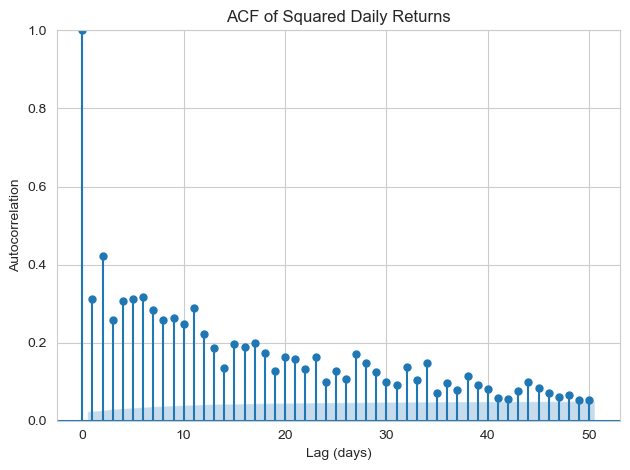

In [4]:
rets = sp_ret.dropna()
abs_ret = np.abs(rets)
sq_ret  = rets**2

plt.figure(figsize=(8, 5))
plot_acf(sq_ret, lags=50)
plt.title("ACF of Squared Daily Returns")
plt.xlabel("Lag (days)")
plt.ylabel("Autocorrelation")
plt.ylim(0, 1) 
plt.tight_layout()
plt.show()

# 2. Modelling
## 2.1 GARCH MODEL SELECTION

In [5]:
def fit_garch_model(returns, vol='Garch', p=1, q=1, dist='normal'):
    try:
        model = arch_model(returns, vol=vol, p=p, q=q, dist=dist)
        res = model.fit(disp='off')
        return res
    except:
        return None

def garch_model_selection(returns):
    results = []
    
    specs = [
        ('Garch', 1, 1), ('Garch', 1, 2), ('Garch', 2, 1), ('Garch', 2, 2),
        ('GJR-GARCH', 1, 1), ('EGARCH', 1, 1)
    ]
    
    distributions = ['normal', 't', 'skewt']
    
    for vol, p, q in specs:
        for dist in distributions:
            res = fit_garch_model(returns, vol, p, q, dist)
            if res is None:
                continue
            
            resid = res.std_resid.dropna()
            
            lb_pvalue = acorr_ljungbox(resid, lags=[10], return_df=True)['lb_pvalue'].iloc[0]
            arch_pvalue = het_arch(resid)[1]
            
            if dist == 'normal':
                ks_pvalue = kstest(resid, 'norm')[1]
            else:
                ks_pvalue = kstest(resid, 't', args=(res.params['nu'],))[1] if 'nu' in res.params else np.nan
            
            results.append({
                'Model': f'{vol}({p},{q})',
                'Distribution': dist,
                'AIC': res.aic,
                'BIC': res.bic,
                'LogLik': res.loglikelihood,
                'LB_pvalue': lb_pvalue,
                'ARCH_pvalue': arch_pvalue,
                'KS_pvalue': ks_pvalue
            })
    
    return pd.DataFrame(results).sort_values(['BIC','AIC'])


results = garch_model_selection(sp_ret)
results

C:\Users\PC\AppData\Local\Temp\ipykernel_18732\3666611171.py:4: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  res = model.fit(disp='off')
C:\Users\PC\AppData\Local\Temp\ipykernel_18732\3666611171.py:4: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  res = model.fit(disp='off')
C:\Users\PC\AppData\Local\Temp\ipykernel_18732\3666611171.py:4: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  res = model.fit(disp='off')
C:\Users\PC\AppData\Local\Temp\ipykernel_18732\3666611171.py:4: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  res = model.fit(disp='off')
C:\Users\PC\AppD

,Model,Distribution,AIC,BIC,LogLik,LB_pvalue,ARCH_pvalue,KS_pvalue
12,"EGARCH(1,1)",normal,-4.186292e+04,-4.183580e+04,2.093546e+04,1.754836e-02,4.308320e-03,7.930633e-10
7,"Garch(2,1)",t,-3.904422e+04,-3.900354e+04,1.952811e+04,1.551334e-07,5.062262e-234,0.000000e+00
9,"Garch(2,2)",normal,-3.367702e+04,-3.363635e+04,1.684451e+04,4.313708e-08,1.080273e-16,0.000000e+00
6,"Garch(2,1)",normal,-3.169473e+04,-3.166084e+04,1.585237e+04,1.030149e-10,2.668568e-28,0.000000e+00
3,"Garch(1,2)",normal,2.349444e+04,2.352833e+04,-1.174222e+04,9.778798e-01,1.188148e-110,0.000000e+00
8,"Garch(2,1)",skewt,2.698100e+04,2.702845e+04,-1.348350e+04,9.774752e-01,0.000000e+00,NaN
13,"EGARCH(1,1)",t,7.153387e+04,7.156776e+04,-3.576194e+04,1.000000e+00,0.000000e+00,0.000000e+00
14,"EGARCH(1,1)",skewt,8.486259e+04,8.490326e+04,-4.242530e+04,9.995873e-01,1.000000e+00,NaN
1,"Garch(1,1)",t,1.397101e+05,1.397440e+05,-6.985006e+04,9.687236e-08,0.000000e+00,0.000000e+00
0,"Garch(1,1)",normal,1.519729e+05,1.520000e+05,-7.598247e+04,9.999927e-01,0.000000e+00,0.000000e+00


## 2.2. Model Budiling

In [10]:
def rolling_var_monthly(returns, alphas, rolling_window, forecast_horizons,
                        start_date, end_date, regime_name):

    returns = returns.sort_index()
    idx = returns.index
    start_date = pd.to_datetime(start_date)
    end_date   = pd.to_datetime(end_date)

    out = []

    for i in range(rolling_window - 1, len(idx) - max(forecast_horizons)):

        window_end   = idx[i]
        window_start = idx[i - rolling_window + 1]
        r_win = returns.iloc[i - rolling_window + 1: i + 1]

        if len(r_win) < 200:
            continue

        # --- GARCH(2,2) ---
        am = arch_model(r_win * 100, p=2, q=2, vol="GARCH",
                        dist="normal", o=0, rescale=False)
        res = am.fit(disp="off")

        std_resid = res.resid / res.conditional_volatility

        for h in forecast_horizons:

            if i + h >= len(idx):
                continue

            var_date = idx[i + h]

            if not (start_date <= var_date <= end_date):
                continue

            fcast = res.forecast(horizon=h, reindex=False)
            mu_h  = fcast.mean.values[-1, h - 1] / 100
            sig_h = np.sqrt(fcast.variance.values[-1, h - 1]) / 100
            actual = float(returns.loc[var_date].iloc[0] if isinstance(returns.loc[var_date], pd.Series) else returns.loc[var_date])

            for a in alphas:

                # FHS VaR
                q_alpha = np.quantile(std_resid, a)
                var_fhs = mu_h + sig_h * q_alpha

                # Cantelli VaR
                k = np.sqrt((1 - a) / a)
                var_cant = mu_h - k * sig_h

                model_name = f"{regime_name}_{a}_{h}"

                out.append({
                    "ModelName": model_name,
                    "Alpha": a,
                    "ForecastHorizon": h,
                    "VaR_Estimation_Date": var_date,
                    "RollingStart": window_start,
                    "RollingEnd": window_end,
                    "FHS_VaR": var_fhs,
                    "Cantelli_VaR": var_cant,
                    "ActualReturn": actual,
                    "VaR_Ratio": var_fhs/var_cant,
                    "Breach_FHS": int(actual < var_fhs),
                    "Breach_Cantelli": int(actual < var_cant),
                    "Regime": regime_name
                })

    df = pd.DataFrame(out)
    df.sort_values(["VaR_Estimation_Date", "ForecastHorizon", "Alpha"], inplace=True)
    df.reset_index(drop=True, inplace=True)
    return df

alphas = [0.05, 0.03, 0.01]
rolling_window = 252 * 5
forecast_horizons = [1, 5, 10, 21] 

In [11]:
df_full = rolling_var_monthly(sp_ret, alphas, rolling_window, forecast_horizons,
                              "2007-10-01", "2025-10-30", "FullSample")

df_crisis = rolling_var_monthly(sp_ret, alphas, rolling_window, forecast_horizons,
                                "2008-01-01", "2009-12-31", "Crisis")

df_covid  = rolling_var_monthly(sp_ret, alphas, rolling_window, forecast_horizons,
                                "2020-01-01", "2020-12-31", "COVID")

df_infl   = rolling_var_monthly(sp_ret, alphas, rolling_window, forecast_horizons,
                                "2022-01-01", "2022-12-31", "Inflation")

## 3 TEST EXECUTION

## 3.1 VAR BACK TEST

In [17]:
def var_backtest(df: pd.DataFrame) -> pd.DataFrame:
    
    out = []

    for (alpha, h), sub in df.groupby(["Alpha", "ForecastHorizon"]):

        r  = sub["ActualReturn"].astype(float).values
        vg = sub["FHS_VaR"].astype(float).values
        vc = sub["Cantelli_VaR"].astype(float).values

        n = len(r)
        if n == 0:
            continue

        # Breaches
        v = (r < vg).astype(int)
        g_breach = v.sum()
        exp_breach = round(n * alpha)          

        # VaR ratio
        mean_ratio = np.nanmean(vg / vc)

        # ---------- Kupiec UC Test ----------
        if g_breach in (0, n):
            uc_p = 1.0
        else:
            pi_hat = g_breach / n
            logL0  = g_breach*np.log(alpha) + (n-g_breach)*np.log(1-alpha)
            logL1  = g_breach*np.log(pi_hat) + (n-g_breach)*np.log(1-pi_hat)
            lr_uc = -2*(logL0 - logL1)
            uc_p  = 1 - chi2.cdf(lr_uc, 1)

        UC_pass = (uc_p > alpha)               

        # ---------- Christoffersen IND Test ----------
        n00 = n01 = n10 = n11 = 0
        for i in range(1, n):
            a, b = v[i-1], v[i]
            if a==0 and b==0: n00 += 1
            if a==0 and b==1: n01 += 1
            if a==1 and b==0: n10 += 1
            if a==1 and b==1: n11 += 1

        n0 = n00 + n01
        n1 = n10 + n11

        if n0 == 0 or n1 == 0:
            ind_p = 1.0
        else:
            p01 = n01 / n0 if n0 > 0 else 0
            p11 = n11 / n1 if n1 > 0 else 0
            p1  = (n01 + n11) / (n0 + n1)
            if p01 in (0,1) or p11 in (0,1) or p1 in (0,1):
                ind_p = 1.0
            else:
                logL1 = n00*np.log(1-p01) + n01*np.log(p01) + \
                        n10*np.log(1-p11) + n11*np.log(p11)
                logL0 = (n00+n10)*np.log(1-p1) + (n01+n11)*np.log(p1)
                lr_ind = -2*(logL0 - logL1)
                ind_p = 1 - chi2.cdf(lr_ind, 1)

        IND_pass = (ind_p > alpha)             

        
        breach_rate_pct = f"{(g_breach/n)*100:.2f}%"

        
        out.append({
            "Alpha": alpha,
            "ForecastHorizon": h,
            "Obs": n,
            "ExpB": exp_breach,
            "ActB": g_breach,
            "Breach_Rate": breach_rate_pct,
            "Mean_Ratio": mean_ratio,
            "UC_p": uc_p,
            "UC_pass": UC_pass,
            "IND_p": ind_p,
            "IND_pass": IND_pass
        })

    return pd.DataFrame(out)


    return pd.DataFrame(out)


stats_full   = var_backtest(df_full)
stats_crisis = var_backtest(df_crisis)
stats_covid  = var_backtest(df_covid)
stats_infl   = var_backtest(df_infl)

with pd.ExcelWriter("FHS_var.xlsx", engine="xlsxwriter") as writer:
    stats_full.to_excel(writer, sheet_name="FullSample", index=False)
    stats_crisis.to_excel(writer, sheet_name="Crisis", index=False)
    stats_covid.to_excel(writer, sheet_name="COVID", index=False)
    stats_infl.to_excel(writer, sheet_name="Inflation", index=False)


In [18]:
stats_full

,Alpha,ForecastHorizon,Obs,ExpB,ActB,Breach_Rate,Mean_Ratio,UC_p,UC_pass,IND_p,IND_pass
0,0.01,1,4530,45,59,1.30%,0.279204,0.050612,True,0.048797,True
1,0.01,5,4534,45,67,1.48%,0.279591,0.002539,False,0.000005,False
2,0.01,10,4539,45,68,1.50%,0.279873,0.001682,False,0.000059,False
3,0.01,21,4550,46,67,1.47%,0.280162,0.002762,False,0.000048,False
4,0.03,1,4530,136,137,3.02%,0.376324,0.923773,True,0.674042,True
5,0.03,5,4534,136,137,3.02%,0.376932,0.932088,True,0.031570,True
6,0.03,10,4539,136,150,3.30%,0.377375,0.236248,True,0.005121,False
7,0.03,21,4550,136,140,3.08%,0.377851,0.761948,True,0.001480,False
8,0.05,1,4530,226,230,5.08%,0.402423,0.811864,True,0.921808,True
9,0.05,5,4534,227,215,4.74%,0.403199,0.421455,True,0.234351,True


In [19]:
stats_crisis

,Alpha,ForecastHorizon,Obs,ExpB,ActB,Breach_Rate,Mean_Ratio,UC_p,UC_pass,IND_p,IND_pass
0,0.01,1,505,5,10,1.98%,0.256091,0.050853,True,1.000000,True
1,0.01,5,505,5,12,2.38%,0.256032,0.008291,False,1.000000,True
2,0.01,10,505,5,15,2.97%,0.255965,0.000318,False,1.000000,True
3,0.01,21,505,5,15,2.97%,0.255813,0.000318,False,0.458681,True
4,0.03,1,505,15,22,4.36%,0.363999,0.093673,True,1.000000,True
5,0.03,5,505,15,26,5.15%,0.363918,0.010044,False,1.000000,True
6,0.03,10,505,15,29,5.74%,0.363780,0.001292,False,1.000000,True
7,0.03,21,505,15,29,5.74%,0.363427,0.001292,False,0.555974,True
8,0.05,1,505,25,37,7.33%,0.399759,0.024414,False,1.000000,True
9,0.05,5,505,25,41,8.12%,0.399469,0.003059,False,1.000000,True


In [20]:
stats_covid

,Alpha,ForecastHorizon,Obs,ExpB,ActB,Breach_Rate,Mean_Ratio,UC_p,UC_pass,IND_p,IND_pass
0,0.01,1,253,3,4,1.58%,0.311841,0.391833,True,1.000000,True
1,0.01,5,253,3,8,3.16%,0.312165,0.005837,False,0.236735,True
2,0.01,10,253,3,13,5.14%,0.312386,0.000003,False,0.155513,True
3,0.01,21,253,3,13,5.14%,0.312550,0.000003,False,0.021381,True
4,0.03,1,253,8,12,4.74%,0.368248,0.133310,True,1.000000,True
5,0.03,5,253,8,12,4.74%,0.368935,0.133310,True,0.586753,True
6,0.03,10,253,8,18,7.11%,0.369474,0.001062,False,0.031627,True
7,0.03,21,253,8,21,8.30%,0.370258,0.000044,False,0.340828,True
8,0.05,1,253,13,19,7.51%,0.392433,0.087111,True,0.625344,True
9,0.05,5,253,13,14,5.53%,0.393283,0.701612,True,0.797379,True


In [21]:
stats_infl

,Alpha,ForecastHorizon,Obs,ExpB,ActB,Breach_Rate,Mean_Ratio,UC_p,UC_pass,IND_p,IND_pass
0,0.01,1,251,3,1,0.40%,0.308097,0.275614,True,1.000000,True
1,0.01,5,251,3,2,0.80%,0.308639,0.737311,True,1.000000,True
2,0.01,10,251,3,0,0.00%,0.309299,1.000000,True,1.000000,True
3,0.01,21,251,3,2,0.80%,0.310660,0.737311,True,1.000000,True
4,0.03,1,251,8,8,3.19%,0.381733,0.863282,True,1.000000,True
5,0.03,5,251,8,6,2.39%,0.381960,0.557548,True,1.000000,True
6,0.03,10,251,8,7,2.79%,0.382201,0.842728,True,1.000000,True
7,0.03,21,251,8,7,2.79%,0.382649,0.842728,True,1.000000,True
8,0.05,1,251,13,18,7.17%,0.402149,0.137211,True,0.532325,True
9,0.05,5,251,13,17,6.77%,0.402323,0.220315,True,0.873764,True


## 3.2. ROLLING RATIO

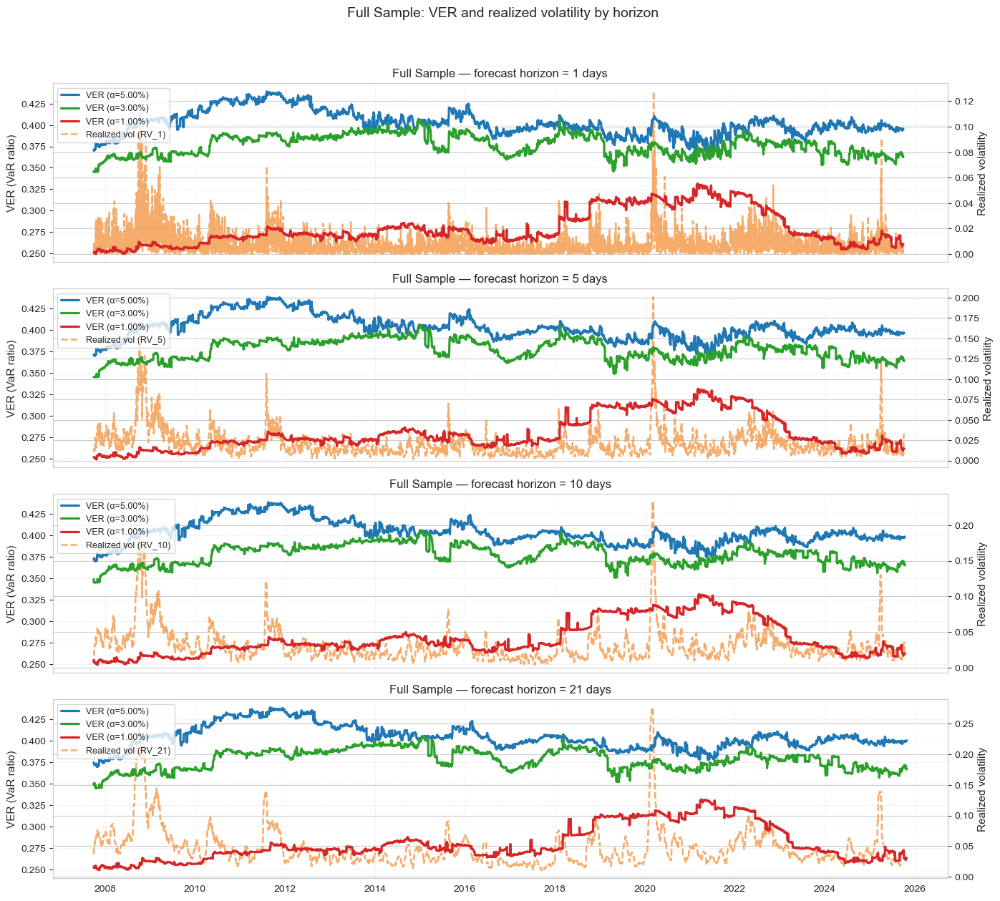

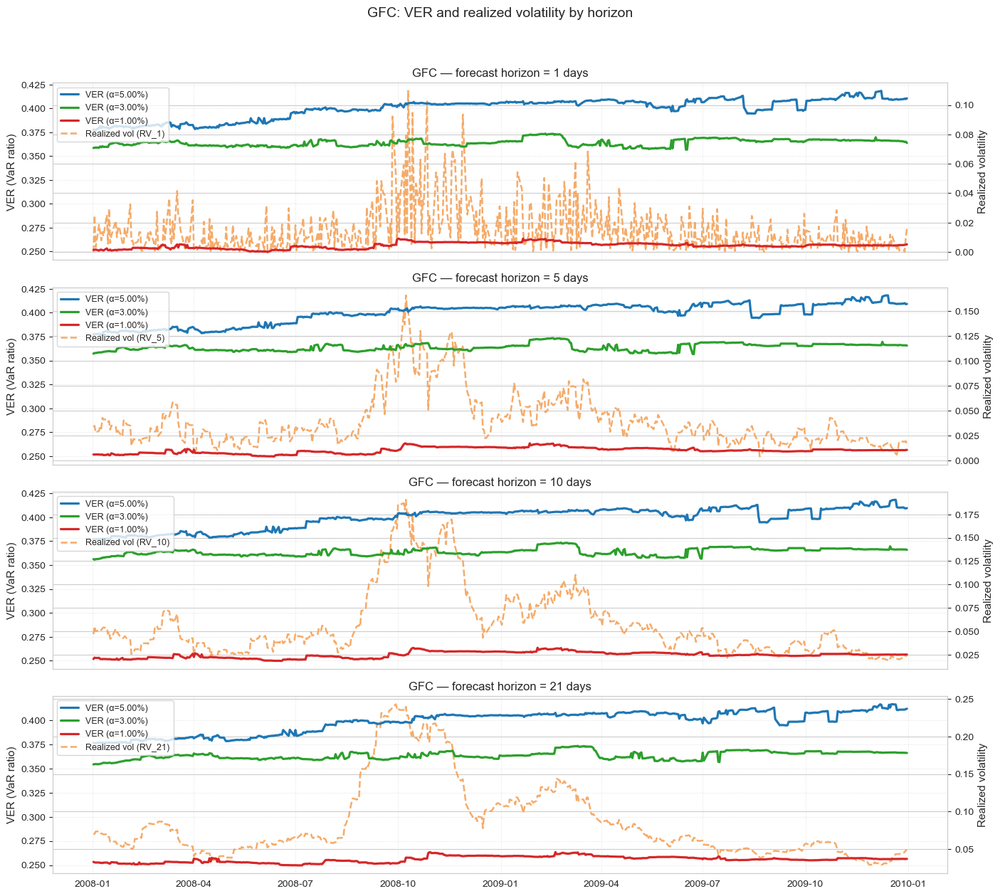

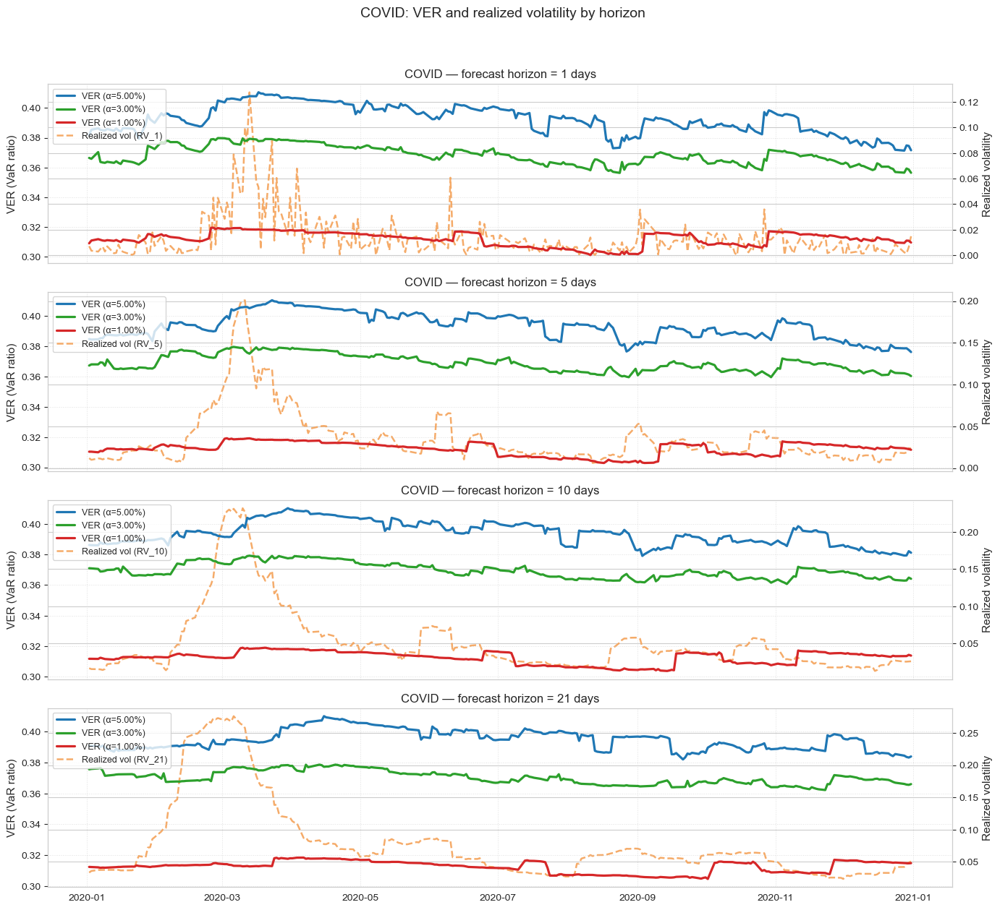

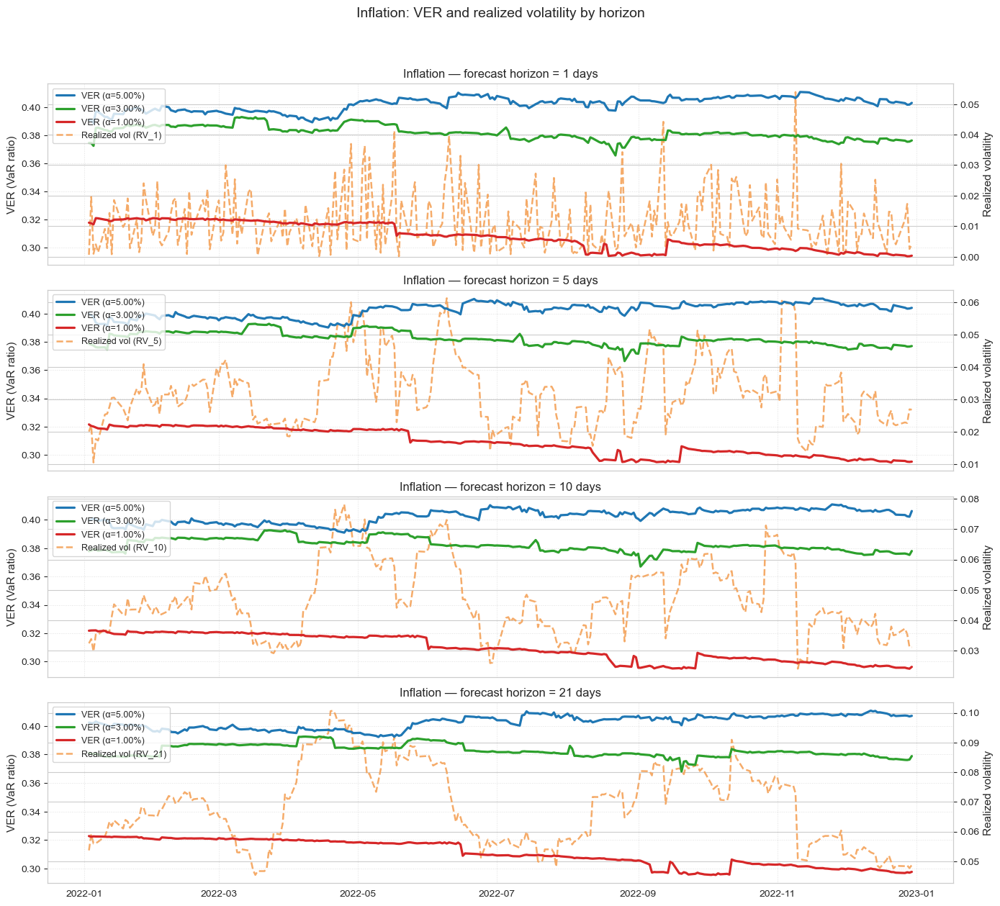

In [23]:
def compute_realized_vol(returns, horizons):
    rv = {}
    r = returns.values
    idx = returns.index

    for h in horizons:
        arr = np.full(len(r), np.nan)
        for i in range(len(r) - h):
            # forward h-day realised vol
            arr[i] = np.sqrt(np.sum(r[i+1:i+h+1] ** 2))
        rv[h] = pd.Series(arr, index=idx, name=f"RV_{h}")

    return rv


def plot_scope_single_figure(df, rv_dict, alphas, horizons, name):
    
    alpha_colors = {
        0.05: "tab:blue",
        0.03: "tab:green",
        0.01: "tab:red"
    }

    fig, axes = plt.subplots(
        len(horizons), 1,
        figsize=(14, 3.2 * len(horizons)),
        sharex=True
    )

    if len(horizons) == 1:
        axes = [axes]

    for j, h in enumerate(horizons):
        ax = axes[j]          
        ax2 = ax.twinx()      

        rv_series = rv_dict[h]

        
        df_h = df[df["ForecastHorizon"] == h].copy()
        if df_h.empty:
            continue

        
        all_dates = pd.to_datetime(df_h["VaR_Estimation_Date"].unique())
        all_dates = pd.Index(all_dates).sort_values()        
        rv_aligned = rv_series.reindex(all_dates)

        handles_left = []
        labels_left = []
        
        for a in alphas:
            sub = df_h[df_h["Alpha"] == a].copy()
            if sub.empty:
                continue

            sub = sub.set_index("VaR_Estimation_Date")
            sub.index = pd.to_datetime(sub.index)

            merged = sub.reindex(all_dates)

            line_vr, = ax.plot(
                merged.index,
                merged["VaR_Ratio"],
                lw=2.3,
                color=alpha_colors.get(a, "tab:gray"),
                label=f"VER (α={a:.2%})"
            )
            handles_left.append(line_vr)
            labels_left.append(f"VER (α={a:.2%})")

        
        line_rv, = ax2.plot(
            rv_aligned.index,
            rv_aligned.values,
            ls="--",
            lw=1.8,
            color="#f4a259",       
            alpha=0.9,
            label=f"Realized vol (RV_{h})"
        )

        
        ax.set_zorder(ax2.get_zorder() + 1)
        ax.patch.set_visible(False)

        
        ax.set_title(f"{name} — forecast horizon = {h} days", fontsize=12)
        ax.set_ylabel("VER (VaR ratio)", fontsize=11)
        ax2.set_ylabel("Realized volatility", fontsize=11)
        ax.grid(True, linestyle=":", linewidth=0.7, alpha=0.6)

        
        handles = handles_left + [line_rv]
        labels = labels_left + [f"Realized vol (RV_{h})"]
        if handles:
            ax.legend(handles, labels, loc="upper left", fontsize=9)

    fig.suptitle(f"{name}: VER and realized volatility by horizon", fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


alphas=[0.05,0.03,0.01]
horizons=[1,5,10,21]
rolling_window=252*5
rv_dict=compute_realized_vol(sp_ret,horizons)

plot_scope_single_figure(df_full, rv_dict, alphas, horizons, "Full Sample")
plot_scope_single_figure(df_crisis, rv_dict, alphas, horizons, "GFC")
plot_scope_single_figure(df_covid, rv_dict, alphas, horizons, "COVID")
plot_scope_single_figure(df_infl, rv_dict, alphas, horizons, "Inflation")


## 3.3 Ratio Spread

In [ ]:
def compute_ratio_spreads(df, alpha):
    df = df.copy()
    df = df[df["Alpha"] == alpha]
    df["ratio"] = df["FHS_VaR"].abs() / df["Cantelli_VaR"].abs()
    pivot = df.pivot(index="VaR_Estimation_Date",
                     columns="ForecastHorizon",
                     values="ratio").sort_index()
    return pivot.subtract(pivot[1], axis=0)

def plot_ratio_spreads_4panel(d1, d2, d3, d4, alpha, title_prefix="VaR Ratio Spreads"):
    spreads_list = [
        (compute_ratio_spreads(d1, alpha), "Full Sample"),
        (compute_ratio_spreads(d2, alpha), "GFC"),
        (compute_ratio_spreads(d3, alpha), "COVID"),
        (compute_ratio_spreads(d4, alpha), "Inflation Regime")
    ]

    fig, axes = plt.subplots(2, 2, figsize=(16, 10))
    axes = axes.flatten()

    for ax, (spreads, name) in zip(axes, spreads_list):
        for h, col in zip([5, 10, 21], ["blue", "green", "red"]):
            ax.plot(spreads.index, spreads[h], color=col, linewidth=2, alpha=0.45, label=f"h={h}-1")

        ax.axhline(0, color="black", linewidth=1)
        ax.set_title(f"{title_prefix} ({name}, α={alpha})")
        ax.set_ylabel("Ratio Spread")
        ax.set_xlabel("Date")
        ax.grid(alpha=0.3)
        ax.legend()

    plt.tight_layout()
    plt.show()

def plot_all_ratios_all_alphas(df_full, df_crisis, df_covid, df_infl, alphas=[0.01, 0.03, 0.05]):
    for a in alphas:
        plot_ratio_spreads_4panel(df_full, df_crisis, df_covid, df_infl, a)

plot_all_ratios_all_alphas(df_full, df_crisis, df_covid, df_infl)


## 3.4 Horizon Effect Test

In [28]:
def run_ver_panel_regression(df, ratio_col="VaR_Ratio",
                             date_col="VaR_Estimation_Date",
                             alpha_col="Alpha",
                             horizon_col="ForecastHorizon",
                             nw_lags=5):
    df_reg = df.copy()
    df_reg[date_col] = pd.to_datetime(df_reg[date_col])
    df_reg = df_reg.rename(columns={ratio_col: "VER"})
    df_reg = df_reg[[date_col, "VER", alpha_col, horizon_col]].dropna()
    df_reg = df_reg.sort_values(date_col)

    df_reg["Alpha_cat"] = df_reg[alpha_col].astype("category")
    df_reg["Horizon_cat"] = df_reg[horizon_col].astype("category")
    df_reg["Alpha_cat"] = df_reg["Alpha_cat"].cat.reorder_categories([0.05, 0.03, 0.01], ordered=True)
    df_reg["Horizon_cat"] = df_reg["Horizon_cat"].cat.reorder_categories([1, 5, 10, 21], ordered=True)

    df_reg = df_reg.set_index(date_col)

    formula = "VER ~ C(Alpha_cat) + C(Horizon_cat)"
    ols_model = smf.ols(formula=formula, data=df_reg).fit()
    ols_nw = ols_model.get_robustcov_results(cov_type="HAC", maxlags=nw_lags)
    return ols_nw
#results = run_ver_panel_regression(df_covid)
#results.summary()
ols_nw = run_ver_panel_regression(df_covid)
ols_nw.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    VER   R-squared:                       0.969
Model:                            OLS   Adj. R-squared:                  0.969
Method:                 Least Squares   F-statistic:                 2.570e+04
Date:                Sat, 14 Feb 2026   Prob (F-statistic):               0.00
Time:                        14:47:32   Log-Likelihood:                 11153.
No. Observations:                3036   AIC:                        -2.229e+04
Df Residuals:                    3030   BIC:                        -2.226e+04
Df Model:                           5                                         
Covariance Type:                  HAC                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept                0.3928      0.000    849.534      0.000       0.392       0.394
C(Alpha_cat)[T.0.03]    -0.0244      0.000    -96.133      0.000      -0.025      -0.024
C(Alpha_cat)[T.0.01]    -0.0814      0.000   -259.709      0.000      -0.082      -0.081
C(Horizon_cat)[T.5]      0.0006      0.000      2.092      0.037    3.89e-05       0.001
C(Horizon_cat)[T.10]     0.0011      0.000      2.597      0.009       0.000       0.002
C(Horizon_cat)[T.21]     0.0017      0.000      4.271      0.000       0.001       0.002
==============================================================================
Omnibus:                        0.078   Durbin-Watson:                   0.876
Prob(Omnibus):                  0.962   Jarque-Bera (JB):                0.114
Skew:                          -0.003   Prob(JB):                        0.945
Kurtosis:                       2.971   Cond. No.                         5.35
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity and autocorrelation robust (HAC) using 5 lags and without small sample correction
"""

In [29]:
# Joint test: all horizon dummies = 0
hypothesis_horizon = "C(Horizon_cat)[T.5] = 0, C(Horizon_cat)[T.10] = 0, C(Horizon_cat)[T.21] = 0"
print(ols_nw.f_test(hypothesis_horizon))

# Joint test: all alpha dummies = 0
hypothesis_alpha = "C(Alpha_cat)[T.0.03] = 0, C(Alpha_cat)[T.0.01] = 0"
print(ols_nw.f_test(hypothesis_alpha))


<F test: F=6.399461549079896, p=0.00025564844726307985, df_denom=3.03e+03, df_num=3>
<F test: F=60808.68035370158, p=0.0, df_denom=3.03e+03, df_num=2>


## 3.5 LOGIT MODEL

In [30]:
def run_breach_models_with_newey_west(df, scope_name, max_lags=None):

    results = []

    for (alpha, h), sub in df.groupby(["Alpha", "ForecastHorizon"]):

        sub = sub.dropna(subset=["VaR_Ratio", "Breach_FHS"])
        if sub["Breach_FHS"].nunique() < 2:
            continue

        X = sm.add_constant(sub["VaR_Ratio"])
        y = sub["Breach_FHS"]

        try:
            logit_m = sm.Logit(y, X).fit(cov_type='HAC', 
                                         cov_kwds={'maxlags': max_lags},
                                         disp=False)
            probit_m = sm.Probit(y, X).fit(cov_type='HAC', 
                                           cov_kwds={'maxlags': max_lags},
                                           disp=False)

            logit_p = logit_m.predict(X)
            probit_p = probit_m.predict(X)

            auc_logit = roc_auc_score(y, logit_p)
            auc_probit = roc_auc_score(y, probit_p)

            results.append({
                "Scope": scope_name,
                "Alpha": alpha,
                "ForecastHorizon": h,
                "Obs": len(sub),

                "Logit_Beta_Ratio": logit_m.params["VaR_Ratio"],
                "Logit_p_NeweyWest": logit_m.pvalues["VaR_Ratio"],
                "Logit_StdErr_NeweyWest": logit_m.bse["VaR_Ratio"],
                "AUC_Logit": auc_logit,
                "AR_Logit": 2*auc_logit - 1,

                "Probit_Beta_Ratio": probit_m.params["VaR_Ratio"],
                "Probit_p_NeweyWest": probit_m.pvalues["VaR_Ratio"],
                "Probit_StdErr_NeweyWest": probit_m.bse["VaR_Ratio"],
                "AUC_Probit": auc_probit,
                "AR_Probit": 2*auc_probit - 1,

                "Max_Lags": max_lags,
                "Cov_Type": "HAC"
            })

        except:
            continue

    return pd.DataFrame(results)


def run_robustness_analysis(df, scope_name):
    lag_specs = [None, 5, 10, 22]
    out = []
    for L in lag_specs:
        r = run_breach_models_with_newey_west(df, scope_name, max_lags=L)
        if not r.empty:
            out.append(r)
    return pd.concat(out, ignore_index=True) if out else pd.DataFrame()

res_full_nw  = run_breach_models_with_newey_west(df_full,  "FullSample", max_lags=10)
res_crisis_nw = run_breach_models_with_newey_west(df_crisis, "Crisis", max_lags=5)
res_covid_nw  = run_breach_models_with_newey_west(df_covid,  "COVID", max_lags=5)
res_infl_nw   = run_breach_models_with_newey_west(df_infl,   "Inflation", max_lags=5)

final_nw = pd.concat([res_full_nw, res_crisis_nw, res_covid_nw, res_infl_nw], ignore_index=True)

final_nw[
    ["Scope","Alpha","ForecastHorizon",
     "Logit_Beta_Ratio","Logit_p_NeweyWest","AUC_Logit",
     "Probit_Beta_Ratio","Probit_p_NeweyWest","AUC_Probit"]
].round(6)
final_nw

,Scope,Alpha,ForecastHorizon,Obs,Logit_Beta_Ratio,Logit_p_NeweyWest,Logit_StdErr_NeweyWest,AUC_Logit,AR_Logit,Probit_Beta_Ratio,Probit_p_NeweyWest,Probit_StdErr_NeweyWest,AUC_Probit,AR_Probit,Max_Lags,Cov_Type
0,FullSample,0.01,1,4530,-17.254503,0.044102,8.571007,0.618623,0.237246,-6.260232,0.036837,2.998817,0.618623,0.237246,10,HAC
1,FullSample,0.01,5,4534,-9.316181,0.268842,8.425335,0.577702,0.155405,-3.503253,0.259470,3.106702,0.577702,0.155405,10,HAC
2,FullSample,0.01,10,4539,-11.037599,0.395371,12.986671,0.601964,0.203929,-3.999519,0.382643,4.581155,0.601964,0.203929,10,HAC
3,FullSample,0.01,21,4550,-7.413591,0.566013,12.917164,0.586005,0.172010,-2.674585,0.557892,4.564332,0.586005,0.172010,10,HAC
4,FullSample,0.03,1,4530,-28.629149,0.000333,7.979117,0.593064,0.186127,-12.111822,0.000339,3.380188,0.593064,0.186127,10,HAC
5,FullSample,0.03,5,4534,-30.928362,0.000629,9.047077,0.601928,0.203857,-13.032977,0.000664,3.828530,0.601928,0.203857,10,HAC
6,FullSample,0.03,10,4539,-30.165167,0.000484,8.644493,0.600480,0.200960,-12.887416,0.000509,3.707555,0.600480,0.200960,10,HAC
7,FullSample,0.03,21,4550,-37.650658,0.000100,9.677177,0.620896,0.241791,-15.883728,0.000122,4.135237,0.620896,0.241791,10,HAC
8,FullSample,0.05,1,4530,-15.218949,0.003581,5.224618,0.562992,0.125984,-6.877393,0.003735,2.371714,0.562992,0.125984,10,HAC
9,FullSample,0.05,5,4534,-18.564717,0.002207,6.065298,0.570208,0.140417,-8.386655,0.002366,2.758773,0.570208,0.140417,10,HAC


## 4 Results Analysis
### 4.1 MARKOV || Breach Clustering

**Justification**
By formally applying a Markov chain approach (like Christoffersen's) to the ratio, you can statistically prove the existence of these "low ratio" regimes .

Proof of Persistence: If the test shows that a low ratio day is significantly more likely to be followed by another low ratio day than a random day, it scientifically validates the observation that model deterioration clusters .

Operational Trigger: This provides a data-driven justification for implementing an early warning system or an automatic model recalibration trigger. Instead of waiting for breaches to cluster (which means losses have already mounted), you trigger action when the diagnostic (the low ratio) clusters.

In [31]:
alphas = [0.05, 0.03, 0.01]
rolling_window = 252 * 5
forecast_horizons = [1, 5, 10, 21]   # multiple forecast days

def create_ratio_regimes(df, alpha_level=alphas, horizon=forecast_horizons, q=0.33):
    d = df[(df['Alpha']==alpha_level) & (df['ForecastHorizon']==horizon)].copy()
    lo = d['VaR_Ratio'].quantile(q)
    hi = d['VaR_Ratio'].quantile(1-q)
    d['Regime'] = np.where(d['VaR_Ratio']<=lo,'Low_Ratio',
                   np.where(d['VaR_Ratio']>=hi,'High_Ratio','Normal_Ratio'))
    return d, lo, hi

def markov_transition_matrix(s):
    uniq = list(s.unique())
    m = {u:i for i,u in enumerate(uniq)}
    k = len(uniq)
    c = np.zeros((k,k))
    for i in range(len(s)-1):
        c[m[s.iloc[i]], m[s.iloc[i+1]]] += 1
    p = c / c.sum(axis=1, keepdims=True)
    return np.nan_to_num(p), m

def christoffersen_independence_test(s, target='Low_Ratio'):
    n00=n01=n10=n11=0
    for i in range(len(s)-1):
        a=(s.iloc[i]==target); b=(s.iloc[i+1]==target)
        if not a and not b: n00+=1
        elif not a and b: n01+=1
        elif a and not b: n10+=1
        else: n11+=1
    n0,n1=n00+n01,n10+n11
    pi=(n01+n11)/(n0+n1) if (n0+n1)>0 else 0
    L_ind=((1-pi)**n0)*(pi**n1) if pi>0 else 0
    p01=n01/n0 if n0>0 else 0
    p11=n11/n1 if n1>0 else 0
    L_m=((1-p01)**n00)*(p01**n01)*((1-p11)**n10)*(p11**n11)
    LR=-2*np.log(L_ind/L_m) if L_ind>0 and L_m>0 else 0
    p=1-chi2.cdf(LR,1)
    return {"LR":LR,"p_value":p,"p01":p01,"p11":p11,"pi":pi,"persist":p11/pi if pi>0 else 0}

def early_warning_system(df, alpha, horizon):
    d,lo,hi = create_ratio_regimes(df,alpha,horizon)
    mat,map_ = markov_transition_matrix(d['Regime'])
    ctest = christoffersen_independence_test(d['Regime'])
    warns=[]; count=0; flag=False
    for date,row in d.iterrows():
        if row['Regime']=='Low_Ratio':
            count+=1
            if ctest['p_value']<0.05 and count>=2 and not flag:
                warns.append({"warning_start":date,"span":count,
                              "Alpha":alpha,"Horizon":horizon})
                flag=True
        else:
            count=0; flag=False
    return {"data":d,"mat":mat,"map":map_,"ctest":ctest,
            "warn":warns,"thr":{"low":lo,"high":hi}}

def plot_regime_analysis(res, alpha, horizon):
    d=res["data"]; warns=res["warn"]; thr=res["thr"]
    fig,(ax1,ax2)=plt.subplots(2,1,figsize=(15,9))
    colors={'Low_Ratio':'red','Normal_Ratio':'gray','High_Ratio':'green'}
    for r,c in colors.items():
        idx=d[d['Regime']==r].index
        ax1.scatter(idx,d.loc[idx,'VaR_Ratio'],color=c,s=10,label=r,alpha=0.6)
    ax1.axhline(thr['low'],color='red',ls='--')
    ax1.axhline(thr['high'],color='green',ls='--')
    for w in warns: ax1.axvline(w['warning_start'],color='orange',lw=2)
    ax1.set_title(f"Regime Map α={alpha}, h={horizon}")
    mat=res["mat"]; mp=res["map"]
    inv={v:k for k,v in mp.items()}
    im=ax2.imshow(mat,cmap="YlOrRd",vmin=0,vmax=1)
    lbl=[inv[i] for i in range(len(inv))]
    ax2.set_xticks(range(len(lbl))); ax2.set_yticks(range(len(lbl)))
    ax2.set_xticklabels(lbl); ax2.set_yticklabels(lbl)
    for i in range(len(lbl)):
        for j in range(len(lbl)):
            ax2.text(j,i,f"{mat[i,j]:.2f}",ha='center',va='center',
                     color="white" if mat[i,j]>0.5 else "black")
    plt.colorbar(im,ax=ax2)
    plt.tight_layout(); plt.show()

def comprehensive_regime_analysis(df, alphas=alphas, horizons=forecast_horizons):
    out={}
    for a in alphas:
        for h in horizons:
            try:
                r=early_warning_system(df,a,h)
                out[(a,h)]=r
                print(f"α={a:.1%}, h={h}: p={r['ctest']['p_value']:.4f}, warnings={len(r['warn'])}")
                plot_regime_analysis(r,a,h)
            except:
                continue
    return out

α=5.0%, h=1: p=1.0000, warnings=0


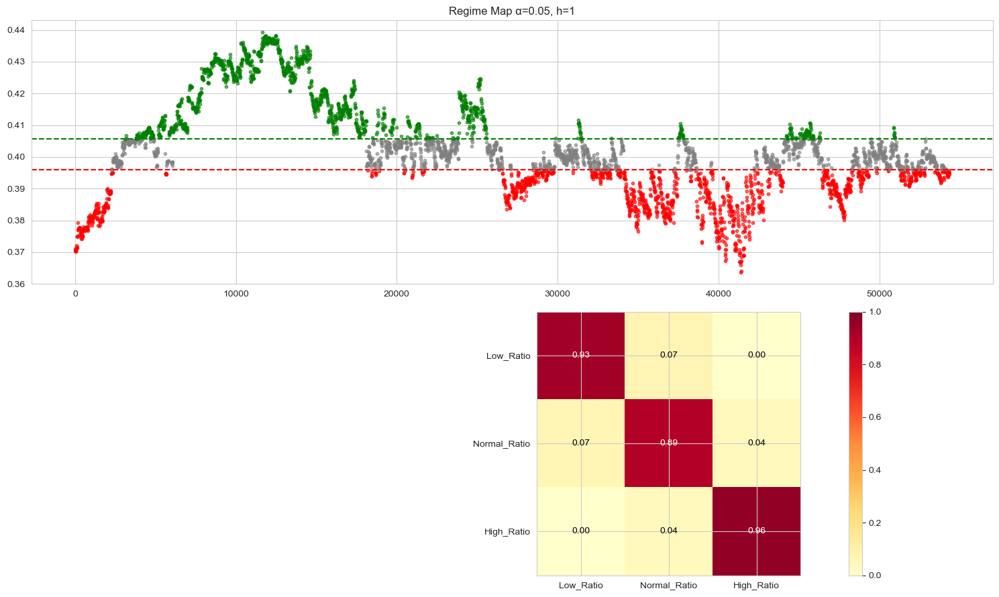

α=5.0%, h=5: p=1.0000, warnings=0


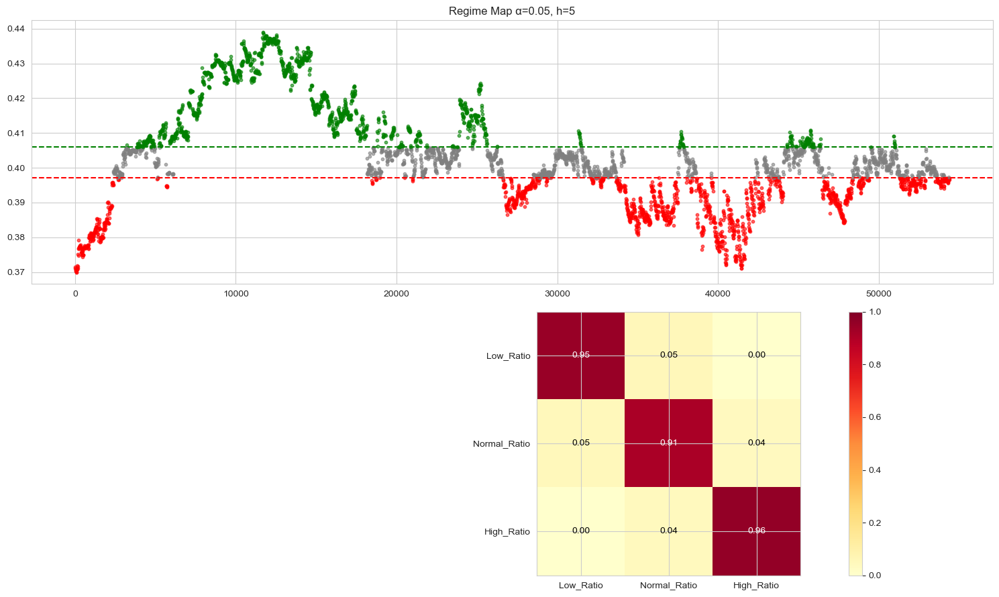

α=5.0%, h=10: p=1.0000, warnings=0


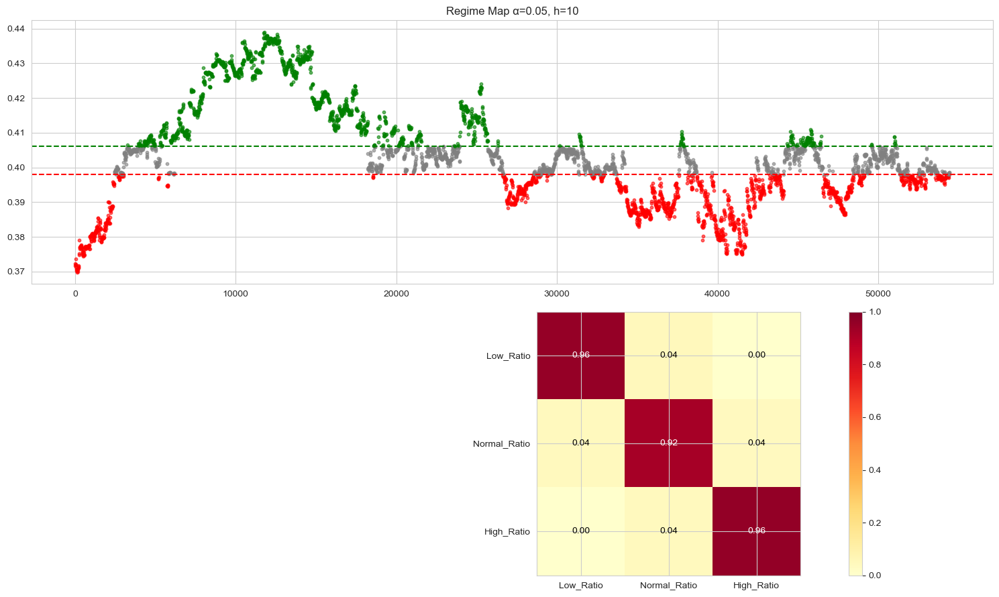

α=5.0%, h=21: p=1.0000, warnings=0


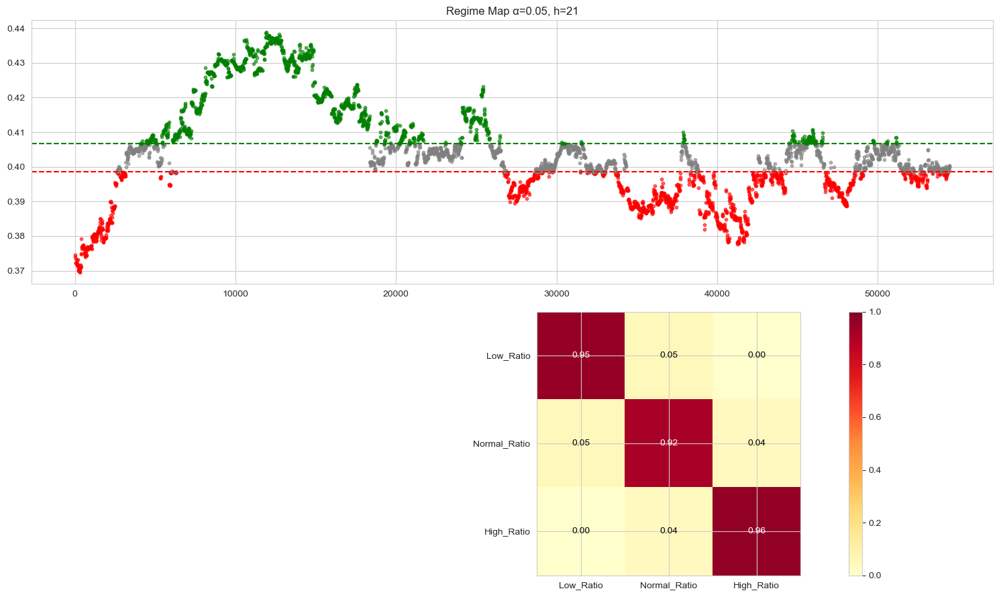

α=3.0%, h=1: p=1.0000, warnings=0


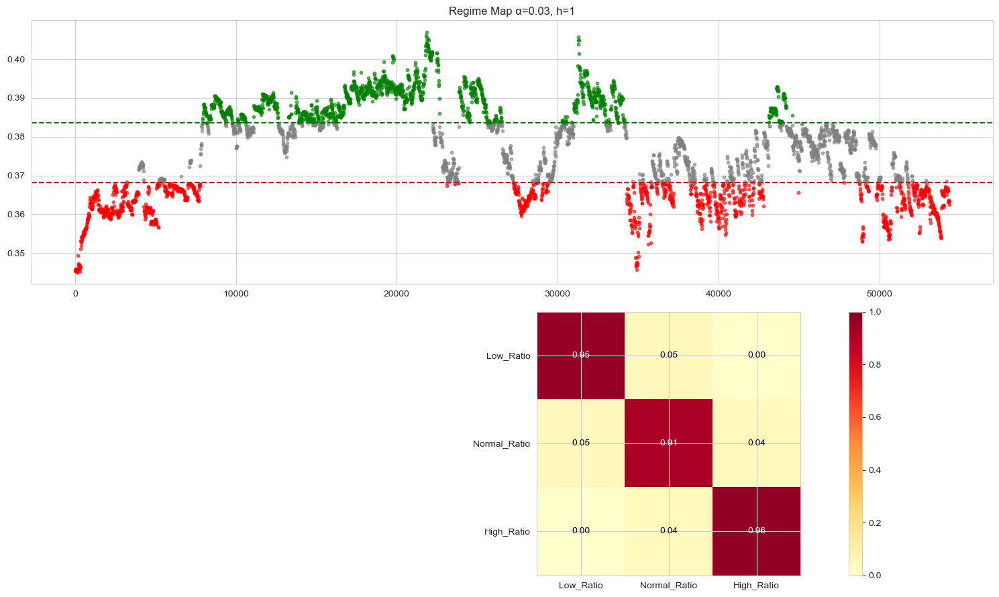

α=3.0%, h=5: p=1.0000, warnings=0


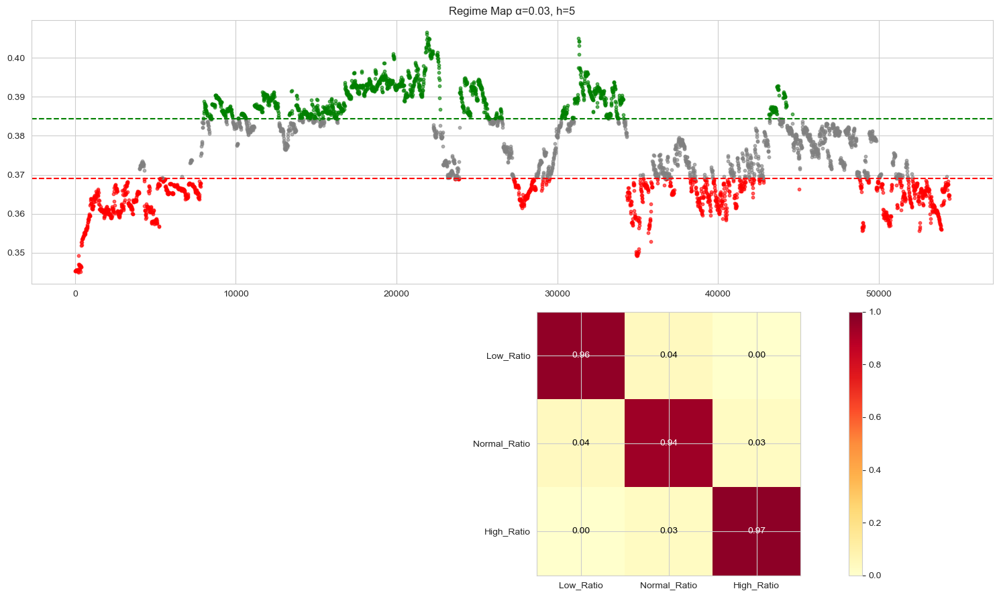

α=3.0%, h=10: p=1.0000, warnings=0


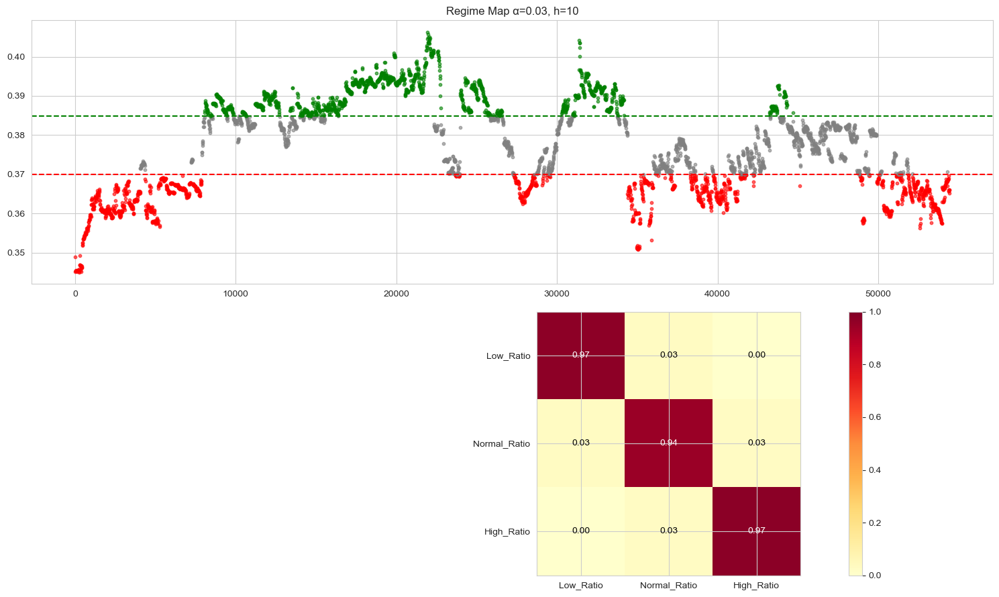

α=3.0%, h=21: p=1.0000, warnings=0


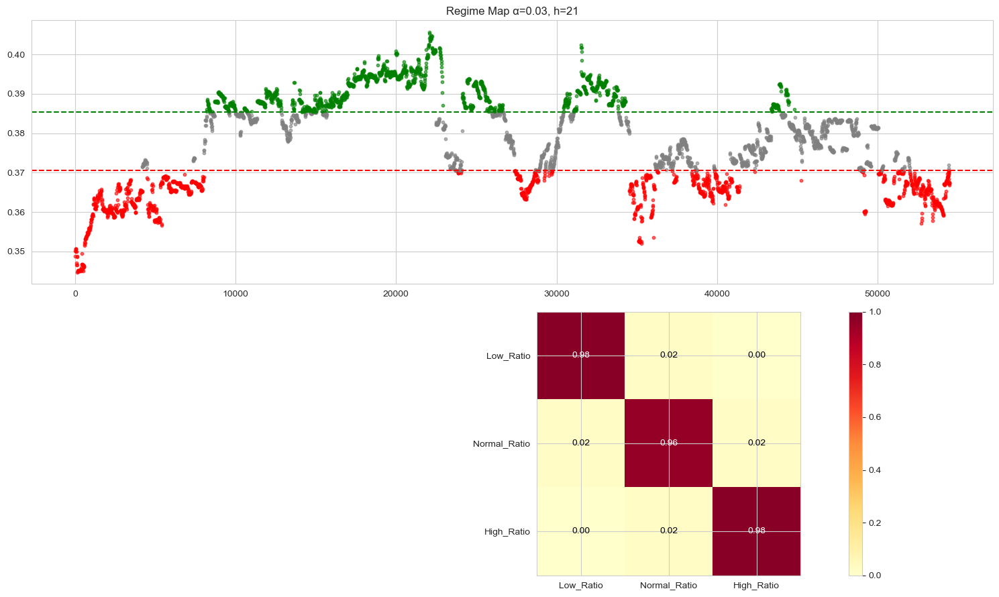

α=1.0%, h=1: p=1.0000, warnings=0


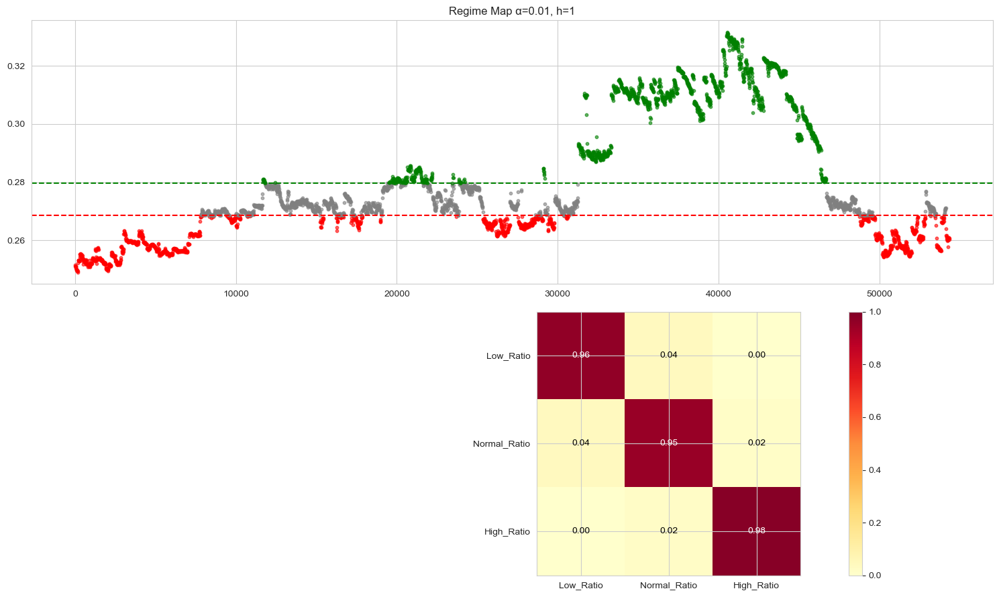

α=1.0%, h=5: p=1.0000, warnings=0


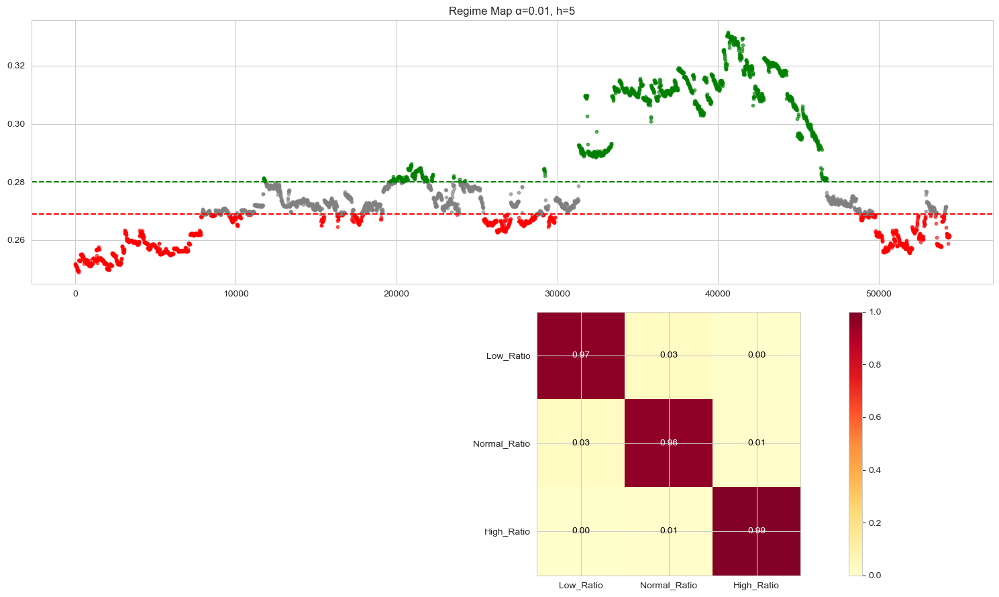

α=1.0%, h=10: p=1.0000, warnings=0


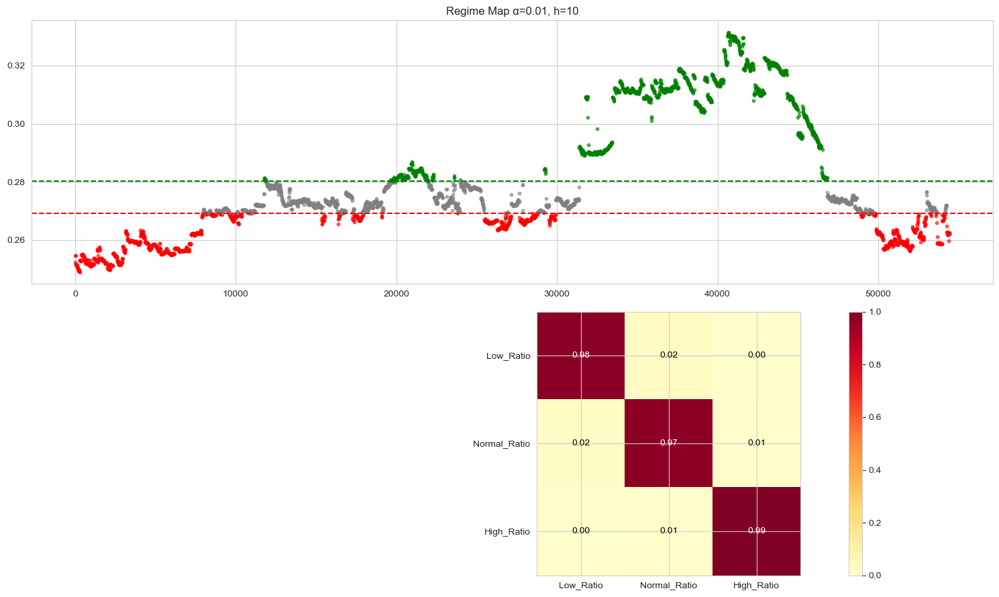

α=1.0%, h=21: p=1.0000, warnings=0


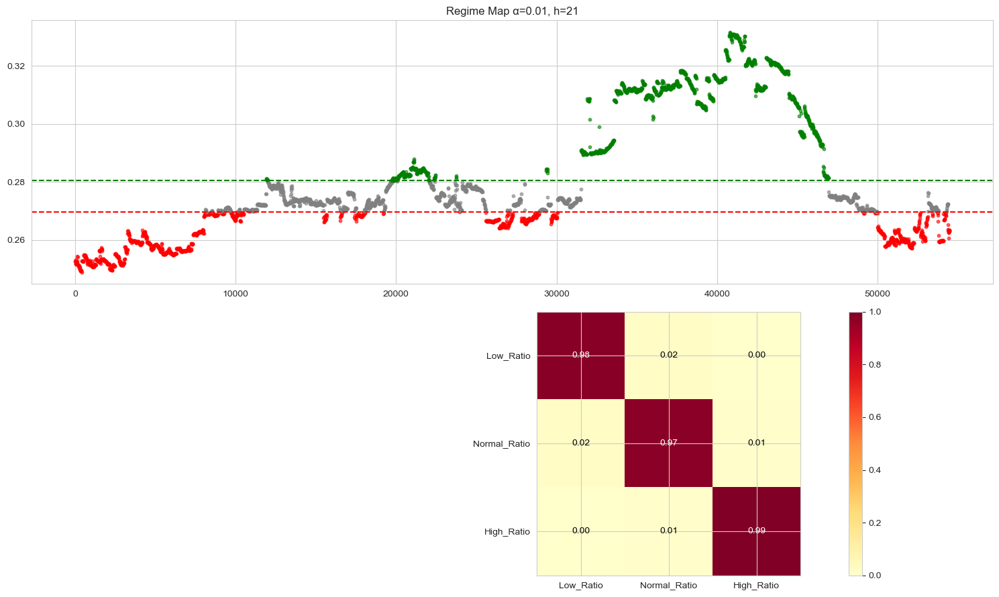

In [32]:
regime_results_full = comprehensive_regime_analysis(df_full)

α=5.0%, h=1: p=0.0000, warnings=7


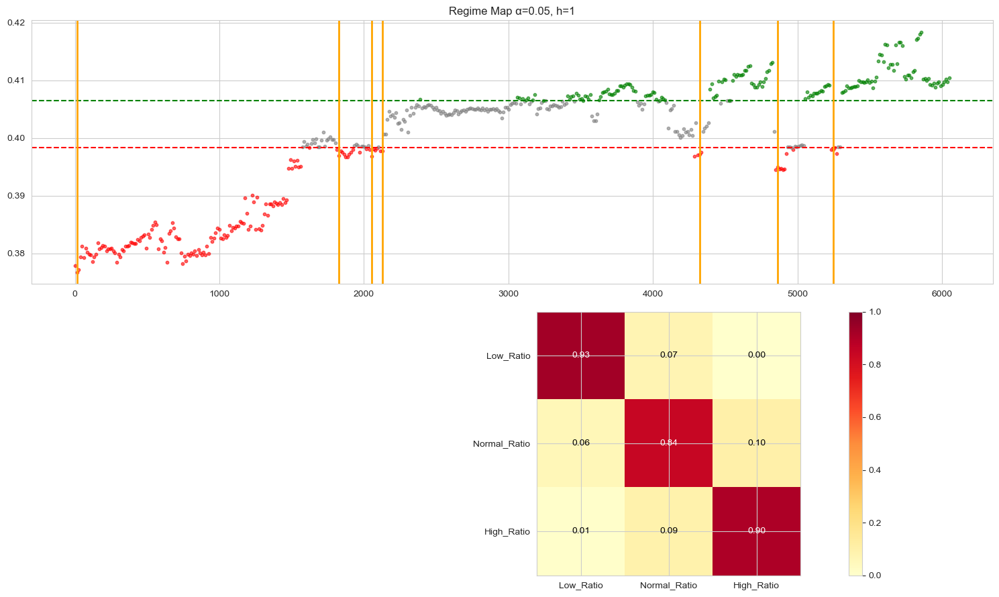

α=5.0%, h=5: p=0.0000, warnings=8


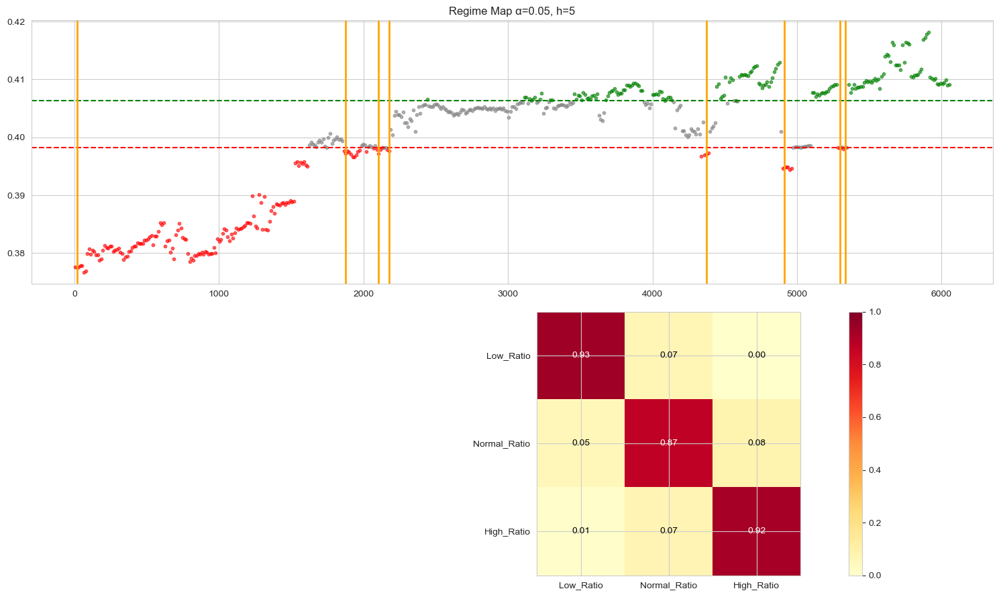

α=5.0%, h=10: p=0.0000, warnings=6


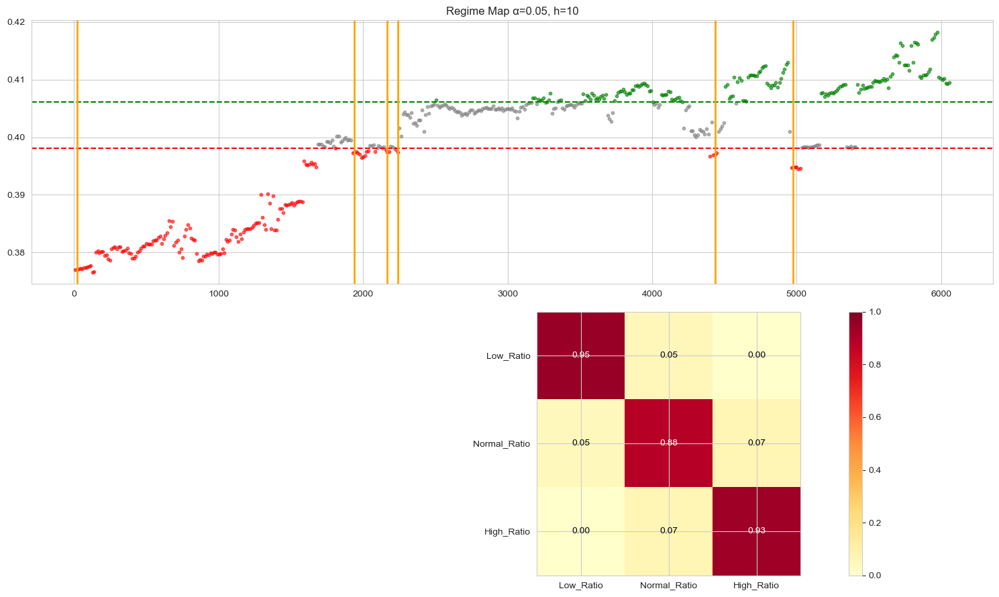

α=5.0%, h=21: p=0.0000, warnings=5


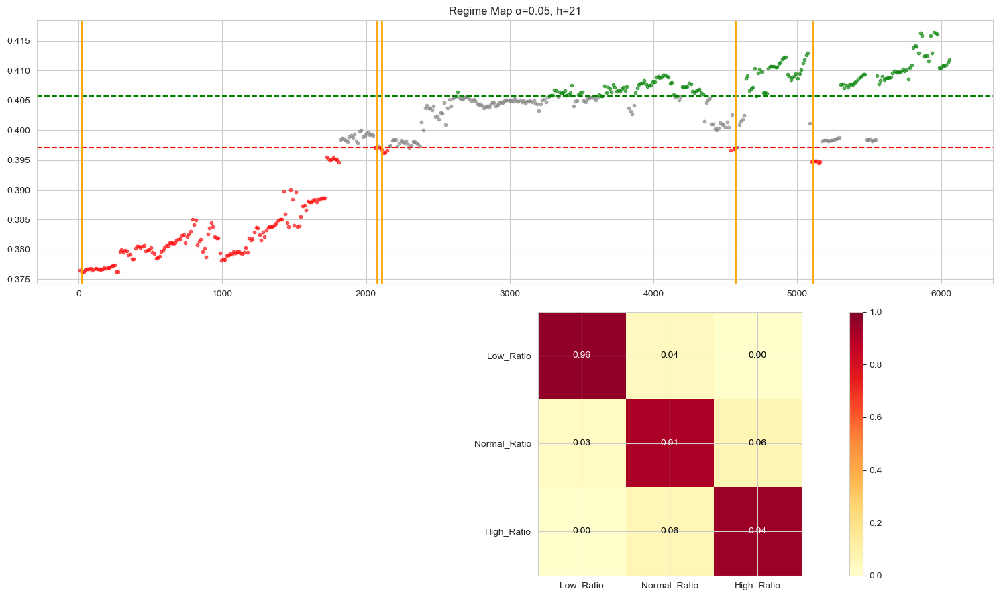

α=3.0%, h=1: p=0.0000, warnings=16


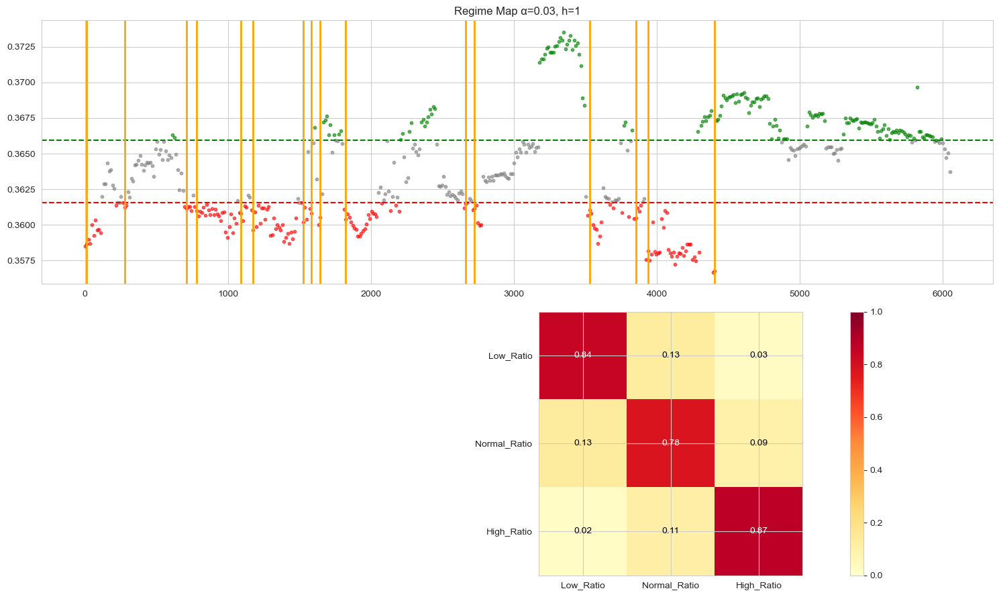

α=3.0%, h=5: p=0.0000, warnings=16


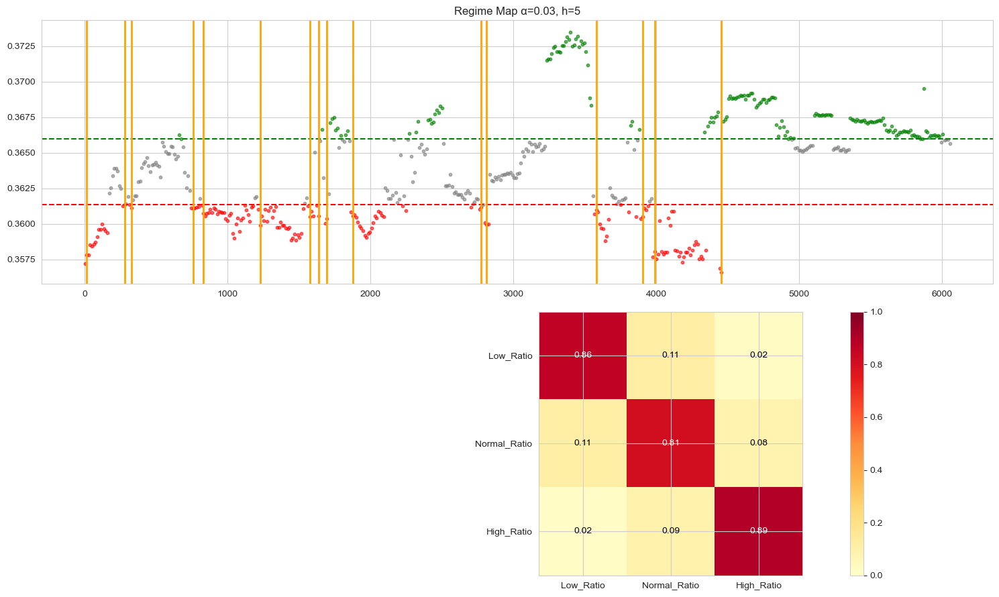

α=3.0%, h=10: p=0.0000, warnings=15


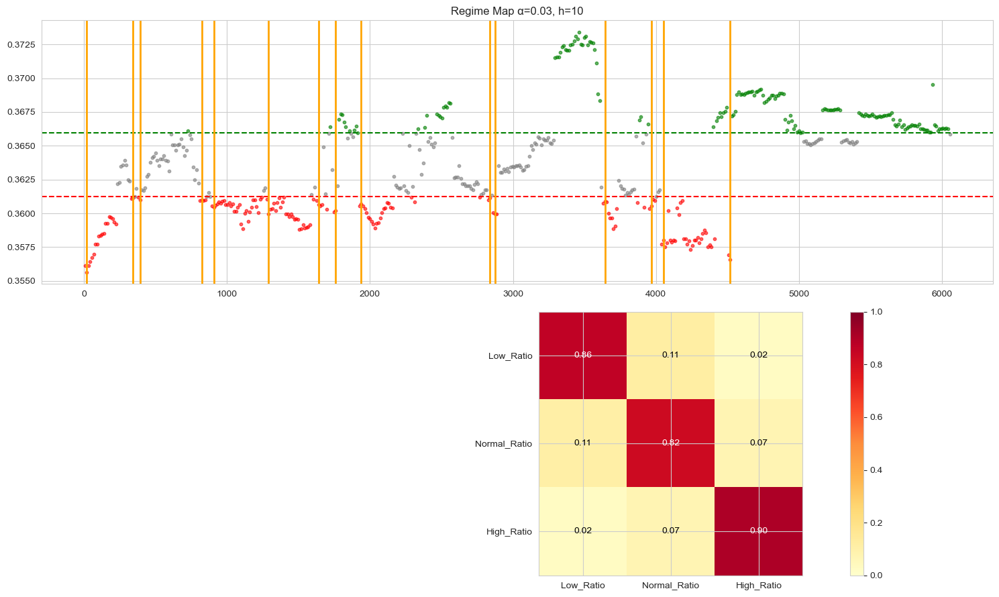

α=3.0%, h=21: p=0.0000, warnings=16


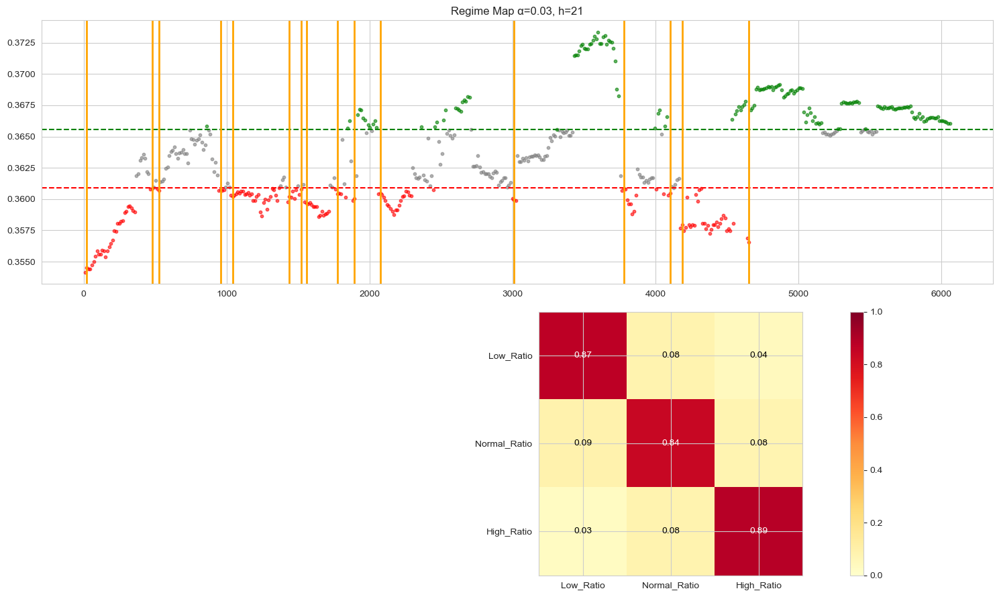

α=1.0%, h=1: p=0.0000, warnings=5


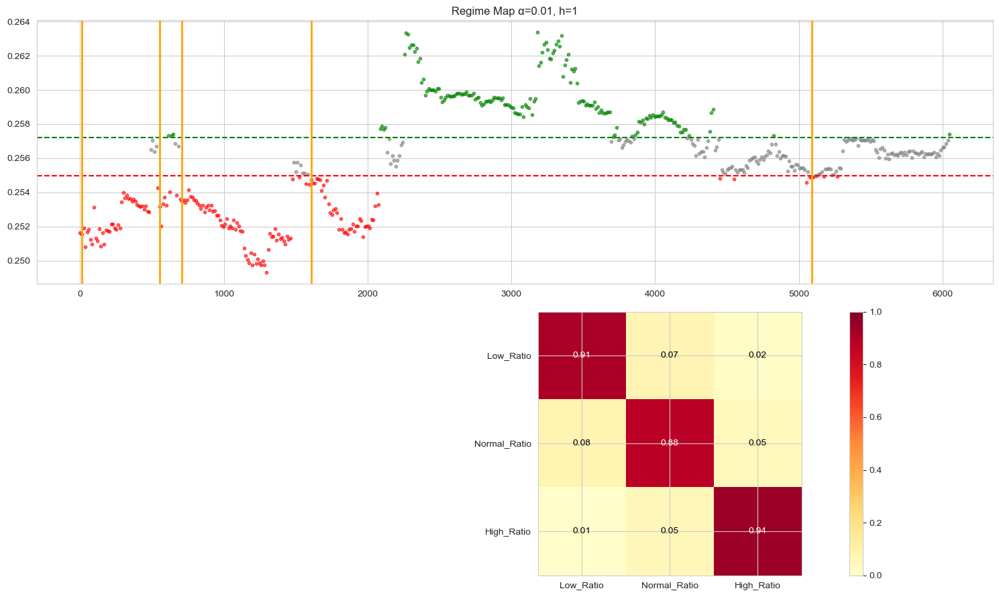

α=1.0%, h=5: p=0.0000, warnings=5


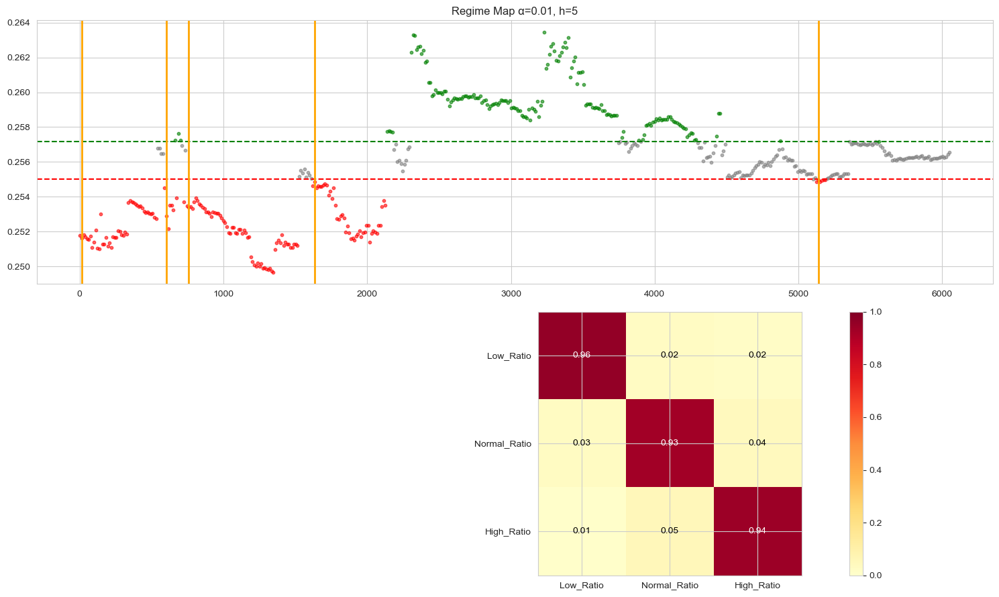

α=1.0%, h=10: p=0.0000, warnings=4


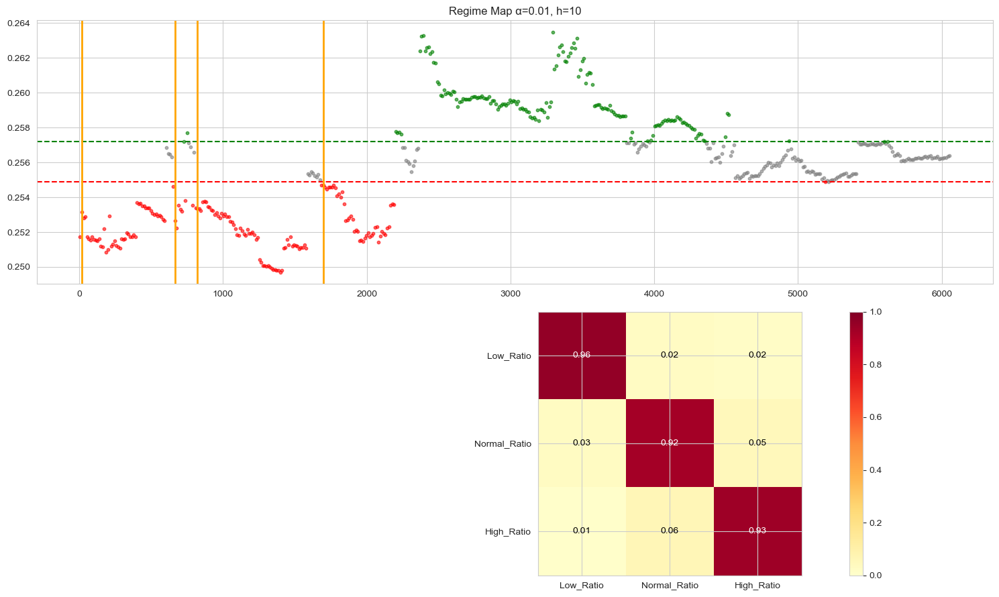

α=1.0%, h=21: p=0.0000, warnings=4


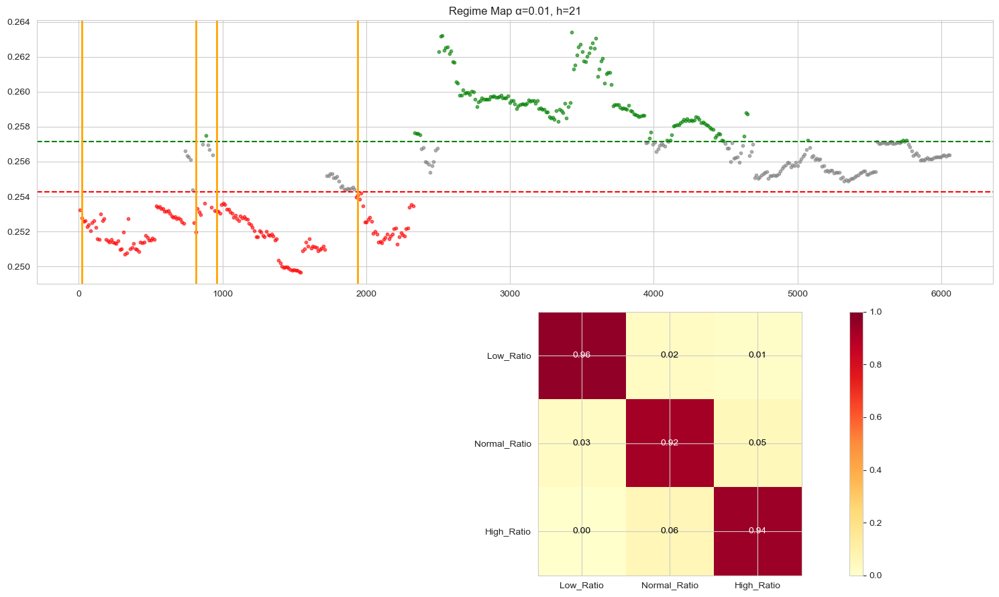

In [33]:
regime_results_crisis = comprehensive_regime_analysis(df_crisis)

α=5.0%, h=1: p=0.0000, warnings=8


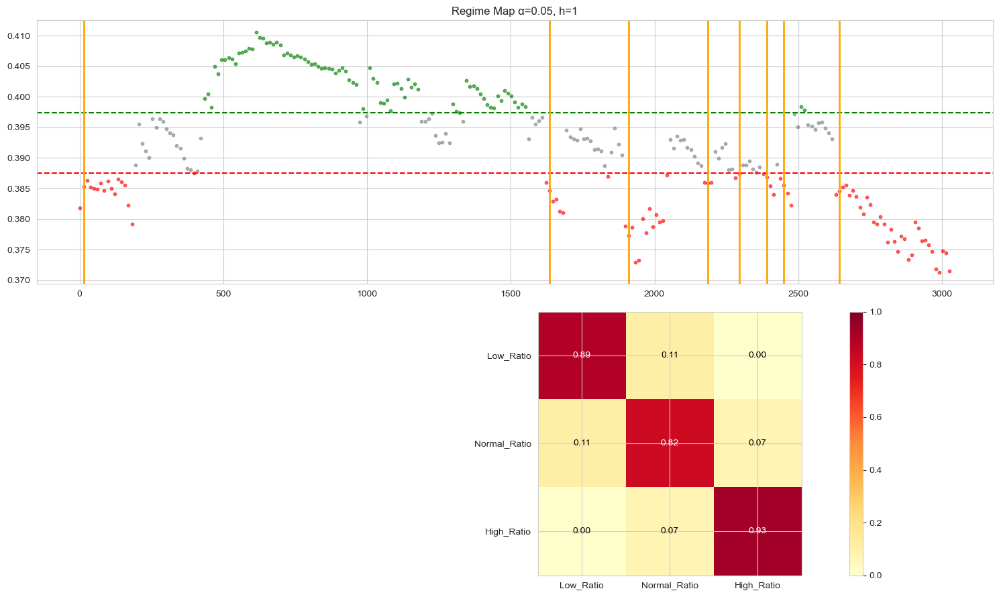

α=5.0%, h=5: p=0.0000, warnings=9


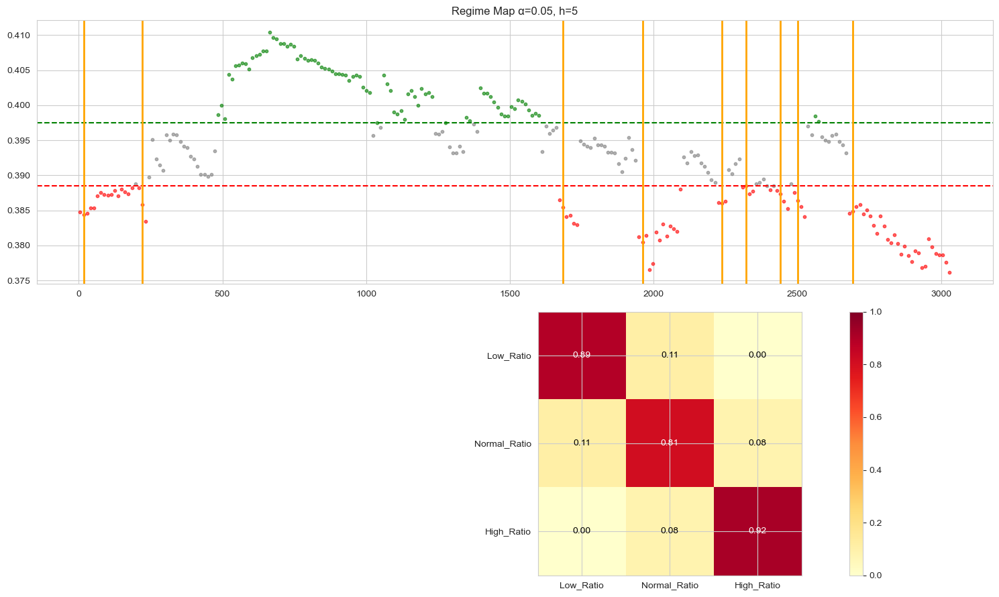

α=5.0%, h=10: p=0.0000, warnings=8


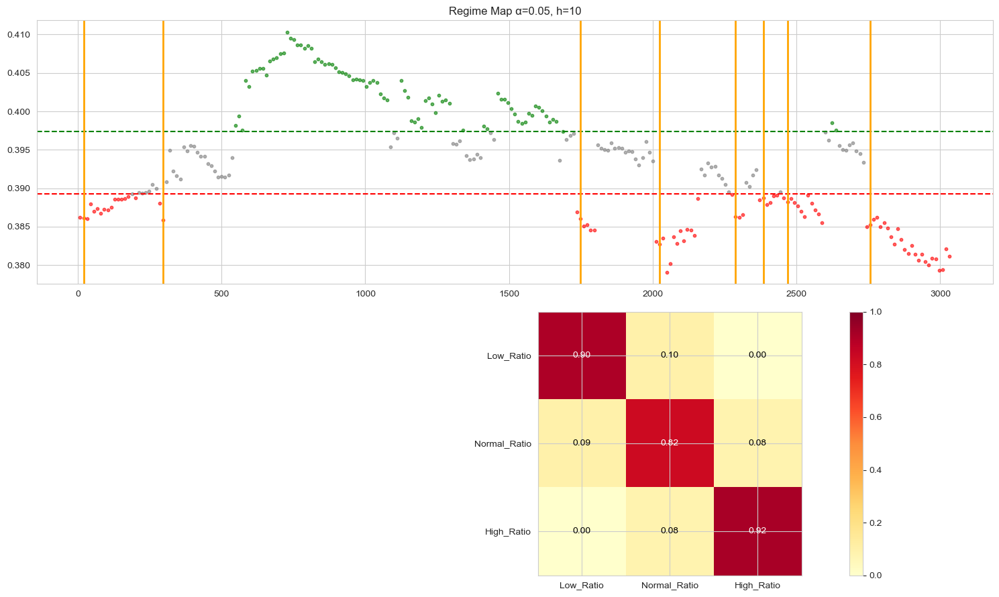

α=5.0%, h=21: p=0.0000, warnings=8


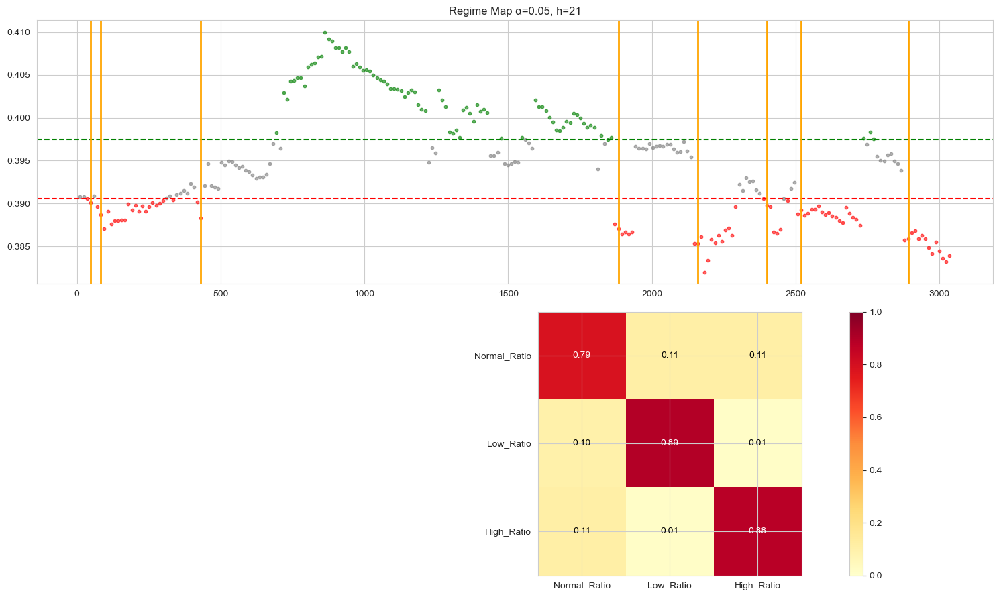

α=3.0%, h=1: p=0.0000, warnings=7


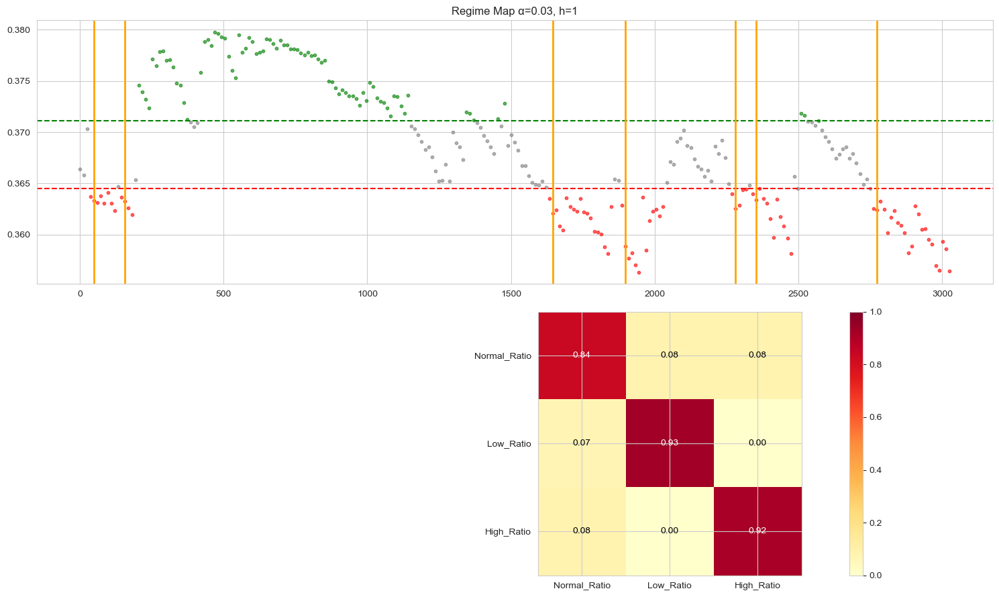

α=3.0%, h=5: p=0.0000, warnings=7


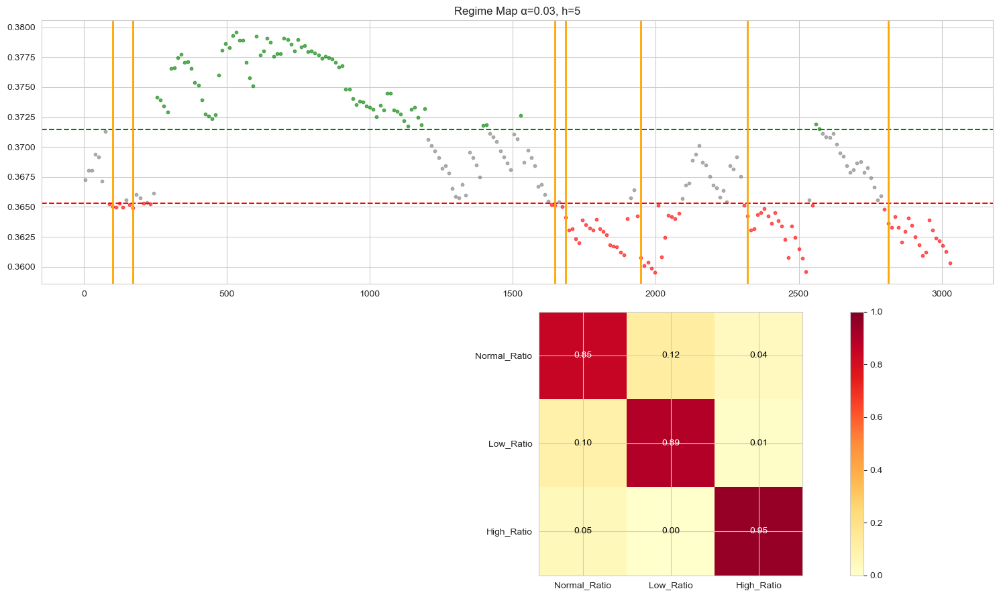

α=3.0%, h=10: p=0.0000, warnings=7


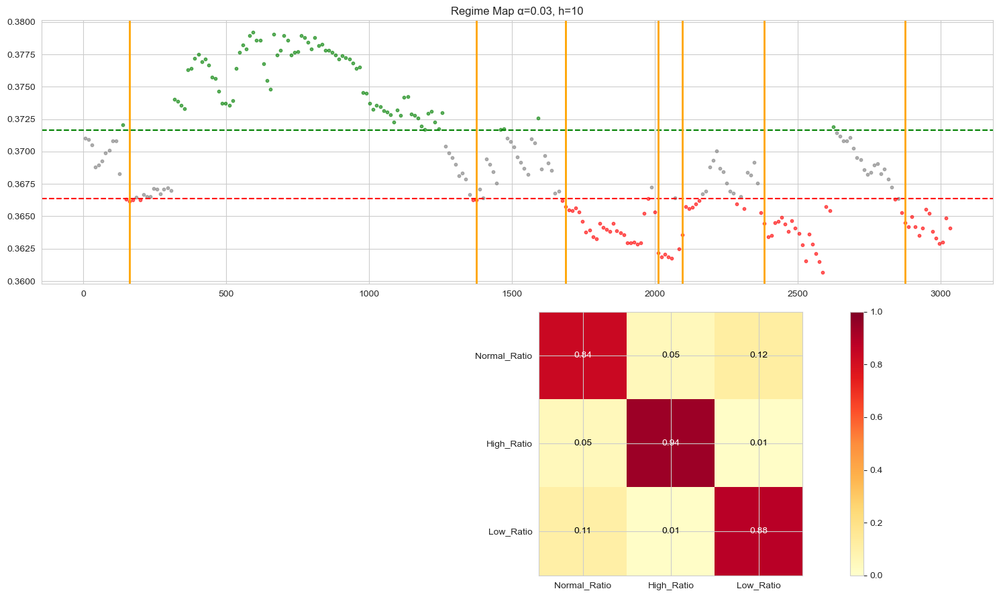

α=3.0%, h=21: p=0.0000, warnings=9


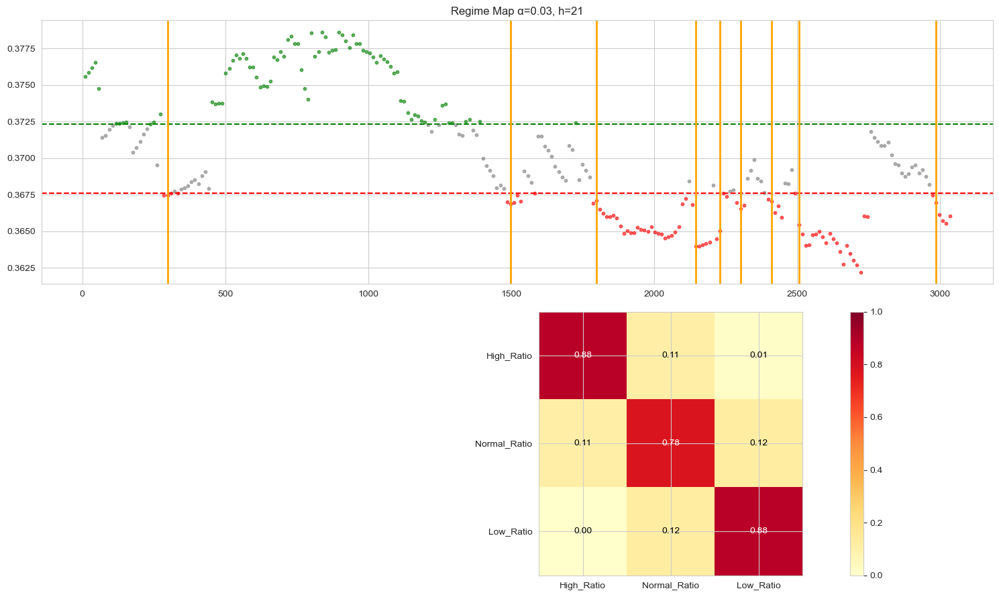

α=1.0%, h=1: p=0.0000, warnings=5


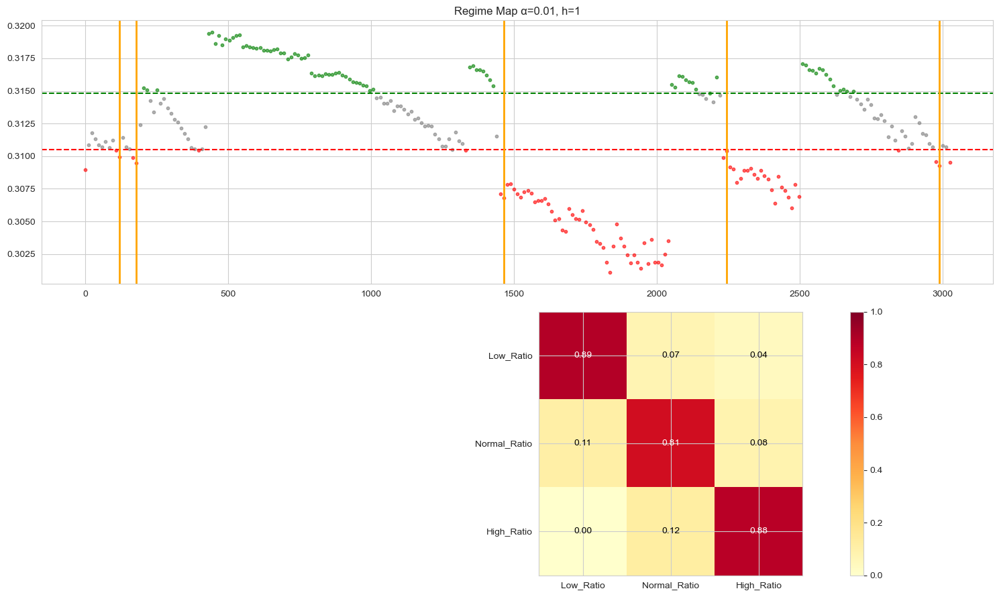

α=1.0%, h=5: p=0.0000, warnings=5


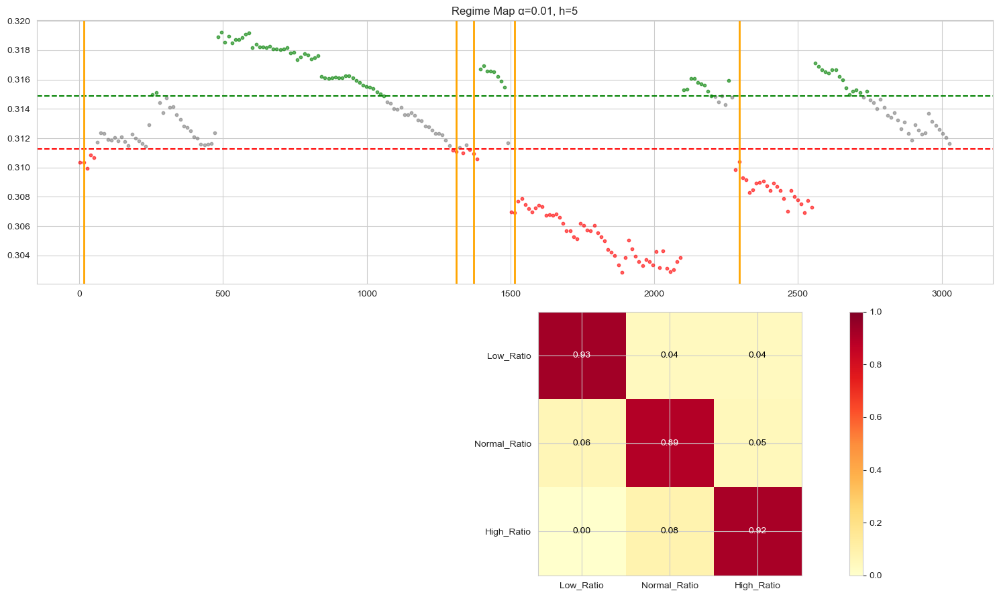

α=1.0%, h=10: p=0.0000, warnings=4


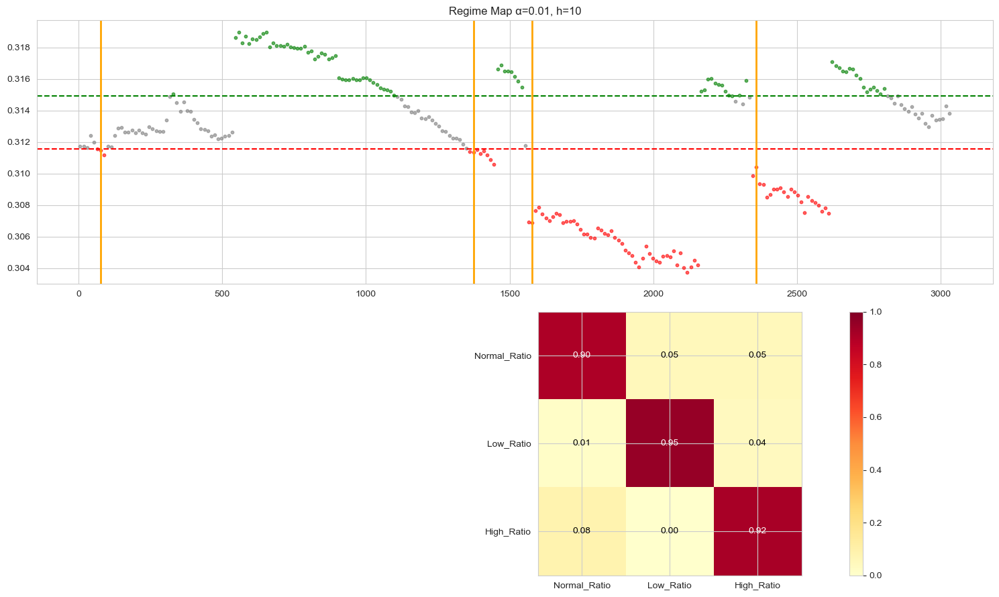

α=1.0%, h=21: p=0.0000, warnings=3


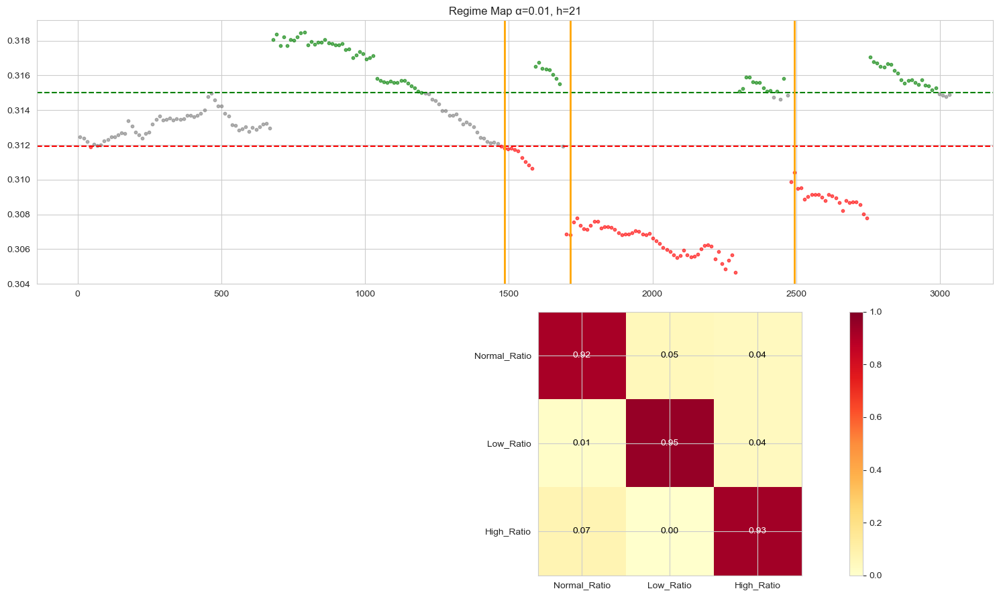

In [34]:
regime_results_covid = comprehensive_regime_analysis(df_covid)

α=5.0%, h=1: p=0.0000, warnings=3


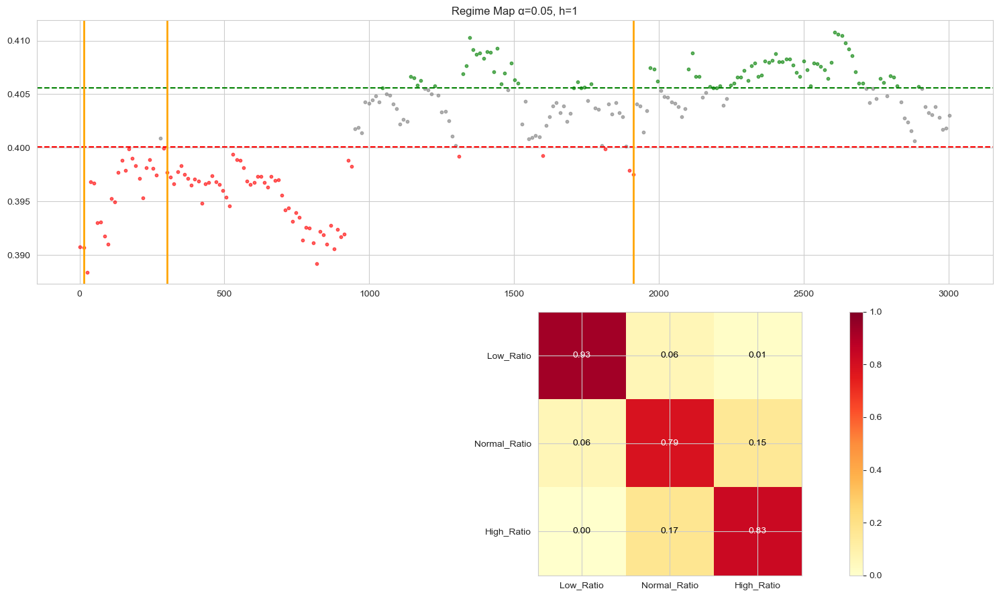

α=5.0%, h=5: p=0.0000, warnings=4


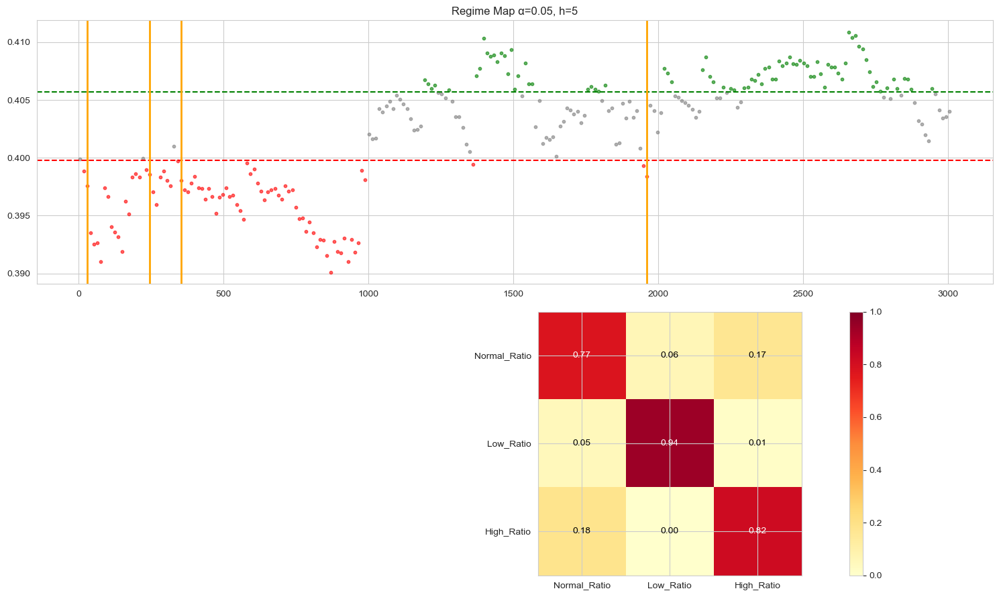

α=5.0%, h=10: p=0.0000, warnings=3


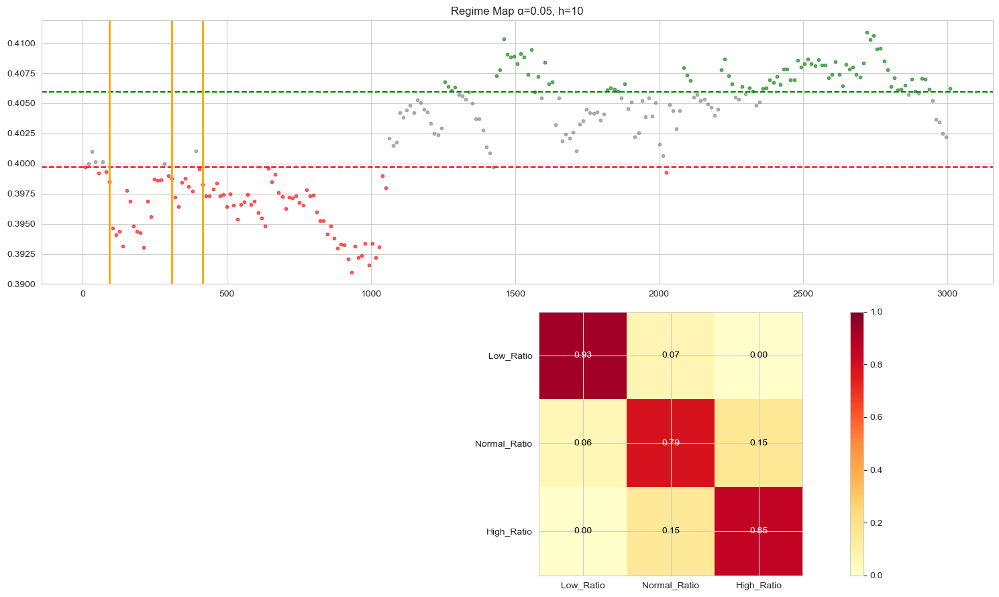

α=5.0%, h=21: p=0.0000, warnings=3


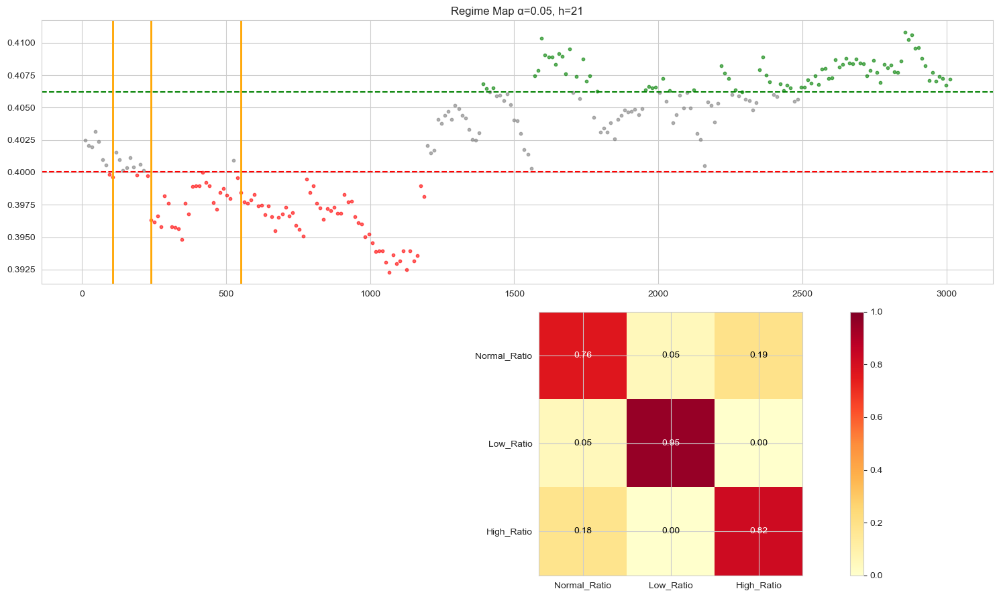

α=3.0%, h=1: p=0.0000, warnings=6


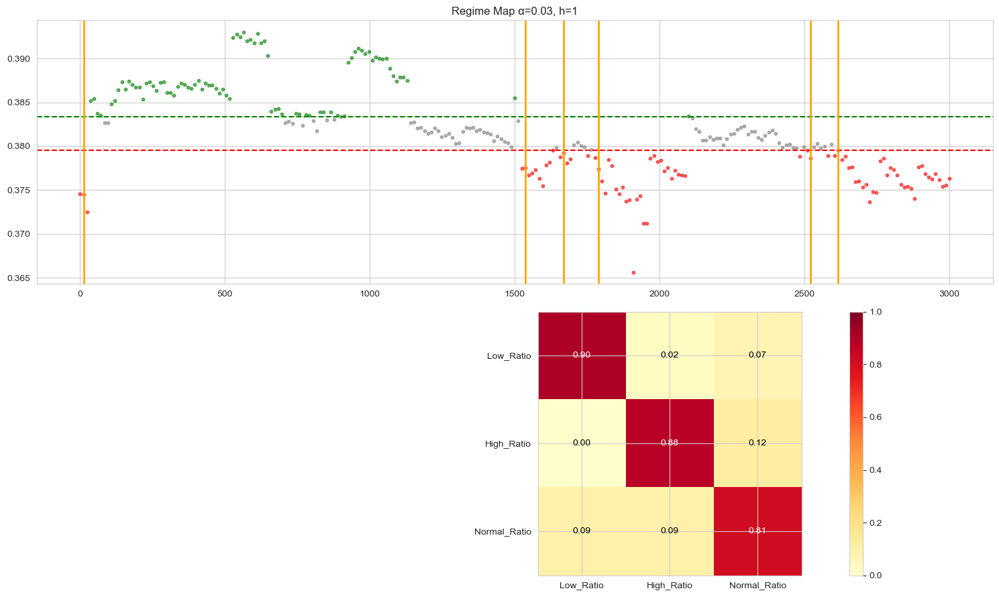

α=3.0%, h=5: p=0.0000, warnings=7


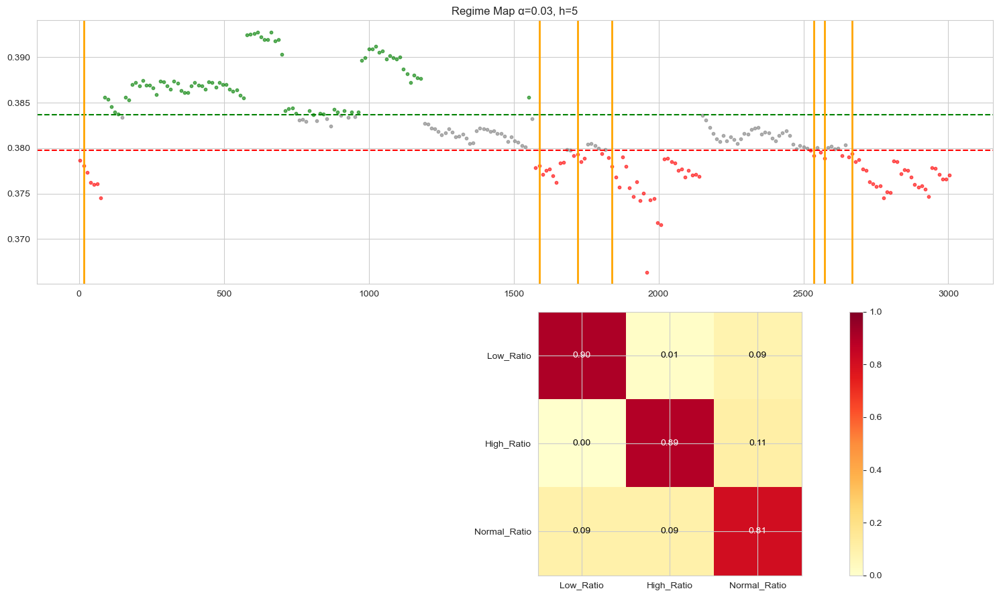

α=3.0%, h=10: p=0.0000, warnings=7


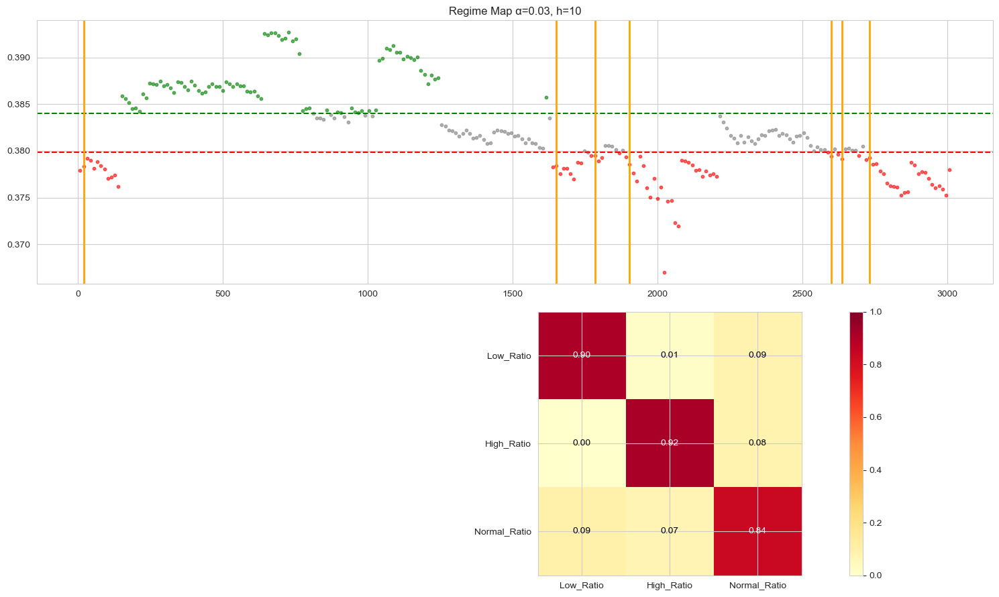

α=3.0%, h=21: p=0.0000, warnings=6


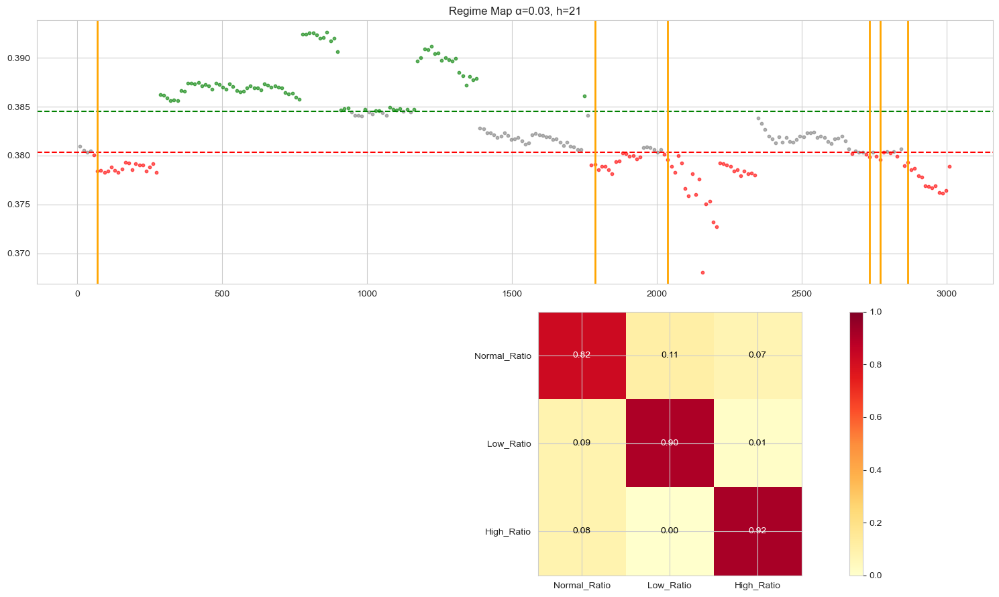

α=1.0%, h=1: p=0.0000, warnings=4


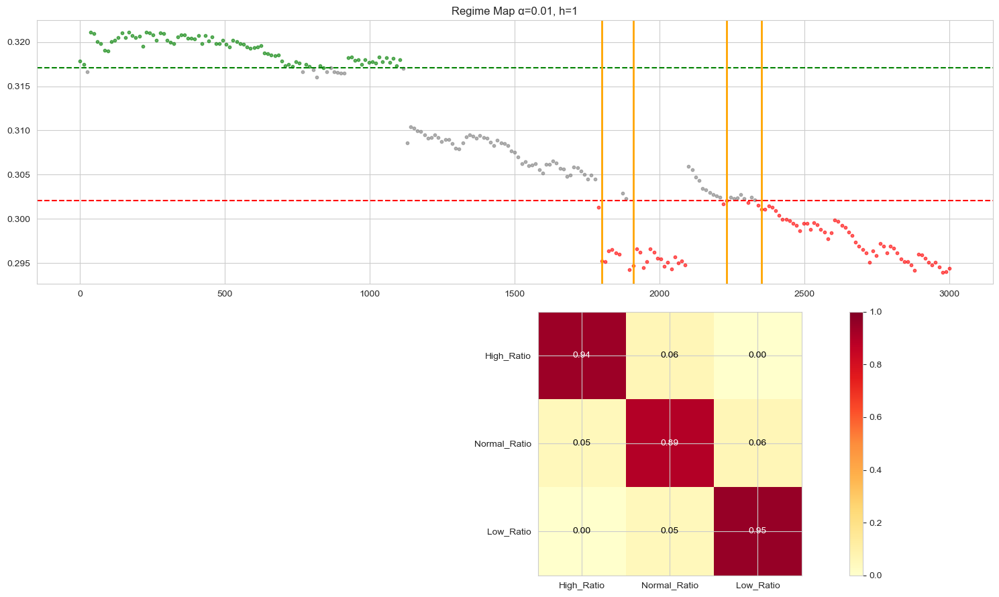

α=1.0%, h=5: p=0.0000, warnings=5


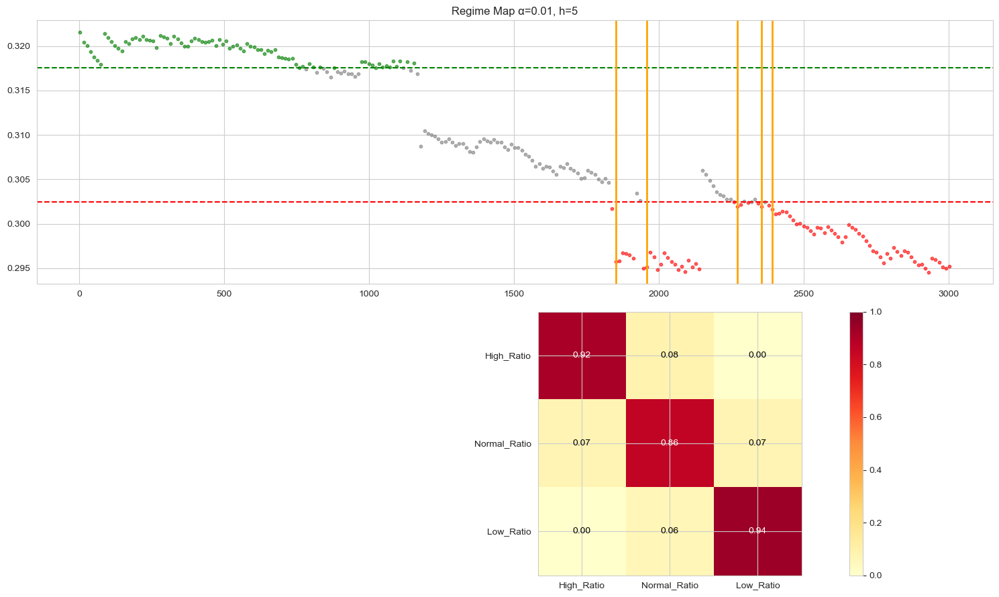

α=1.0%, h=10: p=0.0000, warnings=3


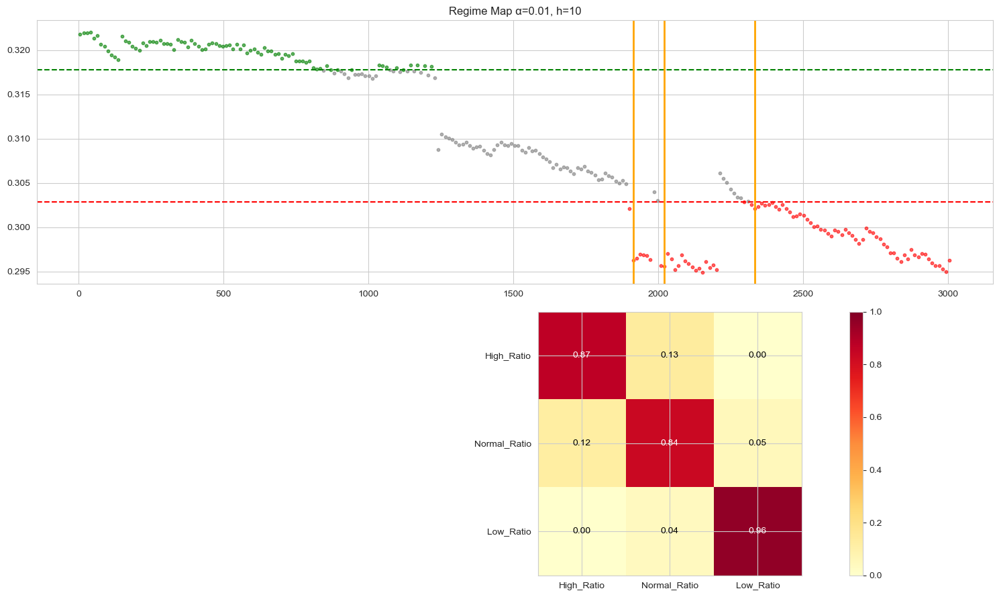

α=1.0%, h=21: p=0.0000, warnings=3


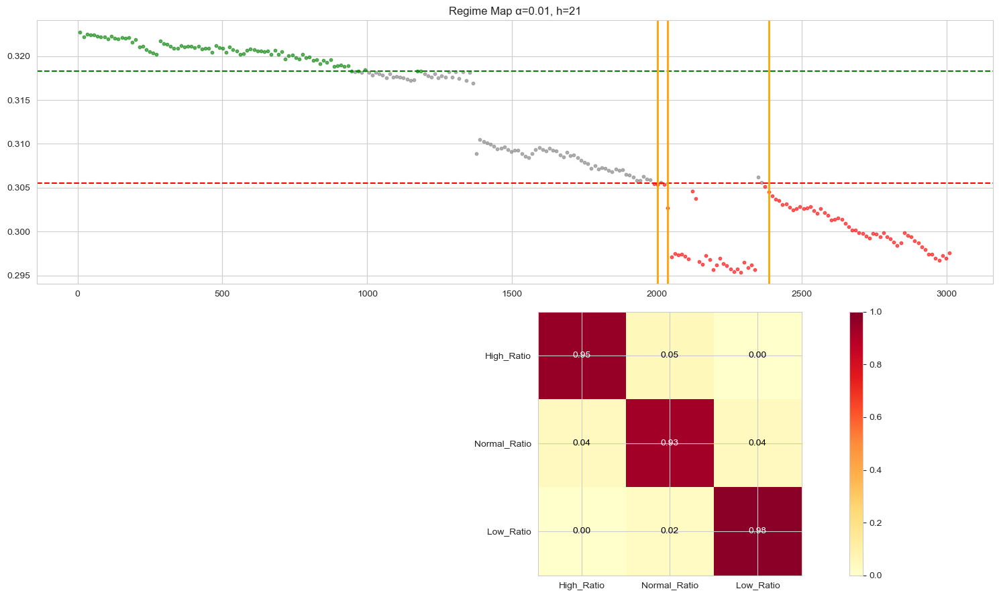

In [35]:
regime_results_infl = comprehensive_regime_analysis(df_infl)

## 4.1.1. REARRANGING THE ABOVE PLOT

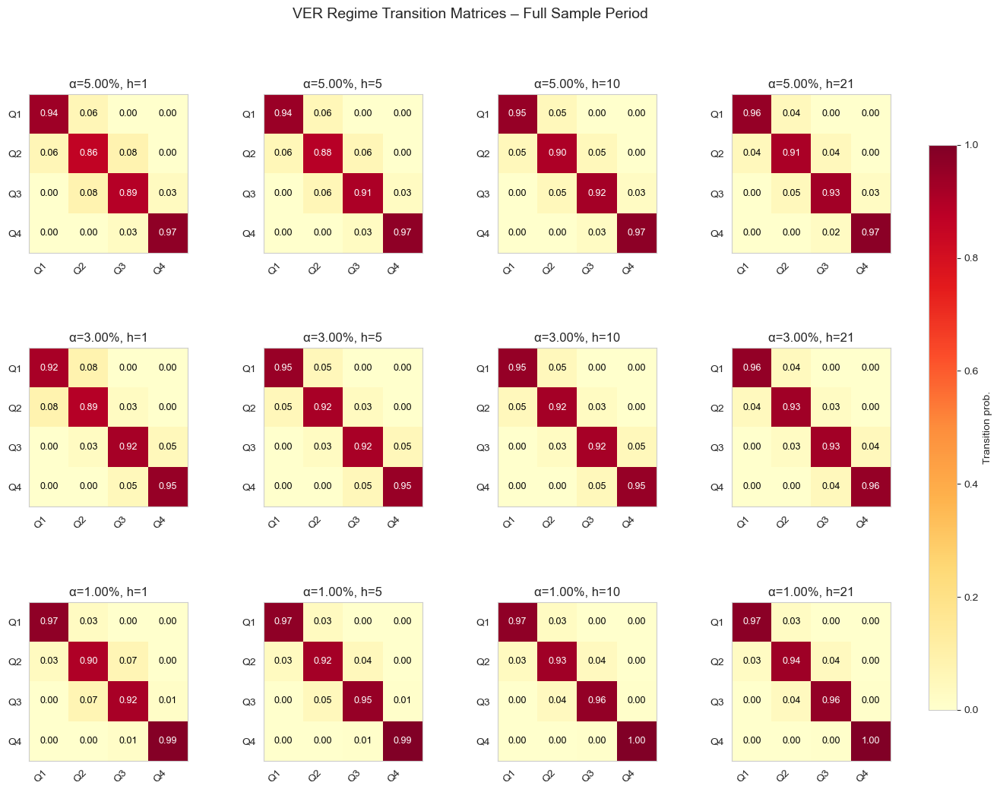

{(0.05,
  1): array([[9.37334510e-01, 6.09002648e-02, 1.76522507e-03, 0.00000000e+00],
        [6.18921309e-02, 8.58532272e-01, 7.95755968e-02, 0.00000000e+00],
        [0.00000000e+00, 8.03886926e-02, 8.87809187e-01, 3.18021201e-02],
        [0.00000000e+00, 8.82612533e-04, 3.08914387e-02, 9.68225949e-01]]),
 (0.05,
  5): array([[9.43562610e-01, 5.55555556e-02, 8.81834215e-04, 0.00000000e+00],
        [5.56537102e-02, 8.83392226e-01, 6.00706714e-02, 8.83392226e-04],
        [0.00000000e+00, 6.00176523e-02, 9.09090909e-01, 3.08914387e-02],
        [0.00000000e+00, 1.76366843e-03, 2.99823633e-02, 9.68253968e-01]]),
 (0.05,
  10): array([[9.51541850e-01, 4.75770925e-02, 8.81057269e-04, 0.00000000e+00],
        [4.76190476e-02, 9.02998236e-01, 4.85008818e-02, 8.81834215e-04],
        [0.00000000e+00, 4.85008818e-02, 9.24162257e-01, 2.73368607e-02],
        [0.00000000e+00, 1.76211454e-03, 2.64317181e-02, 9.71806167e-01]]),
 (0.05,
  21): array([[9.55184534e-01, 4.30579965e-02, 1.75746924e

In [37]:
def compute_regime_series(df, alpha, horizon):
    d = df[(df["Alpha"] == alpha) & (df["ForecastHorizon"] == horizon)].copy()
    if d.empty:
        return None, None

    q1, q2, q3 = d["VaR_Ratio"].quantile([0.25, 0.50, 0.75])

    d["Regime"] = np.select(
        [
            d["VaR_Ratio"] <= q1,
            (d["VaR_Ratio"] > q1) & (d["VaR_Ratio"] <= q2),
            (d["VaR_Ratio"] > q2) & (d["VaR_Ratio"] <= q3),
            d["VaR_Ratio"] > q3,
        ],
        ["Q1", "Q2", "Q3", "Q4"],
        default="Q1"
    )
    
    return d["Regime"], (q1, q2, q3)

def markov_matrix_from_regimes(regimes, states=("Q1", "Q2", "Q3", "Q4")):
    idx = {s: i for i, s in enumerate(states)}
    k = len(states)
    counts = np.zeros((k, k))
    r = regimes.to_numpy()
    for t in range(len(r) - 1):
        s0, s1 = r[t], r[t + 1]
        if s0 in idx and s1 in idx:
            counts[idx[s0], idx[s1]] += 1
    with np.errstate(divide="ignore", invalid="ignore"):
        P = counts / counts.sum(axis=1, keepdims=True)
    return np.nan_to_num(P), states

def plot_all_transition_matrices(
    df,
    title="VER Regime Transition Matrices (Quartiles)",
    alphas=(0.05, 0.03, 0.01),
    horizons=(1, 5, 10, 21),
):
    n_rows, n_cols = len(alphas), len(horizons)
    fig, axes = plt.subplots(
        n_rows, n_cols, figsize=(4 * n_cols, 3.8 * n_rows), squeeze=False
    )

    mats = {}
    im = None

    for i, alpha in enumerate(alphas):
        for j, h in enumerate(horizons):
            ax = axes[i, j]
            regimes, _ = compute_regime_series(df, alpha, h)
            if regimes is None or len(regimes) < 2:
                ax.set_axis_off()
                continue

            P, states = markov_matrix_from_regimes(regimes)
            mats[(alpha, h)] = P

            im = ax.imshow(P, vmin=0, vmax=1, cmap="YlOrRd")
            ax.set_title(f"α={alpha:.2%}, h={h}")
            ax.set_xticks(range(len(states)))
            ax.set_yticks(range(len(states)))
            ax.set_xticklabels(states, rotation=45, ha="right")
            ax.set_yticklabels(states)
            ax.grid(False)

            for r in range(len(states)):
                for c in range(len(states)):
                    ax.text(
                        c, r,
                        f"{P[r, c]:.2f}",
                        ha="center", va="center",
                        color="black" if P[r, c] < 0.6 else "white",
                        fontsize=9,
                    )

    fig.suptitle(title, fontsize=14)
    fig.subplots_adjust(top=0.88, wspace=0.35, hspace=0.6)

    if im is not None:
        cbar = fig.colorbar(im, ax=axes, location="right", fraction=0.03, pad=0.04)
        cbar.set_label("Transition prob.")

    plt.show()
    return mats


plot_all_transition_matrices(df_full, title="VER Regime Transition Matrices – Full Sample Period")


## 4.2 Comparision of VAR ratio for breach vs non breach day

*Do Breach Days have systematically lower VaR Ratios than Non-Breach days?It asks:*

*Do VaR ratios behave differently on days when breaches occur?*

*Can VaR Ratio be used as a leading indicator of upcoming VaR breaches?*

*What percentile threshold of VaR Ratio gives the best prediction of breach risk?*

*This is cross-sectional analysis, not temporal/regime analysis*

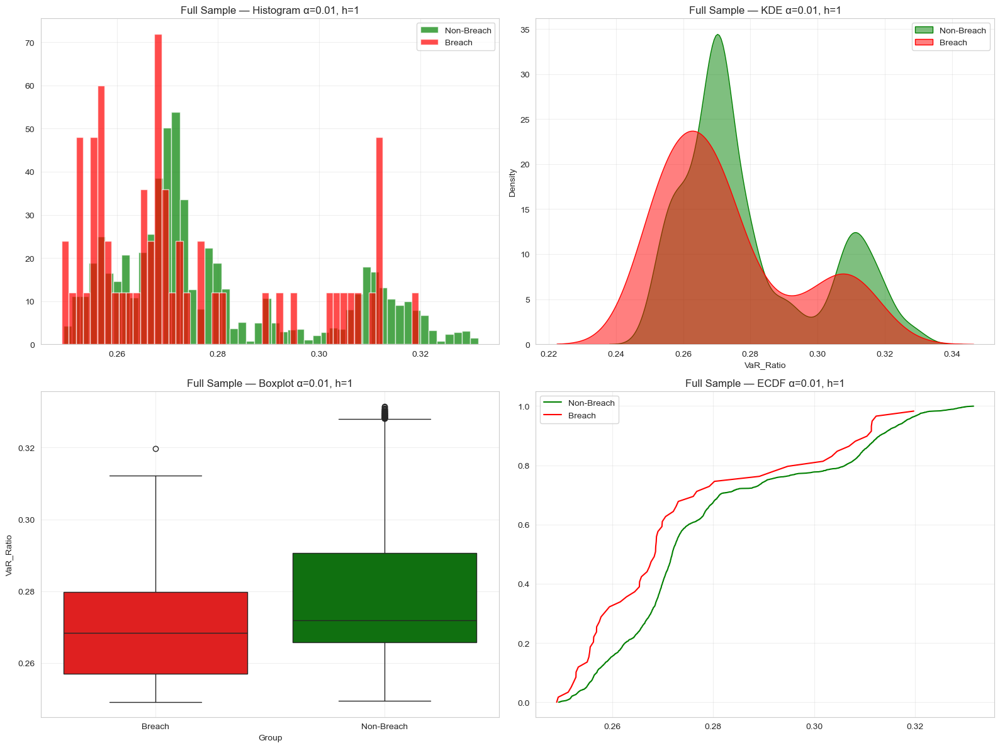

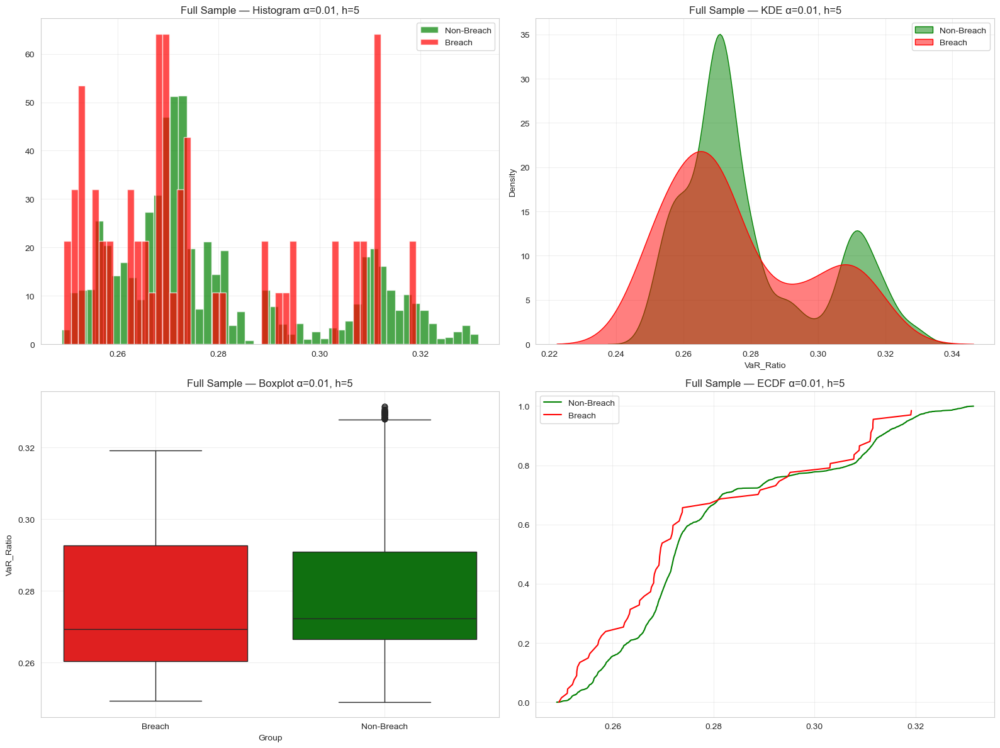

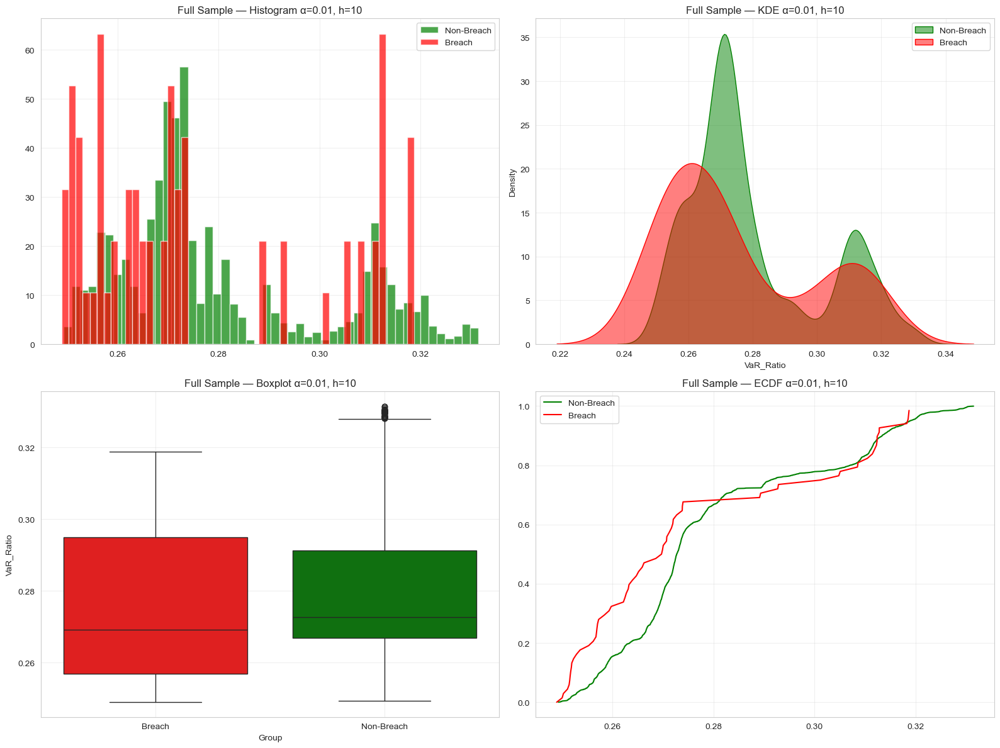

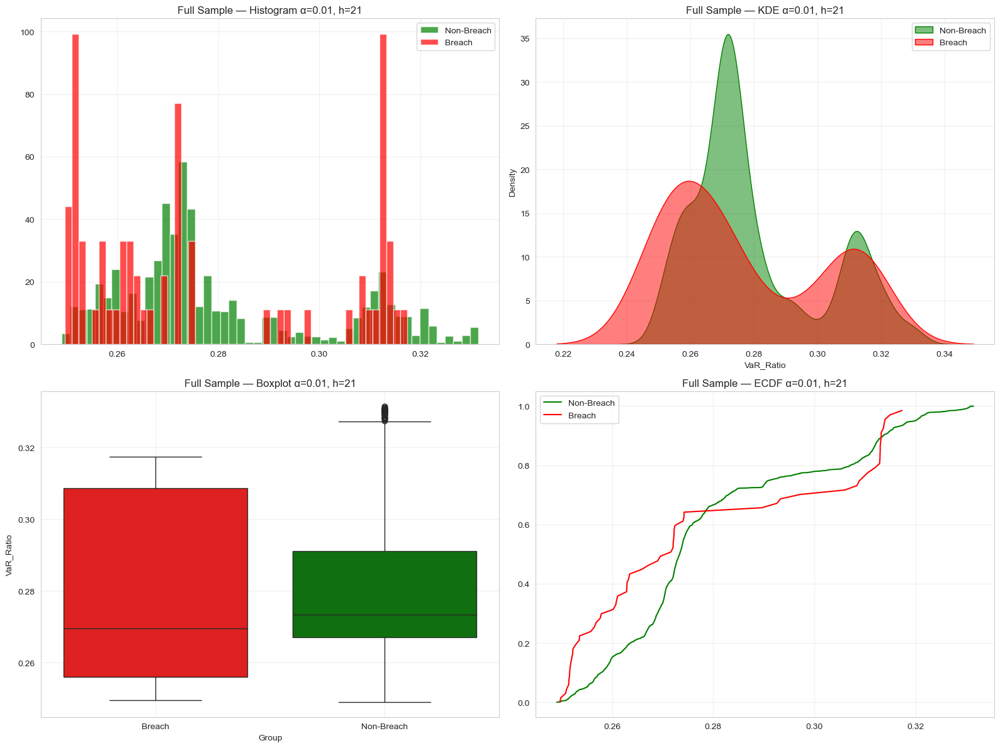

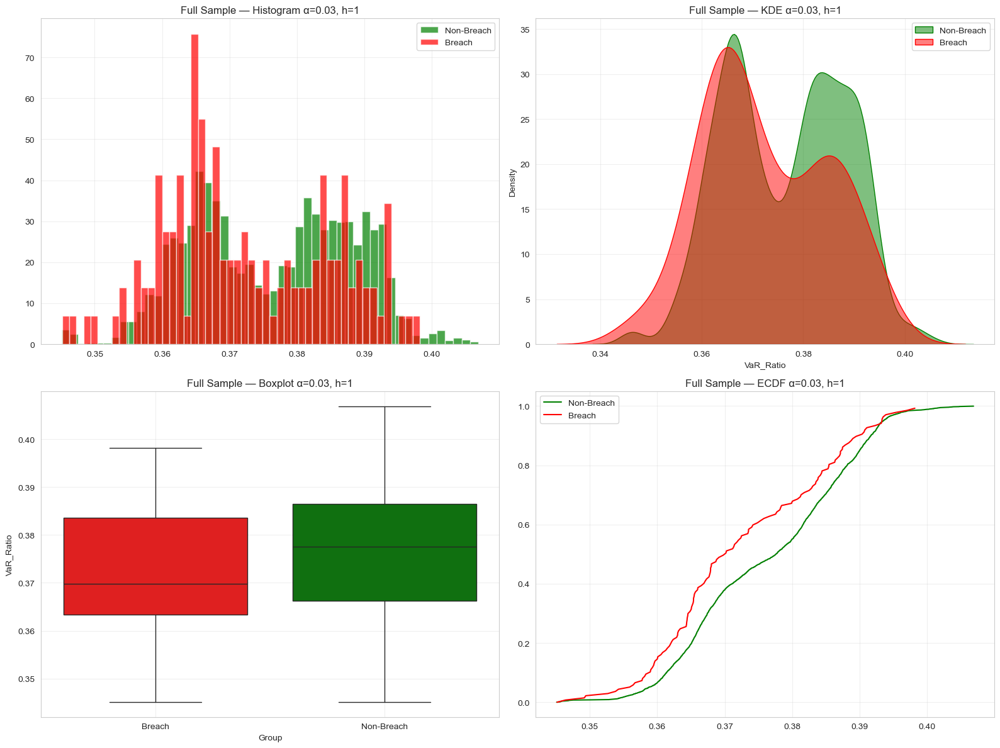

...

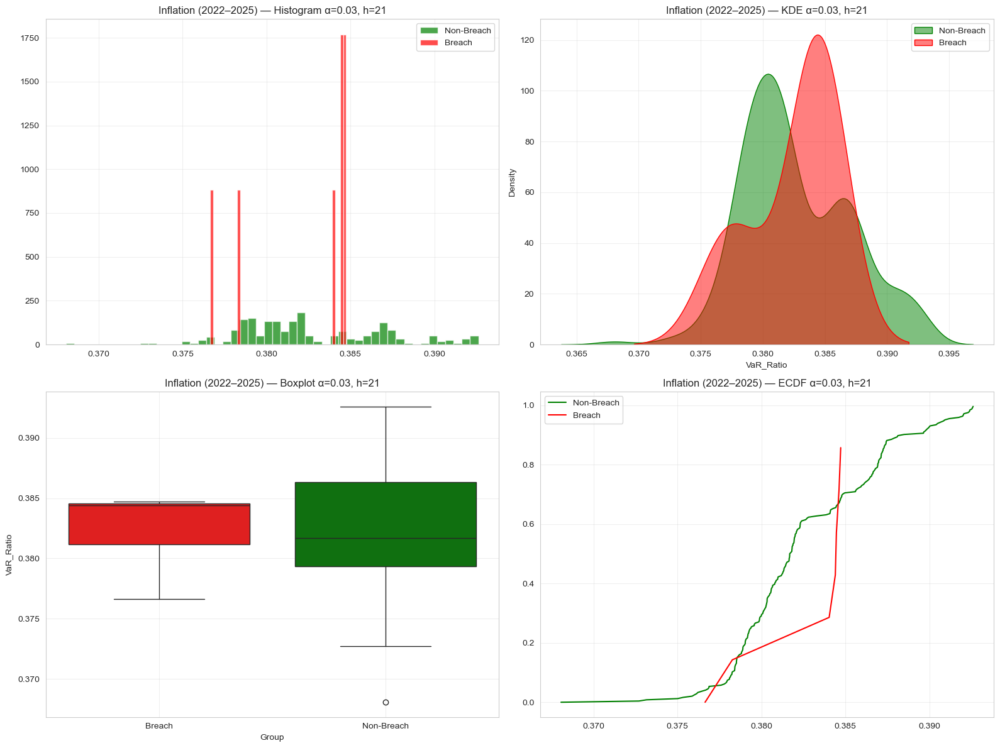

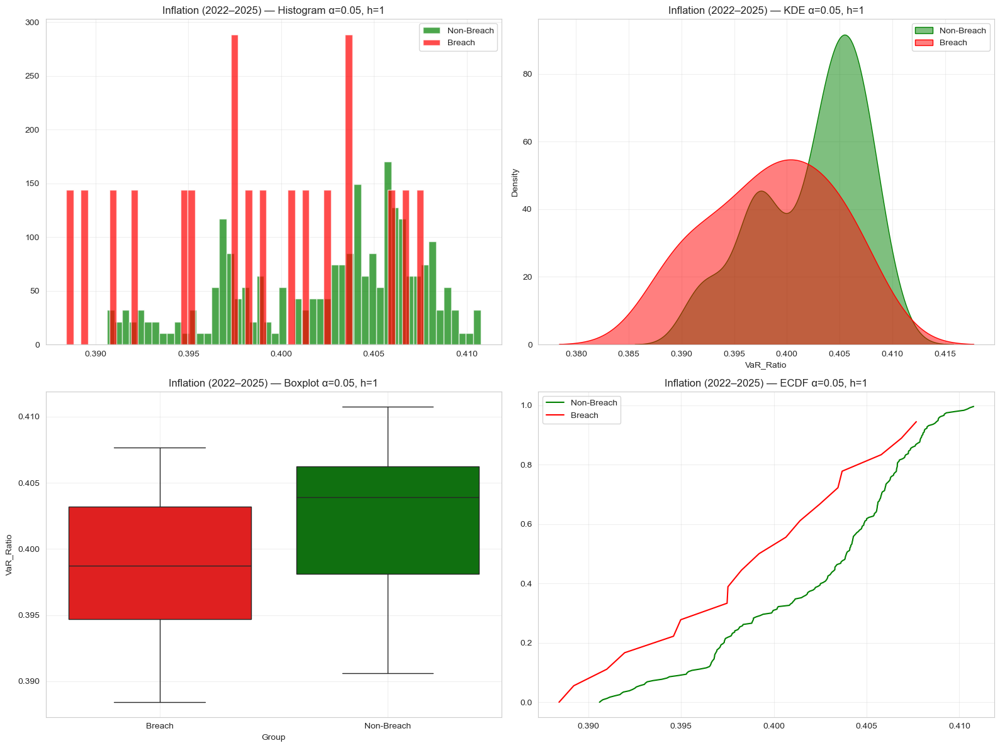

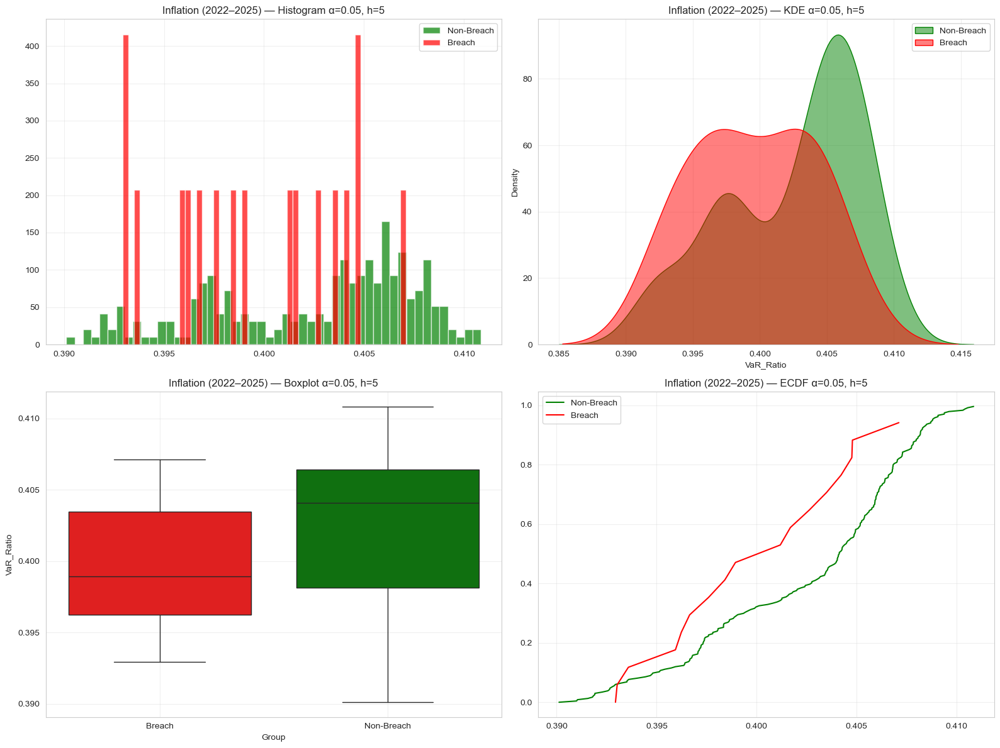

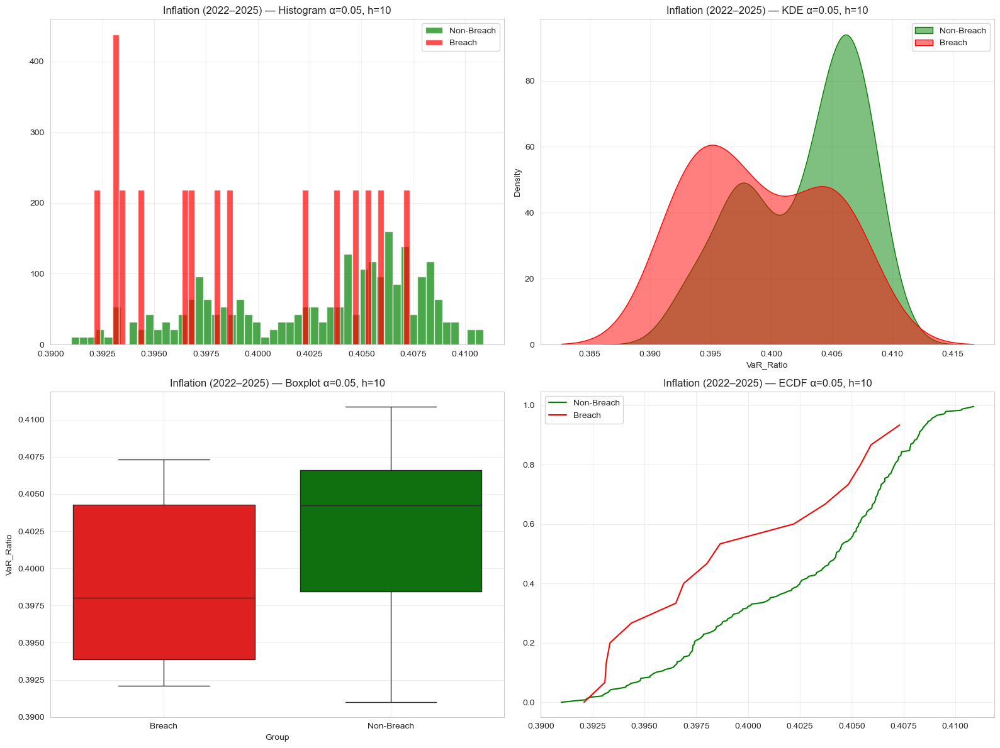

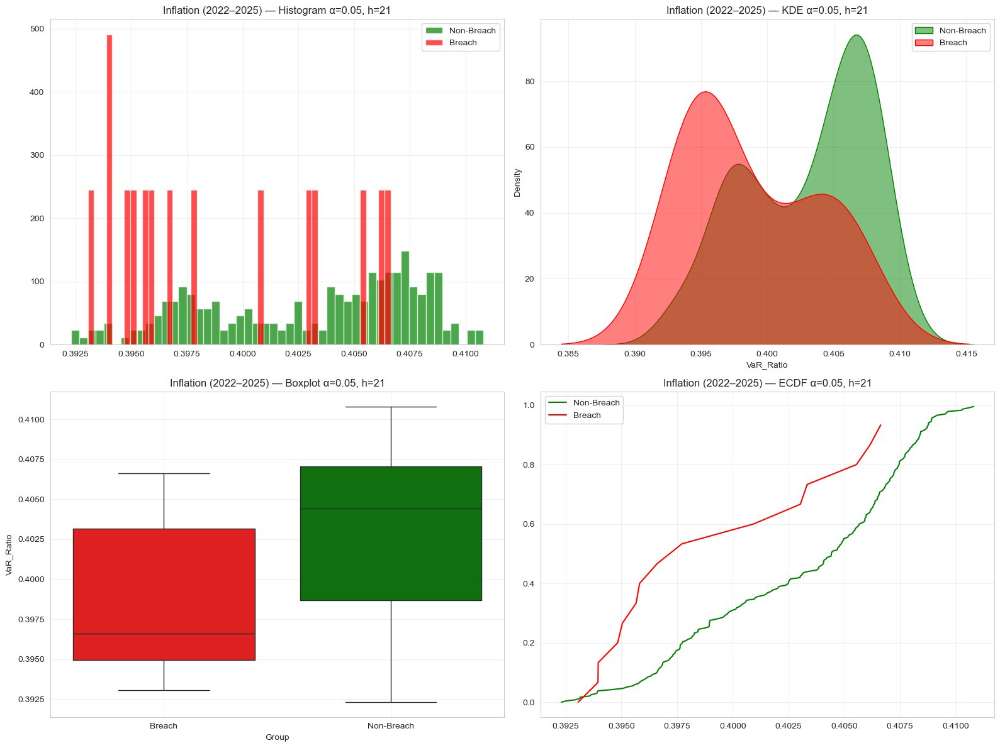

In [38]:
def analyze_ratio_distributions(df, alpha_level, forecast_horizon):
    
    df_filtered = df[
        (df["Alpha"] == alpha_level) &
        (df["ForecastHorizon"] == forecast_horizon)
    ].copy()

    if df_filtered.empty:
        return None

    
    df_filtered["Breach"] = df_filtered["ActualReturn"] <= df_filtered["FHS_VaR"]

    breach_days     = df_filtered[df_filtered["Breach"]]
    non_breach_days = df_filtered[~df_filtered["Breach"]]

    b  = breach_days["VaR_Ratio"].dropna()
    nb = non_breach_days["VaR_Ratio"].dropna()
    ks_stat, ks_p = ks_2samp(b, nb) if (len(b) > 0 and len(nb) > 0) else (np.nan, np.nan)
    t_stat, t_p = ttest_ind(b, nb, equal_var=False) if (len(b) > 1 and len(nb) > 1) else (np.nan, np.nan)

    if len(b) > 1 and len(nb) > 1:
        pooled_std = np.sqrt((b.std()**2 + nb.std()**2) / 2)
        effect_size = (b.mean() - nb.mean()) / pooled_std if pooled_std > 0 else np.nan
    else:
        effect_size = np.nan

    
    summary = {
        "alpha": alpha_level,
        "forecast_horizon": forecast_horizon,
        "n_breaches": len(breach_days),
        "n_non_breaches": len(non_breach_days),

        "ratio_mean_breach": b.mean(),
        "ratio_min_breach": b.min(),
        "ratio_max_breach": b.max(),
        "ratio_std_breach": b.std(),

        "ratio_mean_nonbreach": nb.mean(),
        "ratio_min_nonbreach": nb.min(),
        "ratio_max_nonbreach": nb.max(),
        "ratio_std_nonbreach": nb.std()
    }

    return {
        "breach_days": breach_days,
        "non_breach_days": non_breach_days,
        "summary": summary,
        "ks_test": (ks_stat, ks_p),
        "t_test": (t_stat, t_p),
        "effect_size": effect_size
    }


def plot_distribution_comparison(analysis_results, alpha_level, forecast_horizon, dataset_name):
    breach_days = analysis_results["breach_days"]
    non_breach_days = analysis_results["non_breach_days"]

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    ax1, ax2, ax3, ax4 = axes.flat

    # Histogram
    ax1.hist(non_breach_days["VaR_Ratio"], bins=50, alpha=0.7, color="green", density=True, label="Non-Breach")
    ax1.hist(breach_days["VaR_Ratio"], bins=50, alpha=0.7, color="red", density=True, label="Breach")
    ax1.set_title(f"{dataset_name} — Histogram α={alpha_level}, h={forecast_horizon}")
    ax1.grid(alpha=0.3); ax1.legend()

    # KDE
    sns.kdeplot(non_breach_days["VaR_Ratio"], ax=ax2, color="green", label="Non-Breach", fill=True, alpha=0.5)
    sns.kdeplot(breach_days["VaR_Ratio"], ax=ax2, color="red", label="Breach", fill=True, alpha=0.5)
    ax2.set_title(f"{dataset_name} — KDE α={alpha_level}, h={forecast_horizon}")
    ax2.grid(alpha=0.3); ax2.legend()

    # Boxplot
    df_box = pd.DataFrame({
        "VaR_Ratio": pd.concat([breach_days["VaR_Ratio"], non_breach_days["VaR_Ratio"]]),
        "Group": ["Breach"] * len(breach_days) + ["Non-Breach"] * len(non_breach_days)
    })
    sns.boxplot(data=df_box, x="Group", y="VaR_Ratio", ax=ax3, palette=["red", "green"])
    ax3.set_title(f"{dataset_name} — Boxplot α={alpha_level}, h={forecast_horizon}")
    ax3.grid(alpha=0.3)

    # ECDF
    b_sorted = np.sort(breach_days["VaR_Ratio"])
    nb_sorted = np.sort(non_breach_days["VaR_Ratio"])
    ax4.plot(nb_sorted, np.arange(len(nb_sorted))/len(nb_sorted), color="green", label="Non-Breach")
    ax4.plot(b_sorted, np.arange(len(b_sorted))/len(b_sorted), color="red", label="Breach")
    ax4.set_title(f"{dataset_name} — ECDF α={alpha_level}, h={forecast_horizon}")
    ax4.grid(alpha=0.3); ax4.legend()

    plt.tight_layout()
    plt.show()
    return fig

def predictive_power_analysis(analysis_results):
    """
    Produces predictive metrics table including:
    - breach count
    - breach %
    - ratio mean/min/max/std
    - KS test
    - t-test
    - effect size
    """

    breach_days = analysis_results["breach_days"]
    non_breach_days = analysis_results["non_breach_days"]

    total_obs = len(breach_days) + len(non_breach_days)
    breach_count = len(breach_days)
    breach_pct = breach_count / total_obs if total_obs > 0 else np.nan

    b  = breach_days["VaR_Ratio"].dropna()
    nb = non_breach_days["VaR_Ratio"].dropna()

    ks_stat, ks_p = analysis_results["ks_test"]
    t_stat, t_p = analysis_results["t_test"]
    eff = analysis_results["effect_size"]

    return pd.DataFrame({
        "Total_Obs": [total_obs],
        "Breach_Count": [breach_count],
        "Breach_Percent": [breach_pct],

        "Ratio_Mean_Breach": [b.mean()],
        "Ratio_Min_Breach": [b.min()],
        "Ratio_Max_Breach": [b.max()],
        "Ratio_Std_Breach": [b.std()],

        "Ratio_Mean_NonBreach": [nb.mean()],
        "Ratio_Min_NonBreach": [nb.min()],
        "Ratio_Max_NonBreach": [nb.max()],
        "Ratio_Std_NonBreach": [nb.std()],

        "KS_pvalue": [ks_p],
        "T_pvalue": [t_p],
        "Effect_Size_d": [eff]
    })


def comprehensive_distribution_analysis(df, dataset_name, alpha_levels=[0.01, 0.03, 0.05], forecast_horizons=None):
    if forecast_horizons is None:
        forecast_horizons = sorted(df["ForecastHorizon"].unique())

    all_results = {}

    for alpha in alpha_levels:
        for h in forecast_horizons:

            res = analyze_ratio_distributions(df, alpha, h)
            if res is None:
                continue

            plot_distribution_comparison(res, alpha, h, dataset_name)

            pred = predictive_power_analysis(res)

            all_results[(alpha, h)] = {
                "distribution_analysis": res,
                "predictive_power": pred
            }

    return all_results


def collect_predictive_power(all_analysis_dict, dataset_name):
    rows = []
    for (alpha, h), result in all_analysis_dict.items():
        df_pred = result["predictive_power"].copy()
        df_pred["Alpha"] = alpha
        df_pred["ForecastHorizon"] = h
        df_pred["Dataset"] = dataset_name
        rows.append(df_pred)
    return pd.concat(rows, ignore_index=True)


def stats_table(all_analysis_dict, dataset_name):
    rows = []

    for (alpha, h), result in all_analysis_dict.items():

        stats_res = result["distribution_analysis"]
        ks_stat, ks_p = stats_res["ks_test"]
        t_stat, t_p = stats_res["t_test"]
        eff = stats_res["effect_size"]

        breach_days = stats_res["breach_days"]
        non_breach_days = stats_res["non_breach_days"]

        total_obs = len(breach_days) + len(non_breach_days)
        breach_pct = len(breach_days) / total_obs if total_obs > 0 else 0

        rows.append({
            "Dataset": dataset_name,
            "Alpha": alpha,
            "ForecastHorizon": h,
            "Total_Obs": total_obs,
            "Breach_Count": len(breach_days),
            "Breach_Percent": breach_pct,
            "KS_pvalue": ks_p,
            "T_pvalue": t_p,
            "Effect_Size_d": eff
        })

    return pd.DataFrame(rows)


distribution_analysis_full   = comprehensive_distribution_analysis(df_full,   "Full Sample")
distribution_analysis_crisis = comprehensive_distribution_analysis(df_crisis, "FY08–09 Crisis")
distribution_analysis_covid  = comprehensive_distribution_analysis(df_covid,  "COVID (2020)")
distribution_analysis_infl   = comprehensive_distribution_analysis(df_infl,   "Inflation (2022–2025)")

predictive_master = pd.concat([
    collect_predictive_power(distribution_analysis_full,   "Full Sample"),
    collect_predictive_power(distribution_analysis_crisis, "Crisis"),
    collect_predictive_power(distribution_analysis_covid,  "COVID"),
    collect_predictive_power(distribution_analysis_infl,   "Inflation")
], ignore_index=True)

stats_master = pd.concat([
    stats_table(distribution_analysis_full,   "Full Sample"),
    stats_table(distribution_analysis_crisis, "Crisis"),
    stats_table(distribution_analysis_covid,  "COVID"),
    stats_table(distribution_analysis_infl,   "Inflation")
], ignore_index=True)


first_cols = ["Dataset", "ForecastHorizon", "Alpha"]
other_cols = [c for c in predictive_master.columns if c not in first_cols]
predictive_master = predictive_master[first_cols + other_cols]


In [39]:
ratio_all=predictive_master[predictive_master['Dataset']=='Full Sample']
ratio_all

,Dataset,ForecastHorizon,Alpha,Total_Obs,Breach_Count,Breach_Percent,Ratio_Mean_Breach,Ratio_Min_Breach,Ratio_Max_Breach,Ratio_Std_Breach,Ratio_Mean_NonBreach,Ratio_Min_NonBreach,Ratio_Max_NonBreach,Ratio_Std_NonBreach,KS_pvalue,T_pvalue,Effect_Size_d
0,Full Sample,1,0.01,4530,59,0.013024,0.273095,0.249042,0.319714,0.020101,0.279285,0.249431,0.331543,0.020505,0.002127,0.022134,-0.304882
1,Full Sample,5,0.01,4534,67,0.014777,0.276015,0.249352,0.319190,0.020926,0.279645,0.248922,0.331505,0.020556,0.025301,0.163215,-0.174992
2,Full Sample,10,0.01,4539,68,0.014981,0.275684,0.248953,0.318726,0.023213,0.279937,0.249307,0.331490,0.020562,0.000241,0.137778,-0.193921
3,Full Sample,21,0.01,4550,67,0.014725,0.277232,0.249639,0.317342,0.024545,0.280206,0.249006,0.331500,0.020614,0.000411,0.327384,-0.131213
4,Full Sample,1,0.03,4530,137,0.030243,0.372445,0.345153,0.398187,0.012248,0.376445,0.345094,0.406882,0.011855,0.002775,0.000239,-0.331931
5,Full Sample,5,0.03,4534,137,0.030216,0.372823,0.345210,0.397056,0.012322,0.377060,0.345038,0.406522,0.011711,0.000104,0.000114,-0.352449
6,Full Sample,10,0.03,4539,150,0.033047,0.373363,0.345420,0.399655,0.012369,0.377512,0.345017,0.406233,0.011690,0.000003,0.000081,-0.344712
7,Full Sample,21,0.03,4550,140,0.030769,0.372752,0.345022,0.396175,0.012712,0.378013,0.344728,0.405639,0.011732,0.000010,0.000003,-0.430073
8,Full Sample,1,0.05,4530,230,0.050773,0.399508,0.368543,0.439251,0.014606,0.402578,0.363742,0.438311,0.014513,0.001779,0.002108,-0.210849
9,Full Sample,5,0.05,4534,215,0.047419,0.399877,0.371160,0.437142,0.013545,0.403365,0.369991,0.438969,0.014123,0.002208,0.000292,-0.252042


In [40]:
datasets = ["Crisis", "COVID", "Inflation"]   
ratio_sel = (
    predictive_master
    .loc[predictive_master["Dataset"].isin(datasets),
         ["Dataset",
          "ForecastHorizon",
          "Alpha",
          "Breach_Percent",
          "Ratio_Mean_Breach",
          "Ratio_Mean_NonBreach",
          "KS_pvalue",
          "T_pvalue",
          "Effect_Size_d"]]
    .reset_index(drop=True)
)

ratio_sel

,Dataset,ForecastHorizon,Alpha,Breach_Percent,Ratio_Mean_Breach,Ratio_Mean_NonBreach,KS_pvalue,T_pvalue,Effect_Size_d
0,Crisis,1,0.01,0.019802,0.254075,0.256132,0.094908,7.444689e-02,-0.653967
1,Crisis,5,0.01,0.023762,0.254234,0.256075,0.103043,1.024146e-01,-0.551480
2,Crisis,10,0.01,0.029703,0.253750,0.256033,0.005785,2.487205e-02,-0.687870
3,Crisis,21,0.01,0.029703,0.252822,0.255905,0.000700,9.336464e-05,-1.110541
4,Crisis,1,0.03,0.043564,0.363580,0.364018,0.598041,5.907852e-01,-0.119026
5,Crisis,5,0.03,0.051485,0.363310,0.363951,0.273415,4.648940e-01,-0.159641
6,Crisis,10,0.03,0.057426,0.363340,0.363807,0.559812,5.542729e-01,-0.118295
7,Crisis,21,0.03,0.057426,0.361157,0.363566,0.005132,5.912441e-04,-0.656241
8,Crisis,1,0.05,0.073267,0.395917,0.400062,0.046844,2.572663e-02,-0.392758
9,Crisis,5,0.05,0.081188,0.395366,0.399832,0.026618,1.401467e-02,-0.415294


## 4.2.1 Cross sectional Rtaio Quartile wise

In [41]:
def quartile_ratio_analysis(df, dataset_name,
                            alpha_levels=[0.01, 0.03, 0.05],
                            forecast_horizons=None,
                            n_quantiles=4):

    if forecast_horizons is None:
        forecast_horizons = sorted(df["ForecastHorizon"].unique())

    rows = []

    for alpha in alpha_levels:
        for h in forecast_horizons:
            sub = df[
                (df["Alpha"] == alpha) &
                (df["ForecastHorizon"] == h)
            ].copy()

            if sub.empty:
                continue

            
            sub["Breach"] = sub["ActualReturn"] <= sub["FHS_VaR"]

            
            sub = sub.dropna(subset=["VaR_Ratio"])
            if sub.empty:
                continue

            
            sub["Ratio_Quantile"] = pd.qcut(
                sub["VaR_Ratio"],
                n_quantiles,
                labels=[f"Q{i+1}" for i in range(n_quantiles)]
            )

           
            grp = sub.groupby("Ratio_Quantile")

            
            obs = grp.size().rename("Obs")
            breach_count = grp["Breach"].sum().rename("Breach_Count")
            breach_pct = grp["Breach"].mean().rename("Breach_Percent")

            
            mean_ratio_breach = (
                sub[sub["Breach"]]
                .groupby("Ratio_Quantile")["VaR_Ratio"]
                .mean()
                .rename("Mean_Ratio_Breach")
            )
            mean_ratio_nonbreach = (
                sub[~sub["Breach"]]
                .groupby("Ratio_Quantile")["VaR_Ratio"]
                .mean()
                .rename("Mean_Ratio_NonBreach")
            )

            qtable = pd.concat(
                [obs, breach_count, breach_pct,
                 mean_ratio_breach, mean_ratio_nonbreach],
                axis=1
            ).reset_index()

            qtable["Dataset"] = dataset_name
            qtable["Alpha"] = alpha
            qtable["ForecastHorizon"] = h

            
            qtable = qtable[
                ["Dataset", "Alpha", "ForecastHorizon",
                 "Ratio_Quantile", "Obs", "Breach_Count",
                 "Breach_Percent", "Mean_Ratio_Breach",
                 "Mean_Ratio_NonBreach"]
            ]

            rows.append(qtable)

    return pd.concat(rows, ignore_index=True) if rows else pd.DataFrame()
alphas = [0.01, 0.03, 0.05]
horizons = [1, 5, 10, 21]

quart_full   = quartile_ratio_analysis(df_full,   "Full Sample", alphas, horizons)
quart_crisis = quartile_ratio_analysis(df_crisis, "FY08–09 Crisis", alphas, horizons)
quart_covid  = quartile_ratio_analysis(df_covid,  "COVID (2020)", alphas, horizons)
quart_infl   = quartile_ratio_analysis(df_infl,   "Inflation (2022–2025)", alphas, horizons)

quartile_master = pd.concat(
    [quart_full, quart_crisis, quart_covid, quart_infl],
    ignore_index=True
)
quart_full

,Dataset,Alpha,ForecastHorizon,Ratio_Quantile,Obs,Breach_Count,Breach_Percent,Mean_Ratio_Breach,Mean_Ratio_NonBreach
0,Full Sample,0.01,1,Q1,1133,25,0.022065,0.256583,0.258425
1,Full Sample,0.01,1,Q2,1132,13,0.011484,0.268498,0.269244
2,Full Sample,0.01,1,Q3,1132,8,0.007067,0.277425,0.277961
3,Full Sample,0.01,1,Q4,1133,13,0.011474,0.306780,0.311282
4,Full Sample,0.01,5,Q1,1134,25,0.022046,0.257078,0.258698
5,Full Sample,0.01,5,Q2,1133,16,0.014122,0.269502,0.269756
6,Full Sample,0.01,5,Q3,1133,8,0.007061,0.279126,0.278257
7,Full Sample,0.01,5,Q4,1134,18,0.015873,0.306724,0.311759
8,Full Sample,0.01,10,Q1,1135,33,0.029075,0.257049,0.258869
9,Full Sample,0.01,10,Q2,1135,10,0.008811,0.270660,0.270140


## 4.2.2. Plot how ratio behaves in different Quartiles

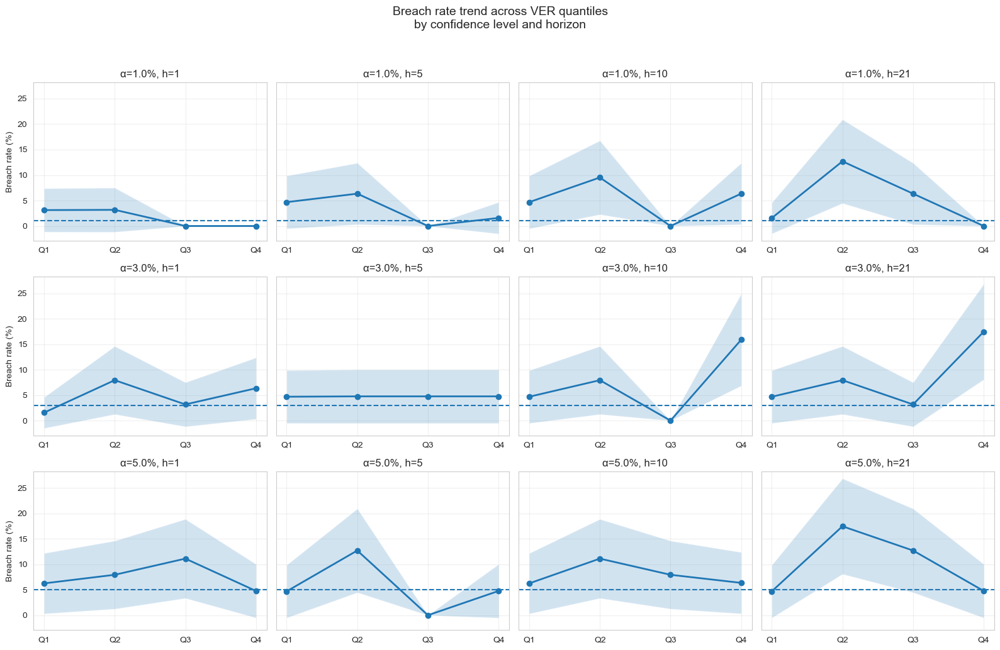

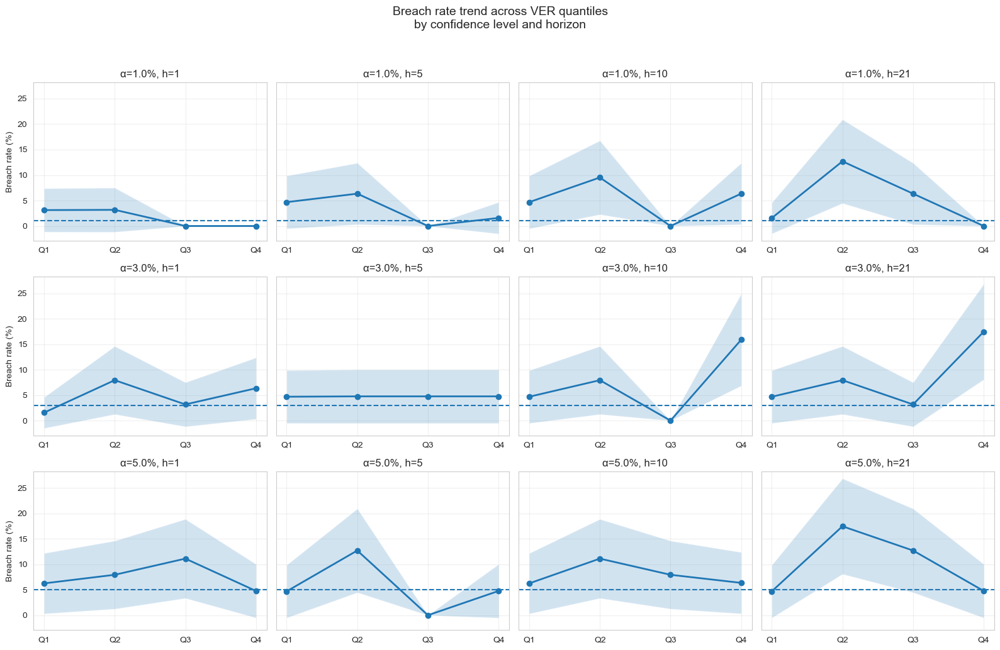

In [42]:
def breach_trend_stats(df, alpha, horizon, n_quantiles=4):
    d = df[(df["Alpha"] == alpha) & (df["ForecastHorizon"] == horizon)].copy()
    if d.empty:
        return None
    d["Ratio_Quantile"] = pd.qcut(
        d["VaR_Ratio"],
        n_quantiles,
        labels=[f"Q{i+1}" for i in range(n_quantiles)]
    )
    g = d.groupby("Ratio_Quantile").agg(
        Ratio_Min=("VaR_Ratio", "min"),
        Ratio_Max=("VaR_Ratio", "max"),
        Ratio_Mean=("VaR_Ratio", "mean"),
        Days_Count=("Breach_FHS", "count"),
        Breach_Rate=("Breach_FHS", "mean")
    ).reset_index()
    g["Breach_Rate_Pct"] = g["Breach_Rate"] * 100
    g["CI_Lower"] = (
        g["Breach_Rate"]
        - 1.96 * np.sqrt(g["Breach_Rate"] * (1 - g["Breach_Rate"]) / g["Days_Count"])
    ) * 100
    g["CI_Upper"] = (
        g["Breach_Rate"]
        + 1.96 * np.sqrt(g["Breach_Rate"] * (1 - g["Breach_Rate"]) / g["Days_Count"])
    ) * 100
    return g

def plot_breach_trend_grid(df, alphas=alphas, horizons=forecast_horizons, n_quantiles=4):
    nrows = len(alphas)
    ncols = len(horizons)
    fig, axes = plt.subplots(nrows, ncols, figsize=(4 * ncols, 3.5 * nrows), sharey=True)
    if nrows == 1:
        axes = np.array([axes])
    if ncols == 1:
        axes = axes.reshape(nrows, 1)
    for i, a in enumerate(alphas):
        for j, h in enumerate(horizons):
            ax = axes[i, j]
            stats_ = breach_trend_stats(df, a, h, n_quantiles=n_quantiles)
            if stats_ is None:
                ax.set_visible(False)
                continue
            x = np.arange(len(stats_))
            ax.plot(
                x,
                stats_["Breach_Rate_Pct"],
                marker="o",
                linewidth=2
            )
            ax.fill_between(
                x,
                stats_["CI_Lower"],
                stats_["CI_Upper"],
                alpha=0.2
            )
            ax.axhline(a * 100, linestyle="--")
            ax.set_xticks(x)
            ax.set_xticklabels(stats_["Ratio_Quantile"])
            ax.set_title(f"α={a:.1%}, h={h}")
            if j == 0:
                ax.set_ylabel("Breach rate (%)")
            ax.grid(True, alpha=0.3)
    fig.suptitle("Breach rate trend across VER quantiles\nby confidence level and horizon", fontsize=14)
    fig.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()
    return fig

plot_breach_trend_grid(df_covid, alphas=alphas, horizons=forecast_horizons)


## 4.3.1 VaR Ratio || Based on all days; not specific to breach or Non Breach days
Does breach probability consistently increase as VaR Ratio decreases

Whether breaches are disproportionately concentrated in low-ratio bins

Risk-return linkage

Confidence intervals around breach rates



In [43]:
def breach_probability_by_ratio(df, alpha_level, horizon, n_quantiles=4):
    sub = df[(df['Alpha'] == alpha_level) & (df['ForecastHorizon'] == horizon)].copy()
    if sub.empty:
        return None, None

    sub['Ratio_Quantile'] = pd.qcut(
        sub['VaR_Ratio'], n_quantiles, labels=[f"Q{i+1}" for i in range(n_quantiles)]
    )

    qstats = sub.groupby('Ratio_Quantile').agg(
        Ratio_Min=('VaR_Ratio', 'min'),
        Ratio_Max=('VaR_Ratio', 'max'),
        Ratio_Mean=('VaR_Ratio', 'mean'),
        Days_Count=('VaR_Ratio', 'count'),
        Breach_Count=('Breach_FHS', 'sum'),
        Breach_Rate=('Breach_FHS', 'mean')
    ).reset_index()

    qstats['Breach_Rate_Pct'] = qstats['Breach_Rate'] * 100

    q1 = qstats[qstats['Ratio_Quantile'] == 'Q1']['Breach_Rate'].iloc[0]
    q4 = qstats[qstats['Ratio_Quantile'] == 'Q4']['Breach_Rate'].iloc[0]
    risk_ratio = q1 / q4 if q4 > 0 else np.inf

    return qstats, risk_ratio


def run_quartile_analysis(df, alphas, horizons, regime_name):
    rows = []
    for alpha in alphas:
        for h in horizons:
            qstats, rr = breach_probability_by_ratio(df, alpha, h)
            if qstats is None:
                continue
            qstats['Alpha'] = alpha
            qstats['ForecastHorizon'] = h
            qstats['Regime'] = regime_name
            qstats['Risk_Ratio'] = rr
            rows.append(qstats)
    return pd.concat(rows, ignore_index=True) if rows else pd.DataFrame()


alphas = [0.01, 0.03, 0.05]
horizons = [1, 5, 10, 21]

quart_full = run_quartile_analysis(df_full, alphas, horizons, "Full Sample")
quart_crisis = run_quartile_analysis(df_crisis, alphas, horizons, "Crisis")
quart_covid = run_quartile_analysis(df_covid, alphas, horizons, "COVID")
quart_infl = run_quartile_analysis(df_infl, alphas, horizons, "Inflation")

quartile_master = pd.concat(
    [quart_full, quart_crisis, quart_covid, quart_infl],
    ignore_index=True
)

first_cols = ["Regime", "Alpha","ForecastHorizon"]
other_cols = [c for c in quartile_master.columns if c not in first_cols]
quartile_master = quartile_master[first_cols + other_cols]
quartile_master

,Regime,Alpha,ForecastHorizon,Ratio_Quantile,Ratio_Min,Ratio_Max,Ratio_Mean,Days_Count,Breach_Count,Breach_Rate,Breach_Rate_Pct,Risk_Ratio
0,Full Sample,0.01,1,Q1,0.249042,0.265648,0.258385,1133,25,0.022065,2.206531,1.923077
1,Full Sample,0.01,1,Q2,0.265653,0.271857,0.269235,1132,13,0.011484,1.148410,1.923077
2,Full Sample,0.01,1,Q3,0.271860,0.290569,0.277957,1132,8,0.007067,0.706714,1.923077
3,Full Sample,0.01,1,Q4,0.290607,0.331543,0.311230,1133,13,0.011474,1.147396,1.923077
4,Full Sample,0.01,5,Q1,0.248922,0.266384,0.258662,1134,25,0.022046,2.204586,1.388889
...,...,...,...,...,...,...,...,...,...,...,...,...
187,Inflation,0.05,10,Q4,0.406501,0.410888,0.407957,63,1,0.015873,1.587302,8.000000
188,Inflation,0.05,21,Q1,0.392304,0.398226,0.396048,63,9,0.142857,14.285714,inf
189,Inflation,0.05,21,Q2,0.398266,0.404098,0.401248,63,3,0.047619,4.761905,inf
190,Inflation,0.05,21,Q3,0.404193,0.406851,0.405688,62,3,0.048387,4.838710,inf


## 4.4. Monotonic Relationships Between breach and Ratio

Full-sample monotonicity suggests a global decreasing relationship, so you CAN use ratio-based thresholds.

Crisis and Inflation regimes require regime-specific thresholds.

COVID regime is structurally incompatible → no monotonic ratio.

In [44]:
def quantile_binning(df, alpha, horizon, n=4):
    d = df[(df["Alpha"] == alpha) & (df["ForecastHorizon"] == horizon)].copy()
    if len(d) == 0:
        return None
    
    d["Q"] = pd.qcut(d["VaR_Ratio"], n, labels=[1,2,3,4])
    return d


def jonckheere_terpstra_test(groups):
    """
    groups: list of arrays (breach indicators per quantile)
    """
    # Flatten group sizes
    k = len(groups)
    ns = [len(g) for g in groups]

    
    J = 0
    for i in range(k):
        for j in range(i + 1, k):
            # Count ordered pairs x < y
            for x in groups[i]:
                for y in groups[j]:
                    if x < y:
                        J += 1

    
    N = sum(ns)
    mean_J = (N*(N-1))/4 - sum([n*(n-1)/4 for n in ns])

    
    var_J = (N*(N-1)*(2*N+5) - sum([n*(n-1)*(2*n+5) for n in ns])) / 72

    
    Z = (J - mean_J) / np.sqrt(var_J)

    
    p_value = 1 - norm.cdf(Z)

    return J, Z, p_value


def jt_test(df_q):
    groups = [df_q[df_q["Q"] == q]["Breach_FHS"].values for q in [1,2,3,4]]
    return jonckheere_terpstra_test(groups)


def spearman_test(df_q):
    rho, p = spearmanr(df_q["VaR_Ratio"], df_q["Breach_FHS"])
    return rho, p


def run_monotonicity_tests(df, regime, alphas=[0.01,0.03,0.05], horizons=[1,5,10,21]):
    results = []

    for a in alphas:
        for h in horizons:
            df_q = quantile_binning(df, a, h)
            if df_q is None:
                continue

            JT_stat, JT_Z, JT_p = jt_test(df_q)
            rho, rho_p = spearman_test(df_q)

            results.append({
                "Regime": regime,
                "Alpha": a,
                "ForecastHorizon": h,
                "JT_Stat": JT_stat,
                "JT_Zscore": JT_Z,
                "JT_pvalue": JT_p,
                "Spearman_Rho": rho,
                "Spearman_pvalue": rho_p
            })

    return pd.DataFrame(results)



mono_full   = run_monotonicity_tests(df_full, "Full Sample")
mono_crisis = run_monotonicity_tests(df_crisis, "Crisis")
mono_covid  = run_monotonicity_tests(df_covid, "COVID")
mono_infl   = run_monotonicity_tests(df_infl, "Inflation")


monotonicity_master = pd.concat(
    [mono_full, mono_crisis, mono_covid, mono_infl],
    ignore_index=True
)


monotonicity_master = monotonicity_master[
    ["Regime", "Alpha", "ForecastHorizon","Spearman_Rho", "Spearman_pvalue"]]


monotonicity_master

,Regime,Alpha,ForecastHorizon,Spearman_Rho,Spearman_pvalue
0,Full Sample,0.01,1,-0.046590,0.001709
1,Full Sample,0.01,5,-0.032478,0.028751
2,Full Sample,0.01,10,-0.042908,0.003836
3,Full Sample,0.01,21,-0.035886,0.015488
4,Full Sample,0.03,1,-0.055209,0.000201
5,Full Sample,0.03,5,-0.060443,0.000047
6,Full Sample,0.03,10,-0.062221,0.000027
7,Full Sample,0.03,21,-0.072322,0.000001
8,Full Sample,0.05,1,-0.047904,0.001259
9,Full Sample,0.05,5,-0.051690,0.000498


# Supplementary Test

### Characteristics of Each Regimes

In [46]:
start_date= "2000-01-01"
end_date= "2025-10-30"
sp = yf.download("^GSPC", start=start_date, end=end_date)['Close']
sp_ret = np.log(sp).diff().dropna()
realized_vol = sp_ret.rolling(21).std() * np.sqrt(252)
tickers = ["^VIX", "SPY", "TLT", "HYG"]
data = yf.download(tickers, start=start_date, end=end_date)["Close"].ffill()

factors = pd.DataFrame({
    "IV": data["^VIX"] / 100,
    "VoV": (data["^VIX"] / 100).rolling(21).std(),
    "Credit_Spread": (data["HYG"] / data["TLT"]) - 1,
    "Yield_Curve": data["TLT"] / data["SPY"],
    "Realized_Vol": data["SPY"].pct_change().rolling(21).std() * np.sqrt(252)
}).dropna()

alphas = [0.05, 0.03, 0.01]
window = 252*3 

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  4 of 4 completed


In [47]:
def prepare_with_factors(df, factors):
    df = df.copy()
    df["VaR_Estimation_Date"] = pd.to_datetime(df["VaR_Estimation_Date"])
    merged = df.merge(
        factors,
        left_on="VaR_Estimation_Date",
        right_index=True,
        how="inner"
    )
    return merged

def run_multifactor_logit(df, scope_name, factors, breach_col="Breach_FHS", decimals=4):
    dfm = prepare_with_factors(df, factors)
    rows = []

    for (alpha, h), sub in dfm.groupby(["Alpha", "ForecastHorizon"]):
        sub = sub.dropna(subset=[
            "VaR_Ratio", breach_col,
            "IV", "VoV", "Credit_Spread",
            "Yield_Curve", "Realized_Vol"
        ])
        if sub[breach_col].nunique() < 2:
            continue

        y = sub[breach_col]
        X = sub[["VaR_Ratio", "IV", "VoV", "Credit_Spread", "Yield_Curve", "Realized_Vol"]]
        X = sm.add_constant(X)

        maxlags = int(h) if h > 1 else 1

        try:
            m = sm.Logit(y, X).fit(
                cov_type="HAC",
                cov_kwds={"maxlags": maxlags},
                disp=False
            )
        except:
            continue

        tail_count = int(y.sum())
        obs = len(sub)
        params = m.params
        pvals = m.pvalues

        y_hat = m.predict(X)
        auc = roc_auc_score(y, y_hat)
        ar = 2 * auc - 1

        row = {
            "Scope": scope_name,
            "Alpha": alpha,
            "ForecastHorizon": h,
            "Obs": obs,
            "Tail_Count": tail_count,
            

            "Beta_const": params.get("const", np.nan),
            "p_const": pvals.get("const", np.nan),

            "Beta_Ratio": params.get("VaR_Ratio", np.nan),
            "p_Ratio": pvals.get("VaR_Ratio", np.nan),

            "Beta_IV": params.get("IV", np.nan),
            "p_IV": pvals.get("IV", np.nan),

            "Beta_VoV": params.get("VoV", np.nan),
            "p_VoV": pvals.get("VoV", np.nan),

            "Beta_Credit_Spread": params.get("Credit_Spread", np.nan),
            "p_Credit_Spread": pvals.get("Credit_Spread", np.nan),

            "Beta_Yield_Curve": params.get("Yield_Curve", np.nan),
            "p_Yield_Curve": pvals.get("Yield_Curve", np.nan),

            "Beta_Realized_Vol": params.get("Realized_Vol", np.nan),
            "p_Realized_Vol": pvals.get("Realized_Vol", np.nan),

            "AUC": auc,
            "AR": ar,
        }

        rows.append(row)

    res = pd.DataFrame(rows)

    # round p-values, AUC, AR to nice decimals
    p_cols = [c for c in res.columns if c.startswith("p_")]
    round_map = {c: decimals for c in p_cols + ["AUC", "AR"]}
    res = res.round(round_map)

    return res

# run for all scopes
res_full   = run_multifactor_logit(df_full,   "Full Sample", factors)
res_crisis = run_multifactor_logit(df_crisis, "Crisis",      factors)
res_covid  = run_multifactor_logit(df_covid,  "COVID",       factors)
res_infl   = run_multifactor_logit(df_infl,   "Inflation",   factors)

multi_factor_results = pd.concat(
    [res_full, res_crisis, res_covid, res_infl],
    ignore_index=True
)

multi_factor_results[multi_factor_results['Scope']=='Full Sample']

,Scope,Alpha,ForecastHorizon,Obs,Tail_Count,Beta_const,p_const,Beta_Ratio,p_Ratio,Beta_IV,...,Beta_VoV,p_VoV,Beta_Credit_Spread,p_Credit_Spread,Beta_Yield_Curve,p_Yield_Curve,Beta_Realized_Vol,p_Realized_Vol,AUC,AR
0,Full Sample,0.01,1,4530,59,6.939677,0.0423,-51.158411,0.0003,28.670095,...,-17.973750,0.1025,-6.961641,0.0149,-5.669027,0.0006,-19.325662,0.0,0.8296,0.6592
1,Full Sample,0.01,5,4534,67,5.648688,0.0927,-47.673514,0.0007,25.073962,...,5.588989,0.5531,-8.153259,0.0085,-5.385540,0.0024,-18.590379,0.0,0.8473,0.6946
2,Full Sample,0.01,10,4539,68,7.766623,0.0377,-55.380709,0.0003,23.093168,...,23.919445,0.0083,-8.408497,0.0076,-6.139994,0.0008,-17.284430,0.0,0.8823,0.7645
3,Full Sample,0.01,21,4550,67,6.304692,0.1484,-50.223269,0.0047,19.893461,...,29.832221,0.0003,-8.094071,0.0373,-6.265897,0.0068,-13.252932,0.0,0.8944,0.7889
4,Full Sample,0.03,1,4530,137,-2.199267,0.5176,-8.252858,0.3598,24.639977,...,-12.076474,0.1001,0.333449,0.7067,-1.030848,0.0410,-16.496933,0.0,0.8129,0.6257
5,Full Sample,0.03,5,4534,137,-2.600307,0.5320,-7.167726,0.5170,24.243766,...,2.638628,0.6996,1.141769,0.2110,-0.618131,0.2809,-17.404229,0.0,0.8248,0.6495
6,Full Sample,0.03,10,4539,150,-3.128769,0.4764,-6.080959,0.6014,22.568438,...,12.212214,0.1298,0.551182,0.5778,-0.930240,0.1189,-15.793314,0.0,0.8351,0.6701
7,Full Sample,0.03,21,4550,140,0.142703,0.9802,-15.058740,0.3264,17.781774,...,19.437264,0.0034,0.047028,0.9653,-1.162277,0.1129,-11.126409,0.0,0.8382,0.6765
8,Full Sample,0.05,1,4530,230,0.410691,0.8732,-12.173029,0.0563,21.442445,...,-16.227537,0.0061,0.811906,0.3300,-0.805939,0.1330,-12.239098,0.0,0.7690,0.5381
9,Full Sample,0.05,5,4534,215,0.856320,0.7658,-13.823218,0.0526,22.636432,...,-4.100385,0.5091,1.406445,0.1231,-0.451659,0.4794,-14.407074,0.0,0.7972,0.5944


In [48]:
pd.set_option("display.max_columns", None)
res_alpha3_h1 = multi_factor_results[
    (multi_factor_results["Alpha"] == 0.03) &
    (multi_factor_results["ForecastHorizon"] == 1)
]

res_alpha3_h1

,Scope,Alpha,ForecastHorizon,Obs,Tail_Count,Beta_const,p_const,Beta_Ratio,p_Ratio,Beta_IV,p_IV,Beta_VoV,p_VoV,Beta_Credit_Spread,p_Credit_Spread,Beta_Yield_Curve,p_Yield_Curve,Beta_Realized_Vol,p_Realized_Vol,AUC,AR
4,Full Sample,0.03,1,4530,137,-2.199267,0.5176,-8.252858,0.3598,24.639977,0.000,-12.076474,0.1001,0.333449,0.7067,-1.030848,0.0410,-16.496933,0.0000,0.8129,0.6257
16,Crisis,0.03,1,505,22,5.249463,0.8379,-46.438087,0.5155,27.701057,0.000,-51.308028,0.0377,-42.074910,0.0262,-19.077526,0.0022,-17.362999,0.0000,0.8286,0.6573
28,COVID,0.03,1,253,12,0.025767,0.9993,17.317675,0.8277,51.362644,0.000,-125.310043,0.0029,101.623494,0.0002,85.350388,0.0005,-23.230574,0.0303,0.9087,0.8174
37,Inflation,0.03,1,251,8,185.705965,0.0028,-518.082212,0.0026,66.988751,0.012,-34.167256,0.7077,-108.978469,0.1794,-194.586858,0.3061,1.494693,0.9236,0.8884,0.7767


### Sharpley Test

In [49]:
def prepare_with_factors(df, factors):
    df = df.copy()
    df["VaR_Estimation_Date"] = pd.to_datetime(df["VaR_Estimation_Date"])
    merged = df.merge(
        factors,
        left_on="VaR_Estimation_Date",
        right_index=True,
        how="inner"
    )
    return merged

def shap_for_scope(df, scope_name, factors, breach_col="Breach_FHS"):
    dfm = prepare_with_factors(df, factors)
    rows = []

    feature_cols = ["VaR_Ratio", "IV", "VoV", "Credit_Spread", "Yield_Curve", "Realized_Vol"]

    for (alpha, h), sub in dfm.groupby(["Alpha", "ForecastHorizon"]):
        sub = sub.dropna(subset=feature_cols + [breach_col])
        if sub[breach_col].nunique() < 2:
            continue

        y = sub[breach_col].values
        X = sub[feature_cols].values

        scaler = StandardScaler()
        Xs = scaler.fit_transform(X)

        try:
            clf = LogisticRegression(max_iter=1000, solver="lbfgs")
            clf.fit(Xs, y)
        except:
            continue

        explainer = shap.LinearExplainer(clf, Xs)
        shap_values = explainer.shap_values(Xs)  # shape: (n_samples, n_features)

        mean_abs_shap = np.abs(shap_values).mean(axis=0)

        for feat, val in zip(feature_cols, mean_abs_shap):
            rows.append({
                "Scope": scope_name,
                "Alpha": alpha,
                "ForecastHorizon": h,
                "Obs": len(sub),
                "Tail_Count": int(sub[breach_col].sum()),
                "Feature": feat,
                "MeanAbs_SHAP": val,
            })

    return pd.DataFrame(rows)
shap_full   = shap_for_scope(df_full,   "Full Sample", factors)
shap_crisis = shap_for_scope(df_crisis, "Crisis",      factors)
shap_covid  = shap_for_scope(df_covid,  "COVID",       factors)
shap_infl   = shap_for_scope(df_infl,   "Inflation",   factors)

shap_results = pd.concat([shap_full, shap_crisis, shap_covid, shap_infl], ignore_index=True)

# Optional: sort by importance within each (Scope, Alpha, Horizon)
shap_results_sorted = (
    shap_results
    .sort_values(["Scope", "Alpha", "ForecastHorizon", "MeanAbs_SHAP"], ascending=[True, True, True, False])
    .reset_index(drop=True)
)


filtered_df = shap_results_sorted[
    (shap_results_sorted['Alpha'] == 0.03) &
    (shap_results_sorted['ForecastHorizon'] == 1) &
    (shap_results_sorted['Feature'] == 'VaR_Ratio')
    
]


filtered_df.head(50)

,Scope,Alpha,ForecastHorizon,Obs,Tail_Count,Feature,MeanAbs_SHAP
29,COVID,0.03,1,253,12,VaR_Ratio,0.176871
101,Crisis,0.03,1,505,22,VaR_Ratio,0.115185
172,Full Sample,0.03,1,4530,137,VaR_Ratio,0.096694
234,Inflation,0.03,1,251,8,VaR_Ratio,1.268441


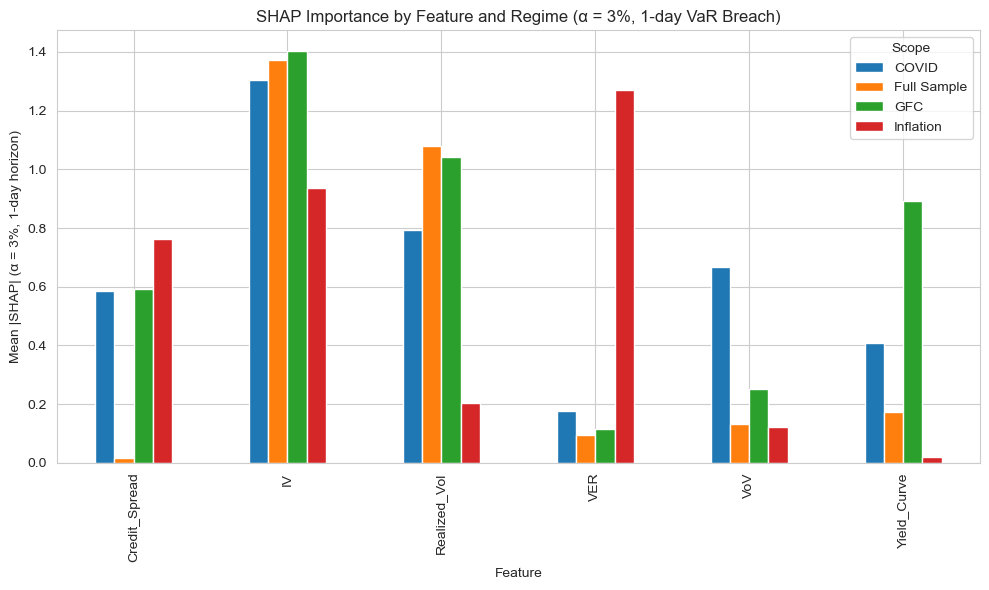

In [50]:
# Filter: alpha = 3%, horizon = 1 day
shap_alpha3_h1 = shap_results[
    (shap_results["Alpha"] == 0.03) &
    (shap_results["ForecastHorizon"] == 1)
].copy()
shap_alpha3_h1["Scope"] = shap_alpha3_h1["Scope"].replace({"Crisis": "GFC"})
shap_alpha3_h1["Feature"] = shap_alpha3_h1["Feature"].replace({"VaR_Ratio": "VER"})

agg = (
    shap_alpha3_h1
    .groupby(["Scope", "Feature"], as_index=False)["MeanAbs_SHAP"]
    .mean()
)


pivot = agg.pivot(index="Feature", columns="Scope", values="MeanAbs_SHAP")


pivot = pivot.sort_index()


ax = pivot.plot(
    kind="bar",
    figsize=(10, 6)
)

ax.set_xlabel("Feature")
ax.set_ylabel("Mean |SHAP| (α = 3%, 1-day horizon)")
ax.set_title("SHAP Importance by Feature and Regime (α = 3%, 1-day VaR Breach)")
ax.legend(title="Scope", loc="best")
plt.tight_layout()
plt.show()
